In [293]:
# Import libraries and modules
%config InlineBackend.figure_format = 'svg'
%matplotlib notebook
# %matplotlib inline
import pandas as pd
import datetime as dt
import numpy as np
from osgeo import osr, gdal, ogr
import matplotlib.pylab as plt
from matplotlib import colors
from matplotlib.pylab import rcParams
import matplotlib.image as mpimg
from matplotlib import pyplot
from matplotlib.pyplot import title, show,colorbar,imshow
from astropy.time import Time
from astropy.time import TimeDelta
import seaborn as sns
# import pysal
sns.set_style('ticks')
rcParams['figure.figsize'] = 8, 4
rcParams['figure.frameon'] = True
import csv
import pyproj,pygaarst
from pygaarst import raster
from pyhdf.SD import SD, SDC
from datetime import datetime
import os.path
import os
import sys
import time
from mpl_toolkits.basemap import Basemap
from sklearn.neighbors import BallTree, ball_tree
from skimage import exposure
from skimage.segmentation import quickshift, felzenszwalb
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.externals import joblib
from sklearn.linear_model import LinearRegression
import glob
import gzip
from setuptools import archive_util
from collections import OrderedDict
import shutil
from shutil import copyfile
import subprocess
from PIL import Image
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
from cycler import cycler
import netCDF4
import math
import cmath
from math import sqrt
from scipy.fftpack import fft
from scipy import stats
from scipy.stats import chi2
import collections  #for additional dictionary functionality
from matplotlib.gridspec import GridSpec #for subplots
import scipy.signal as signal #for signal processing
import xarray as xr
import scipy.signal as sig
import regionmask
import skccm
import copy
import calendar
import operator
import cmocean
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn import preprocessing
# need to add 'numba' in nix shell default

import io, os, sys, types
from IPython import get_ipython
from nbformat import read
from IPython.core.interactiveshell import InteractiveShell

import scipy.io as spio
from netCDF4 import Dataset
import matplotlib.dates as mdates
from datetime import timedelta
from matplotlib.dates import date2num
import matplotlib.gridspec as gridspec
import statsmodels.formula.api as sm
import numpy.ma as ma
from scipy.ndimage.filters import gaussian_filter
from statsmodels.tsa.seasonal import seasonal_decompose
from skccm import Embed
from skccm.utilities import train_test_split
import skedm as edm
from sklearn.linear_model import LinearRegression

import Snow_SST20180522 as Snow

In [13]:
#For color cycling in plots that is color blind friendly...make new ones at "I want hue" tools.medialab.sciences-po.fr/iwanthue
color_cycler = cycler(color=["#6777cf","#adba49","#c65ca0","#5fa042","#683287","#72ce7b","#c44a48","#45c7a9","#933c1d","#d0803f","#ac9239","#317c39"])
colorline_cycler = (cycler(color=["#75a141","#6c61b9","#bc4d45","#c1913d","#b85298","#4aa8e8"]) +
                 cycler(linestyle=['-','--',':','-.','-','--']))
rcParams['axes.prop_cycle'] = cycler('color', color_cycler)

In [14]:
def butterworth(data1,frequency_cutoff):
    ### Butterworth filter
    ### Remove all frequencies smaller than 0.01 (i.e., all periods longer than 100 days).  
    xa=data1-np.mean(data1)

    frequency_cutoff_in_days=1/(frequency_cutoff)
    print("frequency_cutoff: "+str(frequency_cutoff))
    print("frequency_cutoff_in_days: "+str(frequency_cutoff_in_days))

    ### Apply a Butterworth filter (recursive filter) to the data
    N = 2 ## order
    Wn = frequency_cutoff*2 ## scalar given the critical frequency (all higher frequencies are removed)
    ## Note: Wn is normalized from 0 to 1, where 1 is the Nyquist frequency, pi radians/sample. 
    ## Note: (Wn is thus in half-cycles / sample.) 
    b, a = sig.butter(N, Wn,btype='lowpass')
    y = sig.filtfilt(b,a,xa) ## one filter forward, one filter backward - you are filtering twice
    return (y + np.mean(data1))

def create_normalized_redfit(data_length,Te):
    freq = np.arange(0,(data_length/2)+1,1)/float(data_length) # to Nyquist
    red_fit = (2 * Te)/(1 + ((2*np.pi*freq)**2)*(Te**2)) # After Hartmann 6.64, 6.91
    return red_fit/np.sum(red_fit)

def create_f_bounds(alpha,dof,red_fit_n):
    f_ratio = stats.f.ppf(alpha,dof,200) # Note: 200 = large degree of freedom for red noise
    return f_ratio*red_fit_n

def autocorr(x, y, twosided=False, tapered=True):
    """
    Return (lags, ac), where ac is the estimated autocorrelation 
    function for x, at the full set of possible lags.
    
    If twosided is True, all lags will be included;
    otherwise (default), only non-negative lags will be included.

    If tapered is True (default), the low-MSE estimate, linearly
    tapered to zero for large lags, is returned.
    """
    nx = len(x)
    xdm = x - x.mean()
    ydm = y - y.mean()
    ac = np.correlate(xdm, ydm, mode='full')
    ac /= ac[nx - 1]
    lags = np.arange(-nx + 1, nx)
    if not tapered:  # undo the built-in taper
        taper = 1 - np.abs(lags) / float(nx)
        ac /= taper
    if twosided:
        return lags, ac
    else:
        return lags[nx-1:], ac[nx-1:]
    
def crosscorr(datax, datay, lag=0):
    """ Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    
    Example
    ----------
     xcov_monthly = [crosscorr(datax, datay, lag=i) for i in range(12)]
    """
    return datax.corr(datay.shift(lag))

def net_idx(dd, dd_array):
    """
    search for nearest decimal degree in an array of decimal degrees and return the index.
    np.argmin returns the indices of minium value along an axis.
    so subtract dd from all values in dd_array, take absolute value and find index of minium.
    """
    net_idx = (np.abs(dd_array - dd)).argmin()
    return net_idx

def decyr_to_dt(dt):
    '''
    Convert decimal year to date
    '''
    year = int(dt)
    rem = dt-year
    
    base = datetime(year,1,1)
    return base + timedelta(seconds=(base.replace(year=base.year + 1) - base).total_seconds()*rem)

In [15]:
# # Read in all previously calculated data without going through all of this (written in allD concatenation step below)
DataFileD = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/AllDataDaily2020'
DataFileM = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/AllDataMonthly2020'
DataFileA = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/AllDataAnnual2020'

allD = pd.read_pickle(DataFileD)
allM = pd.read_pickle(DataFileM)
allA = pd.read_pickle(DataFileA)

# MDataDAFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataDA'
# MDataDTFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataDT'
# MDataDAnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataDAn'
# MDataDTnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataDTn'

# MDataDA = pd.read_pickle(MDataDAFile) 
# MDataDT = pd.read_pickle(MDataDTFile)
# MDataDAn = pd.read_pickle(MDataDAnFile)
# MDataDTn = pd.read_pickle(MDataDTnFile)

# MDataAFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataA'
# MDataTFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataT'
# MDataAnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAn'
# MDataTnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataTn'

# MDataA = pd.read_pickle(MDataAFile) 
# MDataT = pd.read_pickle(MDataTFile)
# MDataAn = pd.read_pickle(MDataAnFile)
# MDataTn = pd.read_pickle(MDataTnFile)

# MDataAnAFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAnA'
# MDataAnTFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAnT'
# MDataAnAnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAnAn'
# MDataAnTnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAnTn'

# MDataAnA = pd.read_pickle(MDataAnAFile) 
# MDataAnT = pd.read_pickle(MDataAnTFile)
# MDataAnAn = pd.read_pickle(MDataAnAnFile)
# MDataAnTn = pd.read_pickle(MDataAnTnFile)

# # Data by season
# allD_wint = allD.loc[allD.index.month.isin([1,2,3,4,12])]
# allD_sum = allD.loc[allD.index.month.isin([6,7,8,9])]
# allD_notwint = allD.loc[allD.index.month.isin([5,10,11])]

# allM_wint = allM.loc[allM.index.month.isin([1,2,3,4,12])]
# allM_sum = allM.loc[allM.index.month.isin([6,7,8,9])]

# # Seasonal means
# all_wint = allD.loc[allD.index.month.isin([1,2,3,4])]
# all_wint = all_wint.groupby(all_wint.index.year).mean()
# all_wint = all_wint.set_index(pd.date_range('01-Jan-1990', '01-Jan-2018', freq="YS"))
# all_wint.index = all_wint.index + pd.to_timedelta(45,unit='D')
# all_spr = allD.loc[allD.index.month.isin([4,5,6])]
# all_spr = all_spr.groupby(all_spr.index.year).mean()
# all_spr = all_spr.set_index(pd.date_range('01-Jan-1990', '01-Jan-2018', freq="YS"))
# all_spr.index = all_spr.index + pd.to_timedelta(140,unit='D')
# all_sum = allD.loc[allD.index.month.isin([7,8,9])]
# all_sum = all_sum.groupby(all_sum.index.year).mean()
# all_sum = all_sum.set_index(pd.date_range('01-Jan-1990', '01-Jan-2018', freq="YS"))
# all_sum.index = all_sum.index + pd.to_timedelta(225,unit='D')
# all_fal = allD.loc[allD.index.month.isin([10,11,12])]
# all_fal = all_fal.groupby(all_fal.index.year).mean()
# all_fal = all_fal.set_index(pd.date_range('01-Jan-1990', '01-Jan-2018', freq="YS"))
# all_fal.index = all_fal.index + pd.to_timedelta(315,unit='D')

In [16]:
# # MODIS shelf transects
# # _line.csv (straight line across shelf) and _trough.csv (line following N edge of trough)
# col = ('Date','1 mean','1 anom','1 count','2 mean','2 anom','2 count','3 mean','3 anom','3 count','4 mean','4 anom','4 count','5 mean','5 anom','5 count','6 mean','6 anom','6 count','7 mean','7 anom','7 count','8 mean','8 anom','8 count','9 mean','9 anom','9 count','10 mean','10 anom','10 count','11 mean','11 anom','11 count','12 mean','12 anom','12 count','13 mean','13 anom','13 count')
# # Aqua
# lineA = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/AquaMODISsst4km_trough20191113.csv', index_col=0, parse_dates=True, names = col, na_values='--')
# # Aqua Night
# lineAn = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/AquaNightMODISsst4km_trough20191113.csv', index_col=0, parse_dates=True, names = col, na_values='--')
# # Terra
# lineT = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/TerraMODISsst4km_trough20191113.csv', index_col=0, parse_dates=True, names = col, na_values='--')
# # Terra Night
# lineTn = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/TerraNightMODISsst4km_trough20191113.csv', index_col=0, parse_dates=True, names = col, na_values='--')
# lineTn.head(2)

In [17]:
# # MODIS EGCC transects
# # same as trough except moved north and without boxes 4 and 13
# colEgc = ('Date','1 mean','1 anom','1 count','2 mean','2 anom','2 count','3 mean','3 anom','3 count','5 mean','5 anom','5 count','6 mean','6 anom','6 count','7 mean','7 anom','7 count','8 mean','8 anom','8 count','9 mean','9 anom','9 count','10 mean','10 anom','10 count','11 mean','11 anom','11 count','12 mean','12 anom','12 count',)
# # Aqua
# lineEgcA = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/AquaMODISsst4km_EGCCtransect.csv', index_col=0, parse_dates=True, names = colEgc, na_values='--')
# # Aqua Night
# lineEgcAn = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/AquaNightMODISsst4km_EGCCtransect.csv', index_col=0, parse_dates=True, names = colEgc, na_values='--')
# # Terra
# lineEgcT = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/TerraMODISsst4km_EGCCtransect.csv', index_col=0, parse_dates=True, names = colEgc, na_values='--')
# # Terra Night
# lineEgcTn = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/TerraNightMODISsst4km_EGCCtransect.csv', index_col=0, parse_dates=True, names = colEgc, na_values='--')
# lineEgcTn.head(2)

In [313]:
# Shelf mooring data

# 150m

# 2009 - 2010 @ 155m     
file_shelf150 = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/0127320/1.1/data/1-data/GP09_CM5_TidbiT_155.nc'
shelf150 = Dataset(file_shelf150, mode='r')
time_shelf150 = shelf150.variables['time'][:]
start_shelf150 = shelf150.time_coverage_start
end_shelf150 = shelf150.time_coverage_end
temp_shelf150 = shelf150.variables['temperature'][:]
temp_qc_shelf150 = shelf150.variables['temperature_qc'][:]
temp_shelf150 = ma.masked_where(temp_qc_shelf150==1,temp_shelf150)
print start_shelf150
print end_shelf150
data09shelf150 = pd.DataFrame(temp_shelf150,columns=['Tempshelf150m'])
data09shelf150['Datetime'] = pd.date_range(start_shelf150, end_shelf150, freq="30min")
data09shelf150 = data09shelf150.set_index('Datetime')
data09shelf150 = data09shelf150.groupby(data09shelf150.index.date).mean()
data09shelf150.head()

# 2010 - 2011 @ 155m     
file_shelf150 = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/0123282/2.2/data/1-data/SF10_CM5_TidbiT_155.nc'
shelf150 = Dataset(file_shelf150, mode='r')
time_shelf150 = shelf150.variables['time'][:]
start_shelf150 = shelf150.time_coverage_start
end_shelf150 = shelf150.time_coverage_end
temp_shelf150 = shelf150.variables['temperature'][:]
temp_qc_shelf150 = shelf150.variables['temperature_qc'][:]
temp_shelf150 = ma.masked_where(temp_qc_shelf150==1,temp_shelf150)
print start_shelf150
print end_shelf150
data10shelf150 = pd.DataFrame(temp_shelf150,columns=['Tempshelf150m'])
data10shelf150['Datetime'] = pd.date_range(start_shelf150, end_shelf150, freq="10min")
data10shelf150 = data10shelf150.set_index('Datetime')
data10shelf150 = data10shelf150.groupby(data10shelf150.index.date).mean()
data10shelf150.head()

all_shelf150 = pd.concat([data10shelf150,data09shelf150],axis=0)
all_shelf150.index = pd.to_datetime(all_shelf150.index)
all_shelf150.head()

# 290m

# 2009 - 2010 @ 294m     
file_shelf290 = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/0127320/1.1/data/1-data/GP09_CM6_mc_294.nc'
shelf290 = Dataset(file_shelf290, mode='r')
time_shelf290 = shelf290.variables['time'][:]
start_shelf290 = shelf290.time_coverage_start
end_shelf290 = shelf290.time_coverage_end
cond_shelf290 = shelf290.variables['conductivity'][:]
cond_qc_shelf290 = shelf290.variables['conductivity_qc'][:]
temp_shelf290 = shelf290.variables['temperature'][:]
temp_qc_shelf290 = shelf290.variables['temperature_qc'][:]
cond_shelf290 = ma.masked_where(cond_qc_shelf290==1,cond_shelf290)
temp_shelf290 = ma.masked_where(temp_qc_shelf290==1,temp_shelf290)
print start_shelf290
print end_shelf290
data09shelf290 = pd.concat([pd.DataFrame(temp_shelf290,columns=['Tempshelf290m']),pd.DataFrame(cond_shelf290,columns=['Condshelf290m'])], axis=1)
data09shelf290['Datetime'] = pd.date_range(start_shelf290, end_shelf290, freq="15min")
data09shelf290 = data09shelf290.set_index('Datetime')
data09shelf290 = data09shelf290.groupby(data09shelf290.index.date).mean()
data09shelf290.head()

# 2010 - 2011 @ 262m     
file_shelf290 = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/0123282/2.2/data/1-data/SF10_CM5_mc_262.nc'
shelf290 = Dataset(file_shelf290, mode='r')
time_shelf290 = shelf290.variables['time'][:]
start_shelf290 = shelf290.time_coverage_start
end_shelf290 = shelf290.time_coverage_end
cond_shelf290 = shelf290.variables['conductivity'][:]
cond_qc_shelf290 = shelf290.variables['conductivity_qc'][:]
temp_shelf290 = shelf290.variables['temperature'][:]
temp_qc_shelf290 = shelf290.variables['temperature_qc'][:]
cond_shelf290 = ma.masked_where(cond_qc_shelf290==1,cond_shelf290)
temp_shelf290 = ma.masked_where(temp_qc_shelf290==1,temp_shelf290)
print start_shelf290
print end_shelf290
data10shelf290 = pd.concat([pd.DataFrame(temp_shelf290,columns=['Tempshelf290m']),pd.DataFrame(cond_shelf290,columns=['Condshelf290m'])], axis=1)
data10shelf290['Datetime'] = pd.date_range(start_shelf290, end_shelf290, freq="10min")
data10shelf290 = data10shelf290.set_index('Datetime')
data10shelf290 = data10shelf290.groupby(data10shelf290.index.date).mean()
data10shelf290.head()

# 2011 - 2012 @ 305m     #Close to N bank
file_shelf290 = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/0126772/2.2/data/1-data/SF11_OE1_XR420_305.nc'
shelf290 = Dataset(file_shelf290, mode='r')
time_shelf290 = shelf290.variables['time'][:]
start_shelf290 = shelf290.time_coverage_start
end_shelf290 = shelf290.time_coverage_end
cond_shelf290 = shelf290.variables['conductivity'][:]
cond_qc_shelf290 = shelf290.variables['conductivity_qc'][:]
temp_shelf290 = shelf290.variables['temperature'][:]
temp_qc_shelf290 = shelf290.variables['temperature_qc'][:]
cond_shelf290 = ma.masked_where(cond_qc_shelf290==1,cond_shelf290)
temp_shelf290 = ma.masked_where(temp_qc_shelf290==1,temp_shelf290)
print start_shelf290
print end_shelf290
data11shelf290 = pd.concat([pd.DataFrame(temp_shelf290,columns=['Tempshelf290m']),pd.DataFrame(cond_shelf290,columns=['Condshelf290m'])], axis=1)
data11shelf290['Datetime'] = pd.date_range(start_shelf290, end_shelf290, freq="10min")
data11shelf290 = data11shelf290.set_index('Datetime')
data11shelf290 = data11shelf290.groupby(data11shelf290.index.date).mean()
data11shelf290.head()

# 2012 - 2013 @ 285m     
file_shelf290 = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/0127325/1.1/data/1-data/SF12_CM5_mc_285.nc'
shelf290 = Dataset(file_shelf290, mode='r')
time_shelf290 = shelf290.variables['time'][:]
start_shelf290 = shelf290.time_coverage_start
end_shelf290 = shelf290.time_coverage_end
cond_shelf290 = shelf290.variables['conductivity'][:]
cond_qc_shelf290 = shelf290.variables['conductivity_qc'][:]
temp_shelf290 = shelf290.variables['temperature'][:]
temp_qc_shelf290 = shelf290.variables['temperature_qc'][:]
cond_shelf290 = ma.masked_where(cond_qc_shelf290==1,cond_shelf290)
temp_shelf290 = ma.masked_where(temp_qc_shelf290==1,temp_shelf290)
print start_shelf290
print end_shelf290
data12shelf290 = pd.concat([pd.DataFrame(temp_shelf290,columns=['Tempshelf290m']),pd.DataFrame(cond_shelf290,columns=['Condshelf290m'])], axis=1)
data12shelf290['Datetime'] = pd.date_range(start_shelf290, end_shelf290, freq="450S")
data12shelf290 = data12shelf290.set_index('Datetime')
data12shelf290 = data12shelf290.groupby(data12shelf290.index.date).mean()
data12shelf290.head()

all_shelf290 = pd.concat([data09shelf290,data10shelf290,data11shelf290,data12shelf290],axis=0) 
all_shelf290.index = pd.to_datetime(all_shelf290.index)
all_shelf290.head()


# 550m

# 2010 - 2011 @ 505m     Mouth
file_shelf550 = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/0123282/2.2/data/1-data/SF10_SF4_mc_505.nc'
shelf550 = Dataset(file_shelf550, mode='r')
time_shelf550 = shelf550.variables['time'][:]
start_shelf550 = shelf550.time_coverage_start
end_shelf550 = shelf550.time_coverage_end
cond_shelf550 = shelf550.variables['conductivity'][:]
cond_qc_shelf550 = shelf550.variables['conductivity_qc'][:]
temp_shelf550 = shelf550.variables['temperature'][:]
temp_qc_shelf550 = shelf550.variables['temperature_qc'][:]
cond_shelf550 = ma.masked_where(cond_qc_shelf550==1,cond_shelf550)
temp_shelf550 = ma.masked_where(temp_qc_shelf550==1,temp_shelf550)
print start_shelf550
print end_shelf550
data10shelf550 = pd.concat([pd.DataFrame(temp_shelf550,columns=['Tempshelf550m']),pd.DataFrame(cond_shelf550,columns=['Condshelf550m'])], axis=1)
data10shelf550['Datetime'] = pd.date_range(start_shelf550, end_shelf550, freq="10min")
data10shelf550 = data10shelf550.set_index('Datetime')
data10shelf550 = data10shelf550.groupby(data10shelf550.index.date).mean()
data10shelf550.head()

all_shelf550 = pd.concat([data10shelf550],axis=0)
all_shelf550.index = pd.to_datetime(all_shelf550.index)
all_shelf550.head()

all_shelf150 = all_shelf150.loc[~all_shelf150.index.duplicated(keep='first')]  # make sure no duplicates of dates
all_shelf290 = all_shelf290.loc[~all_shelf290.index.duplicated(keep='first')] 
all_shelf550 = all_shelf550.loc[~all_shelf550.index.duplicated(keep='first')] 


# Concatenate all mooring data
all_shelfmoorD = pd.concat([all_shelf150,all_shelf550,all_shelf290],axis=1)   
all_shelfmoorD = all_shelfmoorD.loc[~all_shelfmoorD.index.duplicated(keep='first')] 
all_shelfmoorD.head(2)

24-Aug-2009 21:30:00 UTC
22-Aug-2010 11:00:00 UTC
22-Aug-2010 18:40:00 UTC
20-Jun-2011 08:20:00 UTC
24-Aug-2009 22:30:08 UTC
22-Aug-2010 13:30:08 UTC
22-Aug-2010 19:00:00 UTC
15-Aug-2011 18:20:01 UTC
24-Aug-2011 17:30:00 UTC
15-Sep-2012 10:50:00 UTC
20-Sep-2012 11:37:31 UTC
18-Aug-2013 17:00:01 UTC
28-Aug-2010 15:00:01 UTC
15-Aug-2011 21:50:01 UTC


,Tempshelf150m,Tempshelf550m,Condshelf550m,Tempshelf290m,Condshelf290m
2009-08-24,1.124600,NaN,NaN,2.342500,3.076235
2009-08-25,1.901271,NaN,NaN,1.989906,3.040880


In [353]:
# OOI IC mooring data
ICdir = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/OOI_Irminger'
ICfiles = [f for f in os.listdir(ICdir)] 

OOItemp = []
time_array = []

try:
    del temp_array,time_array,temp_array60,time_array60,temp_array80,time_array80,temp_array100,time_array100
except:
    print 'no old variable to delete'

for ICfile in ICfiles:
    if ICfile.startswith('180'):
        file_IC = ICdir + '/' + ICfile
        ICdata = Dataset(file_IC, mode='r')
        time_IC = ICdata.variables['time']
        temp_IC = ICdata.variables['ctdmo_seawater_temperature'][:]

        time_ICconv = pd.to_datetime(netCDF4.num2date(time_IC[:], time_IC.units, time_IC.calendar))
        
        try:
            temp_array = np.concatenate([temp_array,temp_IC],axis=0)
            time_array = np.concatenate([time_array,time_ICconv],axis=0)
        except:
            temp_array = temp_IC
            time_array = time_ICconv
        ICdata.close()

moorICH180 = pd.concat([pd.DataFrame(time_array,columns=['Datetime']),pd.DataFrame(temp_array,columns=['TempIC180m'])],axis=1)
moorICH180 = moorICH180.set_index('Datetime')
moorICH180 = moorICH180.sort_index()
moorICH180['2017-10':'2018-06']['TempIC180m'] = np.nan
moorICD180 = moorICH180.resample("D").mean()
moorICD180 = moorICD180.loc[~moorICD180.index.duplicated(keep='first')]

moorICD = moorICD180
moorICD = moorICD.loc[~moorICD.index.duplicated(keep='first')]
moorICD.index = pd.to_datetime(moorICD.index)
moorICM = moorICD.resample("MS").mean()
moorICM.head(5)

/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,TempIC180m
Datetime,
2014-09-01,4.518669
2014-10-01,4.458082
2014-11-01,4.932522
2014-12-01,4.615780
2015-01-01,4.216124


In [354]:
# ERA-5 Winds data
# Averaged for designated box to make timeseries - every 6 hrs
# Wind deg = direction from, U/V going towards - wind deg of 60 is along shore winds that are -U and -V
# Winds SW = V is pos with alongshore winds and windDegSW will be 180

# Desired dates and lat/lon for ERA sammpling
latboundswind = [ 64 , 65 ] # Serm Shelf edge/trough
lonboundswind = [ -36 , -34 ] 

# Simple boundary boxes for IC, EGCC, and shelf
latboundsb = [ 62.5 , 66.5 ] # Entire Serm Shelf
lonboundsb = [ -41 , -33 ]
latboundsI = [ 62.5 , 64.0 ]
lonboundsI = [ -35.5 , -33.0 ]
EGCm_coords = [[-33.9,66.5],[-33.4,66.1],[-36.0,65.1],[-36.5,65.5]] # for box diagonal to grid
latboundsshelf = [ 64.5 , 65.00 ]
lonboundsshelf = [ -38.0 , -36.0 ]

yearStart = 1990
yearEnd = 2018
monthStart = 1
monthEnd = 12

meantemp = []
meanwindspd = []
meanwindu = []
meanwindv = []
time_array = []

# Get lats and lons and spatial sampling box indices here because same for every image
bdir = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/ERA5/'
ref = os.listdir(bdir)[1]
fhref = Dataset(bdir+ref, mode='r')  
lat_era = fhref.variables['latitude'][:]
if fhref.variables['longitude'][0] > 0:
    lon_era = fhref.variables['longitude'][:]-360
else:
    lon_era = fhref.variables['longitude'][:]
lat_indsb = np.where((lat_era > latboundsb[0]) & (lat_era < latboundsb[1]))
lon_indsb = np.where((lon_era > lonboundsb[0]) & (lon_era < lonboundsb[1]))
lats_sub = lat_era[lat_indsb[0]] # subsetting lat lon so can sample later
lons_sub = lon_era[lon_indsb[0]] # subsetting lat lon so can sample later
lat_indswind = np.where((lat_era >= latboundswind[0]) & (lat_era <= latboundswind[1]))
lon_indswind = np.where((lon_era >= lonboundswind[0]) & (lon_era <= lonboundswind[1]))
lat_indsI = np.where((lat_era >= latboundsI[0]) & (lat_era <= latboundsI[1]))
lon_indsI = np.where((lon_era >= lonboundsI[0]) & (lon_era <= lonboundsI[1]))
lat_indsS = np.where((lat_era >= latboundsshelf[0]) & (lat_era <= latboundsshelf[1]))
lon_indsS = np.where((lon_era >= lonboundsshelf[0]) & (lon_era <= lonboundsshelf[1]))

# For diagonal EGCC box
EGCmask_coords = regionmask.Regions_cls('EGCmask',[0],['EGCC'],['E'],[EGCm_coords])
EGCCbox = EGCmask_coords.mask(lons_sub,lats_sub,xarray=False)

try:
    del temp_array,tempI_array,tempS_array,tempE_array,windspd_array,windu_array,windv_array,time_array
except:
    print 'no old variable to delete'

for year in list(range(yearStart, yearEnd + 1)):
    for month in list(range(monthStart, monthEnd + 1)):
        file_era = bdir + "/era5_daily_%04d%02d.nc" % (year, month)
        era = Dataset(file_era, mode='r')
        time_era= era.variables['time']

        temp_era = era.variables['t2m'][:,lat_indswind[0],lon_indswind[0]]
        tempI = era.variables['t2m'][:,lat_indsI[0],lon_indsI[0]]
        tempS = era.variables['t2m'][:,lat_indsS[0],lon_indsS[0]]

        # EGCC sample
        tempb = era.variables['t2m'][:,lat_indsb[0],lon_indsb[0]]
        EGCCboxstack = np.moveaxis(np.dstack([EGCCbox]*(tempb.shape[0])), 2, 0)
        tempE = ma.masked_where(np.isnan(EGCCboxstack),tempb) # for box diagonal to grid
        
        windu_era = era.variables['u10'][:,lat_indswind[0],lon_indswind[0]]
        windv_era = era.variables['v10'][:,lat_indswind[0],lon_indswind[0]]
        windspd_era = np.sqrt(windu_era**2 + windv_era**2)
        
        time_eraconv = pd.to_datetime(netCDF4.num2date(time_era[:], time_era.units, time_era.calendar))

        
        try:
            temp_array = np.dstack((temp_array, np.moveaxis(temp_era, 0, -1)))
            tempI_array = np.dstack((tempI_array, np.moveaxis(tempI, 0, -1)))
            tempS_array = np.dstack((tempS_array, np.moveaxis(tempS, 0, -1)))
            tempE_array = np.dstack((tempE_array, np.moveaxis(tempE, 0, -1)))
            windspd_array = np.dstack((windspd_array, np.moveaxis(windspd_era, 0, -1)))
            windu_array = np.dstack((windu_array, np.moveaxis(windu_era, 0, -1)))
            windv_array = np.dstack((windv_array, np.moveaxis(windv_era, 0, -1)))
            time_array = np.concatenate([time_array,time_eraconv],axis=0)
        except:
            temp_array = np.moveaxis(temp_era, 0, -1)
            tempI_array = np.moveaxis(tempI, 0, -1)
            tempS_array = np.moveaxis(tempS, 0, -1)
            tempE_array = np.moveaxis(tempE, 0, -1)
            windspd_array = np.moveaxis(windspd_era, 0, -1)
            windu_array = np.moveaxis(windu_era, 0, -1)
            windv_array = np.moveaxis(windv_era, 0, -1)
            time_array = time_eraconv
        era.close()

meantemp = np.nanmean(temp_array,axis=tuple([0,1]))-273.15
meantempI = np.nanmean(tempI_array,axis=tuple([0,1]))-273.15
meantempS = np.nanmean(tempS_array,axis=tuple([0,1]))-273.15
meantempE = np.nanmean(tempE_array,axis=tuple([0,1]))-273.15
meanwindspd = np.nanmean(windspd_array,axis=tuple([0,1]))
meanwindu = np.nanmean(windu_array,axis=tuple([0,1]))
meanwindv = np.nanmean(windv_array,axis=tuple([0,1]))

era5WindH = pd.concat([pd.DataFrame(time_array,columns=['Datetime']),pd.DataFrame(meantemp,columns=['ERA5AirTemp']),pd.DataFrame(meantempI,columns=['ERA5AirTempI']),pd.DataFrame(meantempS,columns=['ERA5AirTempS']),pd.DataFrame(meantempE,columns=['ERA5AirTempE']),pd.DataFrame(meanwindspd,columns=['ERA5WindSpd']),pd.DataFrame(meanwindu,columns=['ERA5WindU']),pd.DataFrame(meanwindv,columns=['ERA5WindV'])],axis=1)
era5WindH = era5WindH.set_index('Datetime')
era5WindD = era5WindH.resample("D").mean()
era5WindD['ERA5WindDeg'] = (270 - np.degrees(np.arctan2(era5WindD['ERA5WindV'],era5WindD['ERA5WindU'])) + 360) % 360
era5WindD['ERA5WindDegSW'] = ((130 + era5WindD['ERA5WindDeg']) + 360) % 360
era5WindD['ERA5WindUSW'] = -era5WindD['ERA5WindSpd']*np.sin(np.radians(era5WindD['ERA5WindDegSW']))
era5WindD['ERA5WindVSW'] = -era5WindD['ERA5WindSpd']*np.cos(np.radians(era5WindD['ERA5WindDegSW'])) # pos V is along-shore wind
era5WindD = era5WindD.loc[~era5WindD.index.duplicated(keep='first')]
era5WindD.index = pd.to_datetime(era5WindD.index)
era5WindD.head(5)

,ERA5AirTemp,ERA5AirTempI,ERA5AirTempS,ERA5AirTempE,ERA5WindSpd,ERA5WindU,ERA5WindV,ERA5WindDeg,ERA5WindDegSW,ERA5WindUSW,ERA5WindVSW
Datetime,,,,,,,,,,,
1990-01-01,3.326972,3.695721,1.903051,1.478064,6.676843,-2.132780,4.215209,153.161846,283.161846,6.501447,-1.520334
1990-01-02,2.333076,3.061406,1.412447,-0.000491,9.527342,-7.512372,4.962116,123.445794,253.445794,9.132440,2.714553
1990-01-03,2.563456,3.646612,0.669555,0.244851,14.934892,-13.130852,-1.106449,85.183445,215.183445,8.605428,12.206458
1990-01-04,3.276495,3.946455,1.995331,1.096654,8.598379,-6.972063,4.432566,122.446612,252.446612,8.198007,2.593223
1990-01-05,3.017881,3.652134,1.696274,0.806896,8.236673,-6.038639,4.674544,127.743653,257.743653,8.048939,1.748530


In [355]:
# Discharge data from M. King(2020)
iceFileH = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/GlacierDischarge/Data/Helheim_Discharge20200120.txt'
disch = pd.read_csv(iceFileH,sep=' ',header=0)
del disch['Year'],disch['Discharge'],disch['(Gt/yr)'],disch['1-sigma'],disch['error'],disch['(Gt/yr).1']
disch.columns = ['Year','Discharge','Error']

disch['Datetime'] = disch['Year'].apply(decyr_to_dt).dt.strftime('%Y-%m-%d').astype('datetime64')
del disch['Year']
disch = disch.set_index('Datetime')
disch = disch.loc[~disch.index.duplicated(keep='first')]
disch.index = pd.to_datetime(disch.index)
disch.head(2)

,Discharge,Error
Datetime,,
1985-03-24,20.65,2.01
1985-03-25,20.64,2.00


In [319]:
# MODIS Daily 4km data
AquaFile = '/Volumes/Colossus/SST_Helheim_images/Results/AquaMODISsst4km_masked20191111.csv'
AquaNightFile = '/Volumes/Colossus/SST_Helheim_images/Results/AquaNightMODISsst4km_masked20191111.csv'
TerraFile = '/Volumes/Colossus/SST_Helheim_images/Results/TerraMODISsst4km_masked20191111.csv'
TerraNightFile = '/Volumes/Colossus/SST_Helheim_images/Results/TerraNightMODISsst4km_masked20191111.csv'
colA = ('Date','AMean_10pix','AMeanAnomaly_10pix','AErr_10pix','AMax','AMaxAnomaly','AMean','AMeanAnomaly','AErr','AStdev','AICMean','AICErr','AICStdev','AEgcMean','AEgcMeanAnomaly','AEgcErr','AEgcStdev','AZ4Mean','AZ4Err','AZ4Stdev','AZ4MeanAnomaly','ACount','AICCount','AEgcCount')
colAn = ('Date','AnMean_10pix','AnMeanAnomaly_10pix','AnErr_10pix','AnMax','AnMaxAnomaly','AnMean','AnMeanAnomaly','AnErr','AnStdev','AnICMean','AnICErr','AnICStdev','AnEgcMean','AnEgcMeanAnomaly','AnEgcErr','AnEgcStdev','AnZ4Mean','AnZ4Err','AnZ4Stdev','AnZ4MeanAnomaly','AnCount','AnICCount','AnEgcCount')
colT = ('Date','TMean_10pix','TMeanAnomaly_10pix','TErr_10pix','TMax','TMaxAnomaly','TMean','TMeanAnomaly','TErr','TStdev','TICMean','TICErr','TICStdev','TEgcMean','TEgcMeanAnomaly','TEgcErr','TEgcStdev','TZ4Mean','TZ4Err','TZ4Stdev','TZ4MeanAnomaly','TCount','TICCount','TEgcCount')
colTn = ('Date','TnMean_10pix','TnMeanAnomaly_10pix','TnErr_10pix','TnMax','TnMaxAnomaly','TnMean','TnMeanAnomaly','TnErr','TnStdev','TnICMean','TnICErr','TnICStdev','TnEgcMean','TnEgcMeanAnomaly','TnEgcErr','TnEgcStdev','TnZ4Mean','TnZ4Err','TnZ4Stdev','TnZ4MeanAnomaly','TnCount','TnICCount','TnEgcCount')

# MODIS Aqua daytime daily 4km Level 3
MDataDA = pd.read_csv(AquaFile, index_col=0, parse_dates=True, names = colA, na_values='--')

MDataDA['Year'] = MDataDA.index.year
MDataDA['Month'] = MDataDA.index.month
MDataDA = MDataDA.sort_index() 
MDataDA = MDataDA.loc[~MDataDA.index.duplicated(keep='first')] 
MDataDA['AEgcMean_cut'] = MDataDA['AEgcMean'].loc[MDataDA.index.dayofyear.isin(range(128,367))]
MDataDA = MDataDA.loc[~MDataDA.index.duplicated(keep='first')] 

# MODIS Aqua nighttime daily 4km Level 3
MDataDAn = pd.read_csv(AquaNightFile, index_col=0, parse_dates=True, names = colAn, na_values='--')
MDataDAn['Year'] = MDataDAn.index.year
MDataDAn['Month'] = MDataDAn.index.month
MDataDAn = MDataDAn.sort_index() 
MDataDAn = MDataDAn.loc[~MDataDAn.index.duplicated(keep='first')] 
MDataDAn['AnEgcMean_cut'] = MDataDAn['AnEgcMean'].loc[MDataDAn.index.dayofyear.isin(range(1,138)+range(203,367))]
MDataDAn = MDataDAn.loc[~MDataDAn.index.duplicated(keep='first')] 

# MODIS Terra daytime daily 4km Level 3
MDataDT = pd.read_csv(TerraFile, index_col=0, parse_dates=True, names = colT, na_values='--')
MDataDT['Year'] = MDataDT.index.year
MDataDT['Month'] = MDataDT.index.month
MDataDT = MDataDT.sort_index()
MDataDT = MDataDT.loc[~MDataDT.index.duplicated(keep='first')] 
MDataDT['TEgcMean_cut'] = MDataDT['TEgcMean'].loc[MDataDT.index.dayofyear.isin(range(128,367))]
MDataDT = MDataDT.loc[~MDataDT.index.duplicated(keep='first')] 

# MODIS Terra nighttime daily 4km Level 3
MDataDTn = pd.read_csv(TerraNightFile, index_col=0, parse_dates=True, names = colTn, na_values='--')
MDataDTn['Year'] = MDataDTn.index.year
MDataDTn['Month'] = MDataDTn.index.month
MDataDTn = MDataDTn.sort_index()
MDataDTn = MDataDTn.loc[~MDataDTn.index.duplicated(keep='first')] 
MDataDTn['TnEgcMean_cut'] = MDataDTn['TnEgcMean'].loc[MDataDTn.index.dayofyear.isin(range(1,138)+range(203,367))]
MDataDTn = MDataDTn.loc[~MDataDTn.index.duplicated(keep='first')] 



# Create daily day and night averages
MDataDT['DayICMean'] = pd.concat([MDataDA['AICMean'],MDataDT['TICMean']],axis=1).mean(axis=1,skipna=True)
MDataDTn['NightICMean'] = pd.concat([MDataDAn['AnICMean'],MDataDTn['TnICMean']],axis=1).mean(axis=1,skipna=True)

MDataDT['DayShelfMean'] = pd.concat([MDataDA['AMean'],MDataDT['TMean']],axis=1).mean(axis=1,skipna=True)
MDataDTn['NightShelfMean'] = pd.concat([MDataDAn['AnMean'],MDataDTn['TnMean']],axis=1).mean(axis=1,skipna=True)

MDataDT['DayShelfMeanAnomaly'] = pd.concat([MDataDA['AMeanAnomaly'],MDataDT['TMeanAnomaly']],axis=1).mean(axis=1,skipna=True)
MDataDTn['NightShelfMeanAnomaly'] = pd.concat([MDataDAn['AnMeanAnomaly'],MDataDTn['TnMeanAnomaly']],axis=1).mean(axis=1,skipna=True)

MDataDT['DayEgcMean_cut'] = pd.concat([MDataDT['TEgcMean_cut'],MDataDA['AEgcMean_cut']],axis=1).mean(axis=1,skipna=True)
MDataDTn['NightEgcMean_cut'] = pd.concat([MDataDTn['TnEgcMean_cut'],MDataDAn['AnEgcMean_cut']],axis=1).mean(axis=1,skipna=True)

MDataDT['DayEgcMean'] = pd.concat([MDataDT['TEgcMean'],MDataDA['AEgcMean']],axis=1).mean(axis=1,skipna=True)
MDataDTn['NightEgcMean'] = pd.concat([MDataDTn['TnEgcMean'],MDataDAn['AnEgcMean']],axis=1).mean(axis=1,skipna=True)

MDataDA.head(2)

,AMean_10pix,AMeanAnomaly_10pix,AErr_10pix,AMax,AMaxAnomaly,AMean,AMeanAnomaly,AErr,AStdev,AICMean,...,AZ4Mean,AZ4Err,AZ4Stdev,AZ4MeanAnomaly,ACount,AICCount,AEgcCount,Year,Month,AEgcMean_cut
Date,,,,,,,,,,,,,,,,,,,,,
2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.502753,...,NaN,NaN,NaN,NaN,0,741,0,2002,7,NaN
2002-07-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,2002,7,NaN


<IPython.core.display.Javascript object>


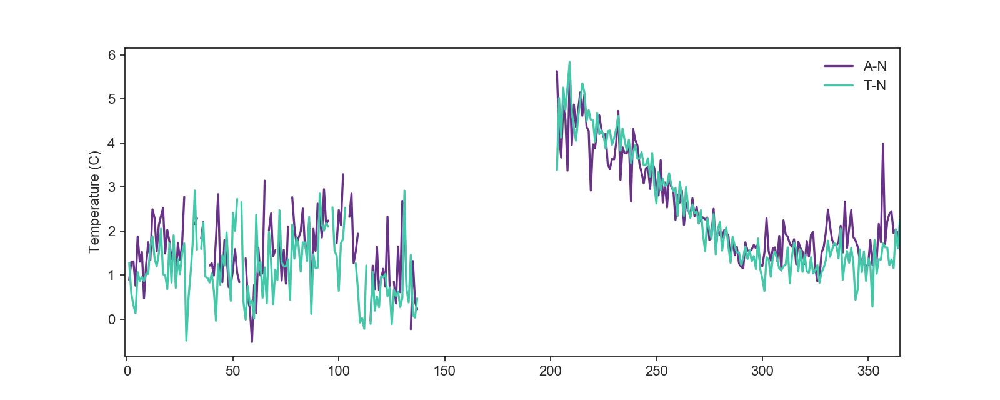

(-1, 365)

In [320]:
gs=GridSpec(1,1)
f=plt.figure(figsize=(10,4))
fig=plt.subplot(gs[0,0])
# plt.plot(MDataDA['AEgcMean_cut'].groupby([MDataDA.index.dayofyear]).mean(),'-C1',linewidth = 1.5, label = 'A-D')
# plt.plot(MDataDT['DayEgcMean_cut'].groupby([MDataDT.index.dayofyear]).mean(),'-C6',linewidth = 3, label = 'Day')
plt.plot(MDataDAn['AnEgcMean_cut'].groupby([MDataDAn.index.dayofyear]).mean(),'-C4',linewidth = 1.5, label = 'A-N')
# plt.plot(MDataDT['TEgcMean_cut'].groupby([MDataDT.index.dayofyear]).mean(),'-C6',linewidth = 1.5, label = 'T-D')
plt.plot(MDataDTn['TnEgcMean_cut'].groupby([MDataDTn.index.dayofyear]).mean(),'-C7',linewidth = 1.5, label = 'T-N')
# plt.plot(MDataDTn['NightEgcMean_cut'].groupby([MDataDTn.index.dayofyear]).mean(),'-C4',linewidth = 3, label = 'Night')
plt.legend(frameon = False,fontsize = 10)
plt.ylabel('Temperature (C)')
plt.xlim(-1,365) 

# Shelf Trough sampling box location sensitivity test

In [321]:
# MODIS shelf box location test
col = ('Date','Mean2','Anomaly2','Count2','Mean3','Anomaly3','Count3','Mean4','Anomaly4','Count4','Mean5','Anomaly5','Count5','Mean6','Anomaly6','Count6')
MDataloc = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/TnMODISsst4km_loc.csv', index_col=0, parse_dates=True, names = col, na_values='--')
MDataloc['Year'] = MDataloc.index.year
MDataloc['Month'] = MDataloc.index.month
MDataloc = MDataloc.sort_index() 
MDataloc['ShTr'] = MDataDTn['2001':'2017']['TnMean'].resample('MS').mean()
MDataloc.head(2)

,Mean2,Anomaly2,Count2,Mean3,Anomaly3,Count3,Mean4,Anomaly4,Count4,Mean5,Anomaly5,Count5,Mean6,Anomaly6,Count6,Year,Month,ShTr
Date,,,,,,,,,,,,,,,,,,
2001-01-01,2.286212,-2.590432,2.223958,2.364253,-2.514524,2.927083,2.525504,-2.366596,3.066092,1.895225,-2.99167,2.781250,1.937223,-2.915665,2.480392,2001,1,2.280998
2001-02-01,2.693836,-2.297191,6.222222,2.853573,-2.113923,6.331597,2.953589,-2.021905,6.100575,2.544753,-2.38993,7.152778,2.618080,-2.327589,6.492647,2001,2,3.026037


<IPython.core.display.Javascript object>


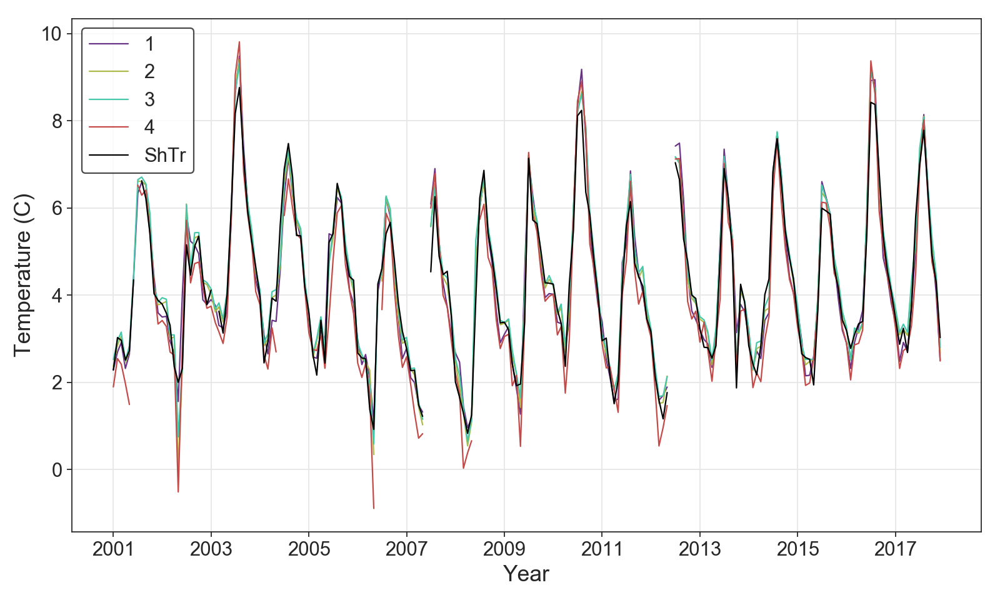

In [322]:
ShTrData = MDataDTn['TnMean'].resample('MS').mean()

fig, axs = plt.subplots(figsize=(10, 6))

axs.set_facecolor('white')
plt.grid(color='.9')
plt.tick_params(labelsize=14)
plt.plot(MDataloc.index,MDataloc['Mean2'],c='C4',linewidth=1,label='1')
plt.plot(MDataloc.index,MDataloc['Mean3'],c='C1',linewidth=1,label='2')
plt.plot(MDataloc.index,MDataloc['Mean4'],c='C7',linewidth=1,label='3')
plt.plot(MDataloc.index,MDataloc['Mean5'],c='C6',linewidth=1,label='4')
plt.plot(MDataloc.index,MDataloc['ShTr'],c='k',linewidth=1,label='ShTr')
plt.legend(loc='upper left',markerscale=3,fontsize=14,edgecolor='0.1',facecolor='white') 
plt.ylabel('Temperature (C)',fontsize=16)
plt.xlabel('Year',fontsize=16)

plt.tight_layout()
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/LocSensAnalysis.jpg', format='jpg', dpi=600)
plt.show()

In [323]:
one = 'ShTr'
two = 'Mean5'
pair1 = MDataloc[[one,two]].dropna()
t1,p1 = stats.ttest_ind(pair1[one],pair1[two])
print ('t1 = ' + str(t1))
print ('p1 = ' + str(p1))

t1 = 1.4884628563309514
p1 = 0.13743700173272672


# IC diurnal bias calculations

frequency_cutoff: 0.01
frequency_cutoff_in_days: 100.0
frequency_cutoff: 0.01
frequency_cutoff_in_days: 100.0


<IPython.core.display.Javascript object>


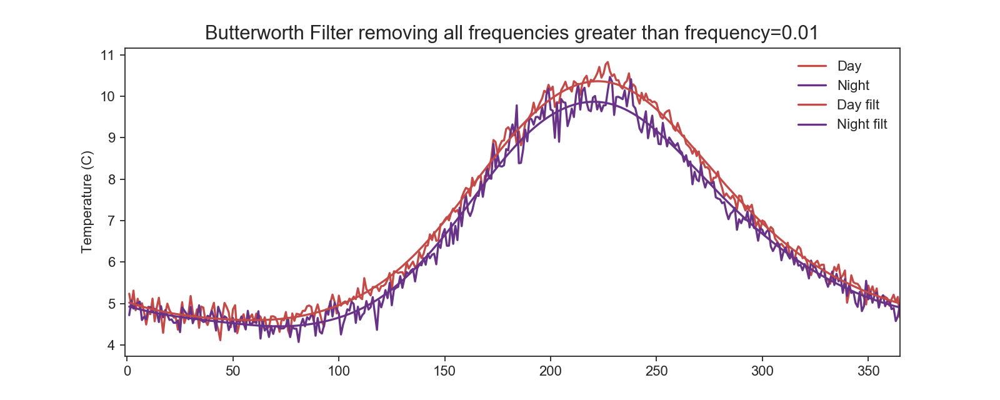

(-1, 365)

In [324]:
# IC determine daily seasonal climatology for each product
ICDc = pd.concat([MDataDT['DayICMean'],MDataDTn['NightICMean']],axis=1)
climICDc = ICDc.groupby([ICDc.index.dayofyear]).mean()

freq=0.01
data1 = np.array(climICDc['DayICMean'])
data1 = np.concatenate([data1[-50:],data1,data1[:50]])
climICDc['DayICfilt'] = butterworth(data1,freq)[50:-50]

data1 = np.array(climICDc['NightICMean'])
data1 = np.concatenate([data1[-50:],data1,data1[:50]])
climICDc['NightICfilt'] = butterworth(data1,freq)[50:-50]

# IC daily seasonal difference calculated
# seasICDc is the seasonal climatology daily, seasICc is monthly, filt is after the Butterworth filter
leap = pd.DataFrame(climICDc[-1:])
norm = pd.concat([climICDc]*4)
seasICDc = pd.concat([climICDc,leap,norm,leap,norm,leap,norm,leap,norm,leap,pd.concat([climICDc]*2)],axis=0)
seasICDc['Datetime'] = pd.date_range(start='1/1/2000', end='12/31/2018',freq='1D')
seasICDc = seasICDc.set_index('Datetime')

MDataDT['DayICseason'] = seasICDc['DayICfilt']
MDataDTn['NightICseason'] = seasICDc['NightICfilt']
MDataDT['ICseasonDif'] = MDataDT['DayICseason'] - MDataDTn['NightICseason']

## plot
gs=GridSpec(1,1)
f=plt.figure(figsize=(10,4))
fig=plt.subplot(gs[0,0])
plt.plot(climICDc['DayICMean'],'-C6',linewidth = 1.5, label = 'Day')
plt.plot(climICDc['NightICMean'],'-C4',linewidth = 1.5, label = 'Night')
plt.plot(climICDc['DayICfilt'],'-C6',linewidth = 1.5, label = 'Day filt')
plt.plot(climICDc['NightICfilt'],'-C4',linewidth = 1.5, label = 'Night filt')
plt.title('Butterworth Filter removing all frequencies greater than frequency='+str(freq),fontsize=14)
plt.legend(frameon = False,fontsize = 10)
plt.ylabel('Temperature (C)')
plt.xlim(-1,365) 

# Shelf anomaly diurnal bias calculations

frequency_cutoff: 0.01
frequency_cutoff_in_days: 100.0
frequency_cutoff: 0.01
frequency_cutoff_in_days: 100.0


<IPython.core.display.Javascript object>


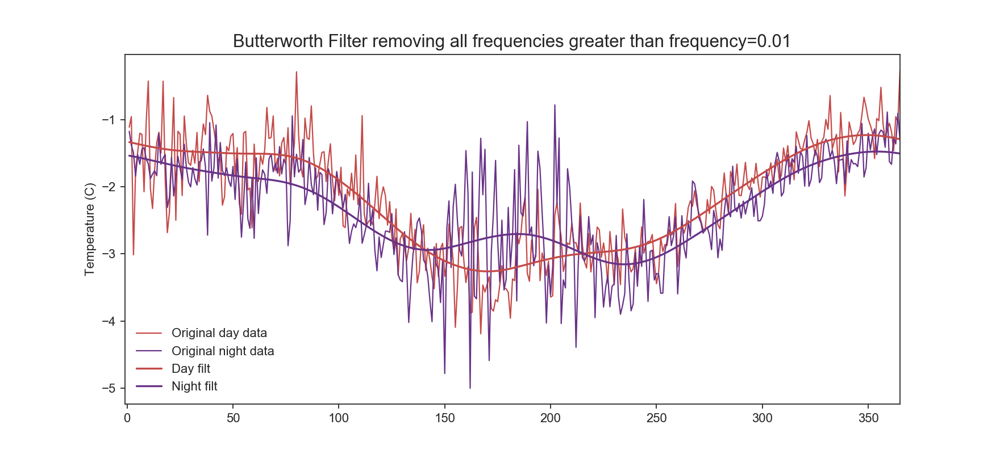

(-1, 365)

In [325]:
# Shelf anomaly determine daily seasonal climatology for each product
Dc = pd.concat([MDataDT['DayShelfMeanAnomaly'],MDataDTn['NightShelfMeanAnomaly']],axis=1)
climDc = Dc.groupby([Dc.index.dayofyear]).mean()
climDc = climDc.interpolate(method='spline', order=2, s=0.)

freq=0.01
data1 = np.array(climDc['DayShelfMeanAnomaly'])
data1 = np.concatenate([data1[-50:],data1,data1[:50]])
climDc['DayShelfAnomalyfilt'] = butterworth(data1,freq)[50:-50]

data1 = np.array(climDc['NightShelfMeanAnomaly'])
data1 = np.concatenate([data1[-50:],data1,data1[:50]])
climDc['NightShelfAnomalyfilt'] = butterworth(data1,freq)[50:-50]

# Shelf anomaly daily seasonal difference calculated
# seasDc is the seasonal climatology daily, seasc is monthly, filt is after the Butterworth filter
leap = pd.DataFrame(climDc[-1:])
norm = pd.concat([climDc]*4)
seasDc = pd.concat([climDc,leap,norm,leap,norm,leap,norm,leap,norm,leap,pd.concat([climDc]*2)],axis=0)
seasDc['Datetime'] = pd.date_range(start='1/1/2000', end='12/31/2018',freq='1D')
seasDc = seasDc.set_index('Datetime')

MDataDT['DayShelfAnomseason'] = seasDc['DayShelfAnomalyfilt']
MDataDTn['NightShelfAnomseason'] = seasDc['NightShelfAnomalyfilt']
MDataDT['ShelfAnomseasonDif'] = MDataDT['DayShelfAnomseason'] - MDataDTn['NightShelfAnomseason']

## plot
gs=GridSpec(1,1)
f=plt.figure(figsize=(11,5))
fig=plt.subplot(gs[0,0])
plt.plot(climDc['DayShelfMeanAnomaly'],'-C6',linewidth = 1.0, label = 'Original day data')
plt.plot(climDc['NightShelfMeanAnomaly'],'-C4',linewidth = 1.0, label = 'Original night data')
plt.plot(climDc['DayShelfAnomalyfilt'],'-C6',linewidth = 1.5, label = 'Day filt')
plt.plot(climDc['NightShelfAnomalyfilt'],'-C4',linewidth = 1.5, label = 'Night filt')
plt.title('Butterworth Filter removing all frequencies greater than frequency='+str(freq),fontsize=14)
plt.legend(frameon = False,fontsize = 10,loc='lower left')
plt.ylabel('Temperature (C)')
plt.xlim(-1,365) 

# Shelf diurnal bias calculation

frequency_cutoff: 0.01
frequency_cutoff_in_days: 100.0
frequency_cutoff: 0.01
frequency_cutoff_in_days: 100.0


<IPython.core.display.Javascript object>


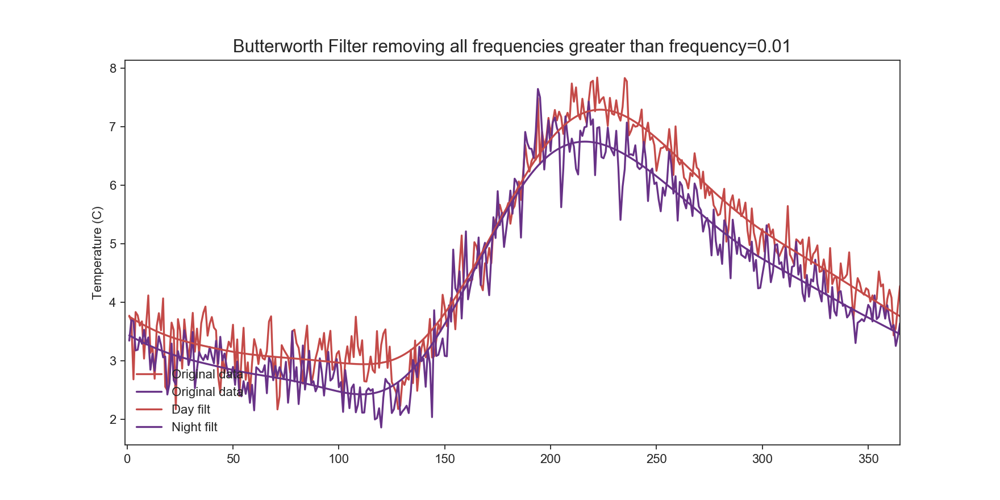

(-1, 365)

In [326]:
# Shelf determine daily seasonal climatology for each product
Dc = pd.concat([MDataDT['DayShelfMean'],MDataDTn['NightShelfMean']],axis=1)
climDc = Dc.groupby([Dc.index.dayofyear]).mean()
climDc = climDc.interpolate(method='spline', order=2, s=0.)

freq=0.01
data1 = np.array(climDc['DayShelfMean'])
data1 = np.concatenate([data1[-50:],data1,data1[:50]])
climDc['DayShelffilt'] = butterworth(data1,freq)[50:-50]

data1 = np.array(climDc['NightShelfMean'])
data1 = np.concatenate([data1[-50:],data1,data1[:50]])
climDc['NightShelffilt'] = butterworth(data1,freq)[50:-50]

# Shelf daily seasonal difference calculated
# seasDc is the seasonal climatology daily, seasc is monthly, filt is after the Butterworth filter
leap = pd.DataFrame(climDc[-1:])
norm = pd.concat([climDc]*4)
seasDc = pd.concat([climDc,leap,norm,leap,norm,leap,norm,leap,norm,leap,pd.concat([climDc]*2)],axis=0)
seasDc['Datetime'] = pd.date_range(start='1/1/2000', end='12/31/2018',freq='1D')
seasDc = seasDc.set_index('Datetime')

MDataDT['DayShelfseason'] = seasDc['DayShelffilt']
MDataDTn['NightShelfseason'] = seasDc['NightShelffilt']
MDataDT['ShelfseasonDif'] = MDataDT['DayShelfseason'] - MDataDTn['NightShelfseason']

## plot
gs=GridSpec(1,1)
f=plt.figure(figsize=(11,5.5))
fig=plt.subplot(gs[0,0])
plt.plot(climDc['DayShelfMean'],'-C6',linewidth = 1.5, label = 'Original data')
plt.plot(climDc['NightShelfMean'],'-C4',linewidth = 1.5, label = 'Original data')
plt.plot(climDc['DayShelffilt'],'-C6',linewidth = 1.5, label = 'Day filt')
plt.plot(climDc['NightShelffilt'],'-C4',linewidth = 1.5, label = 'Night filt')
plt.title('Butterworth Filter removing all frequencies greater than frequency='+str(freq),fontsize=14)
plt.legend(frameon = False,fontsize = 10,loc='lower left')
plt.ylabel('Temperature (C)')
plt.xlim(-1,365) 

# EGCC diurnal bias calculation

<IPython.core.display.Javascript object>


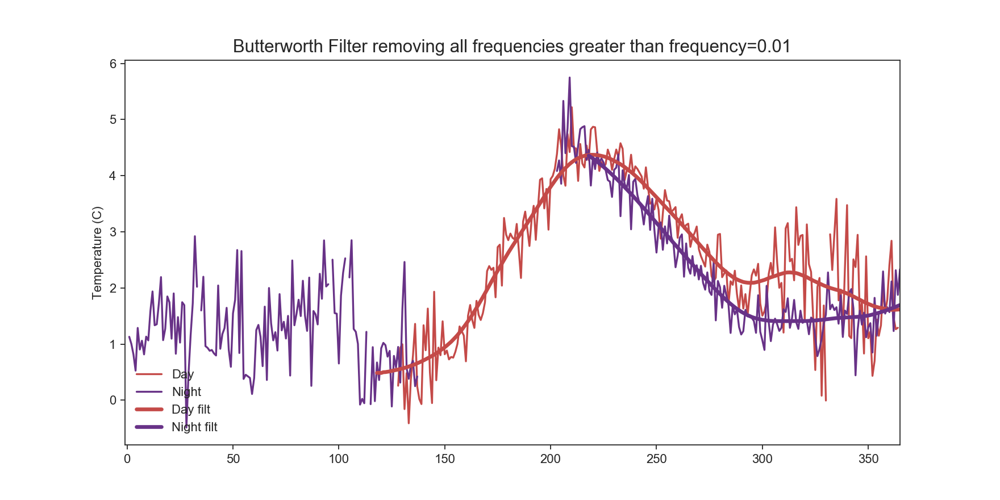

(-1, 365)

In [327]:
# EGCC determine daily seasonal climatology for each product
# No seasonal difference calculated for days 0:218, only where there is actual overlap in the later part of year
climDEgcD = MDataDT['DayEgcMean_cut'].groupby([MDataDT.index.dayofyear]).mean()
climDEgcN = MDataDTn['NightEgcMean_cut'].groupby([MDataDTn.index.dayofyear]).mean()
climDEgcD_ga = climDEgcD.rolling(50, win_type='gaussian',min_periods=15,center=True).mean(std=10)
climDEgcN_ga = climDEgcN.rolling(50, win_type='gaussian',min_periods=15,center=True).mean(std=10)
climDEgcD_dif = climDEgcD_ga - climDEgcN_ga
climDEgcD_dif[0:217] = 0.0     # no difference calculated in days 0:217

# Shelf daily seasonal difference calculated
leap = pd.DataFrame(climDEgcD_dif[-1:])
norm = pd.concat([climDEgcD_dif[:365]]*4)
seasEgcDc = pd.concat([climDEgcD_dif[:365],leap,norm,leap,norm,leap,norm,leap,norm,leap,pd.concat([climDEgcD_dif[:365]]*2)],axis=0)
seasEgcDc['Datetime'] = pd.date_range(start='1/1/2000', end='12/31/2018',freq='1D')
seasEgcDc = seasEgcDc.set_index('Datetime')
MDataDT['EgcseasonDif'] = seasEgcDc

gs=GridSpec(1,1)
f=plt.figure(figsize=(11,5.5))
fig=plt.subplot(gs[0,0])
plt.plot(climDEgcD,'-C6',linewidth = 1.5, label = 'Day')
plt.plot(climDEgcN,'-C4',linewidth = 1.5, label = 'Night')
plt.plot(climDEgcD_ga,'-C6',linewidth = 3, label = 'Day filt')
plt.plot(climDEgcN_ga[217:],'-C4',linewidth = 3, label = 'Night filt')
plt.title('Butterworth Filter removing all frequencies greater than frequency='+str(freq),fontsize=14)
plt.legend(frameon = False,fontsize = 10,loc='lower left')
plt.ylabel('Temperature (C)')
plt.xlim(-1,365) 

# Build one dataset, calculate bias, and create weekly/monthly means

In [376]:
### Concatenate all datasets
MDataD = pd.concat([MDataDA,MDataDT,MDataDAn,MDataDTn],axis=1) #
MDataD = MDataD.sort_index()
MDataD.index = pd.to_datetime(MDataD.index)

allD = pd.concat([MDataD,all_shelfmoorD,era5WindD,disch],axis=1)
del allD['Month']
allD['Month'] = allD.index.month

# Subtract seasonal differences from the DAY products and average all products together
allD['AICMeanShifted'] = allD['AICMean']-allD['ICseasonDif']
allD['TICMeanShifted'] = allD['TICMean']-allD['ICseasonDif']
allD['allICMean'] = allD[['AICMeanShifted','TICMeanShifted','AnICMean','TnICMean']].mean(axis=1,skipna=True)
allD['allICMean_std'] = allD[['AICMeanShifted','TICMeanShifted','AnICMean','TnICMean']].std(axis=1,skipna=True)
allD['allICMean_err'] = allD[['AICMeanShifted','TICMeanShifted','AnICMean','TnICMean']].sem(axis=1,skipna=True)
allD['AShelfMeanShifted'] = allD['AMean']-allD['ShelfseasonDif']
allD['TShelfMeanShifted'] = allD['TMean']-allD['ShelfseasonDif']
allD['allShelfMean'] = allD[['AShelfMeanShifted','TShelfMeanShifted','AnMean','TnMean']].mean(axis=1,skipna=True)
allD['allShelfMean_std'] = allD[['AShelfMeanShifted','TShelfMeanShifted','AnMean','TnMean']].std(axis=1,skipna=True)
allD['allShelfMean_err'] = allD[['AShelfMeanShifted','TShelfMeanShifted','AnMean','TnMean']].sem(axis=1,skipna=True)
allD['AShelfAnomShifted'] = allD['AShelfMeanShifted']-allD['AICMeanShifted']
allD['AnShelfAnom'] = allD['AnMean']-allD['AnICMean']
allD['TShelfAnomShifted'] = allD['TShelfMeanShifted']-allD['TICMeanShifted']
allD['TnShelfAnom'] = allD['TnMean']-allD['TnICMean']
allD['allShelfAnom'] = allD[['AShelfAnomShifted','TShelfAnomShifted','AnShelfAnom','TnShelfAnom']].mean(axis=1,skipna=True)
allD['allShelfAnom_std'] = allD[['AShelfAnomShifted','TShelfAnomShifted','AnShelfAnom','TnShelfAnom']].std(axis=1,skipna=True)
allD['allShelfAnomn_err'] = allD[['AShelfAnomShifted','TShelfAnomShifted','AnShelfAnom','TnShelfAnom']].sem(axis=1,skipna=True)
allD['AEgcMean_cutShifted'] = allD['AEgcMean_cut']-allD['EgcseasonDif']
allD['TEgcMean_cutShifted'] = allD['TEgcMean_cut']-allD['EgcseasonDif']
allD['allEgcMean'] = allD[['AEgcMean_cutShifted','TEgcMean_cutShifted','AnEgcMean_cut','TnEgcMean_cut']].mean(axis=1,skipna=True)
allD['allEgcMean_std'] = allD[['AEgcMean_cutShifted','TEgcMean_cutShifted','AnEgcMean_cut','TnEgcMean_cut']].std(axis=1,skipna=True)
allD['allEgcMean_err'] = allD[['AEgcMean_cutShifted','TEgcMean_cutShifted','AnEgcMean_cut','TnEgcMean_cut']].sem(axis=1,skipna=True)

### Weekly means
allW = allD.resample('W').mean()
del allW['Month'],allW['ERA5WindDeg'],allW['ERA5WindDegSW']
allW['Month'] = allW.index.month

# Recalculate wind directions
allW['ERA5WindDeg'] = (270 - np.degrees(np.arctan2(allW['ERA5WindV'],allW['ERA5WindU'])) + 360) % 360
allW['ERA5WindDegSW'] = ((130 + allW['ERA5WindDeg']) + 360) % 360

### Monthly means
allM = allD.resample('MS').mean()
del allM['Month'],allM['ERA5WindDeg'],allM['ERA5WindDegSW']
allM['Month'] = allM.index.month

# Recalculate wind directions
allM['ERA5WindDeg'] = (270 - np.degrees(np.arctan2(allM['ERA5WindV'],allM['ERA5WindU'])) + 360) % 360
allM['ERA5WindDegSW'] = ((130 + allM['ERA5WindDeg']) + 360) % 360

# In allM remove months that aren't complete except May since this if complete enough (otherwise wouldn't have a May in either night or day)
allM['AEgcMean_cut'] = allM['AEgcMean_cut'].loc[allM.index.month.isin([5,6,7,8,9,10,11,12])]
allM['AnEgcMean_cut'] = allM['AnEgcMean_cut'].loc[allM.index.month.isin([1,2,3,4,5,8,9,10,11,12])]
allM['TEgcMean_cut'] = allM['TEgcMean_cut'].loc[allM.index.month.isin([5,6,7,8,9,10,11,12])]
allM['TnEgcMean_cut'] = allM['TnEgcMean_cut'].loc[allM.index.month.isin([1,2,3,4,5,8,9,10,11,12])]

allM['DayEgcMean_cut'] = allM['DayEgcMean_cut'].loc[allM.index.month.isin([5,6,7,8,9,10,11,12])]
allM['NightEgcMean_cut'] = allM['NightEgcMean_cut'].loc[allM.index.month.isin([1,2,3,4,5,8,9,10,11,12])]

### Annual mean
allA = allD.resample('YS').mean()
del allA['Month'],allA['ERA5WindDeg'],allA['ERA5WindDegSW']
                                                  
allA['ERA5WindDeg'] = (270 - np.degrees(np.arctan2(allA['ERA5WindV'],allA['ERA5WindU'])) + 360) % 360
allA['ERA5WindDegSW'] = ((130 + allA['ERA5WindDeg']) + 360) % 360
    
allD.tail(2)

,AMean_10pix,AMeanAnomaly_10pix,AErr_10pix,AMax,AMaxAnomaly,AMean,AMeanAnomaly,AErr,AStdev,AICMean,...,TShelfAnomShifted,TnShelfAnom,allShelfAnom,allShelfAnom_std,allShelfAnomn_err,AEgcMean_cutShifted,TEgcMean_cutShifted,allEgcMean,allEgcMean_std,allEgcMean_err
2018-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.251435,-0.80169,-0.456986,0.613584,0.354253,NaN,NaN,3.8925,NaN,NaN
2018-12-31,5.292,0.082833,0.020753,5.335,0.125834,4.85817,-0.350996,0.052181,0.330022,5.209167,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [377]:
allD['A-TMean'] = allD['AMean']-allD['TMean']
allD['An-TnMean'] = allD['AnMean']-allD['TnMean']
allD['A-AnMean'] = allD['AMean']-allD['AnMean']
allD['T-TnMean'] = allD['TMean']-allD['TnMean']
allD['A-TMeanShifted'] = allD['AShelfMeanShifted']-allD['TShelfMeanShifted']
allD['A-AnMeanShifted'] = allD['AShelfMeanShifted']-allD['AnMean']
allD['T-TnMeanShifted'] = allD['TShelfMeanShifted']-allD['TnMean']
allD['A-TMeanAnomaly'] = allD['AMeanAnomaly']-allD['TMeanAnomaly']
allD['An-TnMeanAnomaly'] = allD['AnMeanAnomaly']-allD['TnMeanAnomaly']
allD['A-AnMeanAnomaly'] = allD['AMeanAnomaly']-allD['AnMeanAnomaly']
allD['T-TnMeanAnomaly'] = allD['TMeanAnomaly']-allD['TnMeanAnomaly']

In [378]:
print 'Daily'
print 'AD-TD =', np.round(allD['A-TMean'].mean(),2),'+/-', np.round(allD['A-TMean'].sem(),2)
print 'AN-TN =', np.round(allD['An-TnMean'].mean(),4),'+/-', np.round(allD['An-TnMean'].sem(),2)
print 'AD-AN =', np.round(allD['A-AnMean'].mean(),2),'+/-', np.round(allD['A-AnMean'].sem(),2)
print 'TD-TN =', np.round(allD['T-TnMean'].mean(),2),'+/-', np.round(allD['T-TnMean'].sem(),2)
print 'AD-TD bias corrected =', np.round(allD['A-TMeanShifted'].mean(),2),'+/-', np.round(allD['A-TMeanShifted'].sem(),2)
print 'AD-AN bias corrected =', np.round(allD['A-AnMeanShifted'].mean(),2),'+/-', np.round(allD['A-AnMeanShifted'].sem(),2)
print 'TD-TN bias corrected =', np.round(allD['T-TnMeanShifted'].mean(),2),'+/-', np.round(allD['T-TnMeanShifted'].sem(),2)
# print 'A-T Anom =', np.round(allD['A-TMeanAnomaly'].mean(),2),'+/-', np.round(allD['A-TMeanAnomaly'].sem(),2)
# print 'An-Tn Anom =', np.round(allD['An-TnMeanAnomaly'].mean(),2),'+/-', np.round(allD['An-TnMeanAnomaly'].sem(),2)
# print 'A-An Anom =', np.round(allD['A-AnMeanAnomaly'].mean(),2),'+/-', np.round(allD['A-AnMeanAnomaly'].sem(),2)
# print 'T-Tn Anom =', np.round(allD['T-TnMeanAnomaly'].mean(),2),'+/-', np.round(allD['T-TnMeanAnomaly'].sem(),2)

Daily
AD-TD = -0.17 +/- 0.03
AN-TN = -0.0025 +/- 0.02
AD-AN = 0.3 +/- 0.03
TD-TN = 0.37 +/- 0.03
AD-TD bias corrected = -0.17 +/- 0.03
AD-AN bias corrected = -0.14 +/- 0.03
TD-TN bias corrected = -0.07 +/- 0.03


# Figure 2

In [379]:
# For cumulative mean of all IC, Shelf, and EGCC/EGCC cut data
climDI = allM['DayICMean'].groupby([allM.index.month]).mean()
climDIstd = allM['DayICMean'].groupby([allM.index.month]).std()
climDIerr = allM['DayICMean'].groupby([allM.index.month]).sem()
clwDI = climDI-climDIerr
cupDI = climDI+climDIerr

climNI = allM['NightICMean'].groupby([allM.index.month]).mean()
climNIstd = allM['NightICMean'].groupby([allM.index.month]).std()
climNIerr = allM['NightICMean'].groupby([allM.index.month]).sem()
clwNI = climNI-climNIerr
cupNI = climNI+climNIerr

climallIC = allM['allICMean'].groupby([allM.index.month]).mean()
climallICstd = allM['allICMean'].groupby([allM.index.month]).std()
climallICerr = allM['allICMean'].groupby([allM.index.month]).sem()
clwallIC = climallIC-climallICerr
cupallIC = climallIC+climallICerr

climDS = allM['DayShelfMean'].groupby([allM.index.month]).mean()
climDSstd = allM['DayShelfMean'].groupby([allM.index.month]).std()
climDSerr = allM['DayShelfMean'].groupby([allM.index.month]).sem()
clwDS = climDS-climDSerr
cupDS = climDS+climDSerr

climNS = allM['NightShelfMean'].groupby([allM.index.month]).mean()
climNSstd = allM['NightShelfMean'].groupby([allM.index.month]).std()
climNSerr = allM['NightShelfMean'].groupby([allM.index.month]).sem()
clwNS = climNS-climNSerr
cupNS = climNS+climNSerr

climallSh = allM['allShelfMean'].groupby([allM.index.month]).mean()
climallShstd = allM['allShelfMean'].groupby([allM.index.month]).std()
climallSherr = allM['allShelfMean'].groupby([allM.index.month]).sem()
clwallSh = climallSh-climallSherr
cupallSh = climallSh+climallSherr

climDE = allM['DayEgcMean'].groupby([allM.index.month]).mean()
climDEstd = allM['DayEgcMean'].groupby([allM.index.month]).std()
climDEerr = allM['DayEgcMean'].groupby([allM.index.month]).sem()
clwDE = climDE-climDEerr
cupDE = climDE+climDEerr

climNE = allM['NightEgcMean'].groupby([allM.index.month]).mean()
climNEstd = allM['NightEgcMean'].groupby([allM.index.month]).std()
climNEerr = allM['NightEgcMean'].groupby([allM.index.month]).sem()
clwNE = climNE-climNEerr
cupNE = climNE+climNEerr

climDEc = allM['DayEgcMean_cut'].groupby([allM.index.month]).mean()
climDEstdc = allM['DayEgcMean_cut'].groupby([allM.index.month]).std()
climDEerrc = allM['DayEgcMean_cut'].groupby([allM.index.month]).sem()
clwDEc = climDEc-climDEerrc
cupDEc = climDEc+climDEerrc

climNEc = allM['NightEgcMean_cut'].groupby([allM.index.month]).mean()
climNEstdc = allM['NightEgcMean_cut'].groupby([allM.index.month]).std()
climNEerrc = allM['NightEgcMean_cut'].groupby([allM.index.month]).sem()
clwNEc = climNEc-climNEerrc
cupNEc = climNEc+climNEerrc

climallE = allM['allEgcMean'].groupby([allM.index.month]).mean()
climallEstd = allM['allEgcMean'].groupby([allM.index.month]).std()
climallEerr = allM['allEgcMean'].groupby([allM.index.month]).sem()
clwallE = climallE-climallEerr
cupallE = climallE+climallEerr

<IPython.core.display.Javascript object>


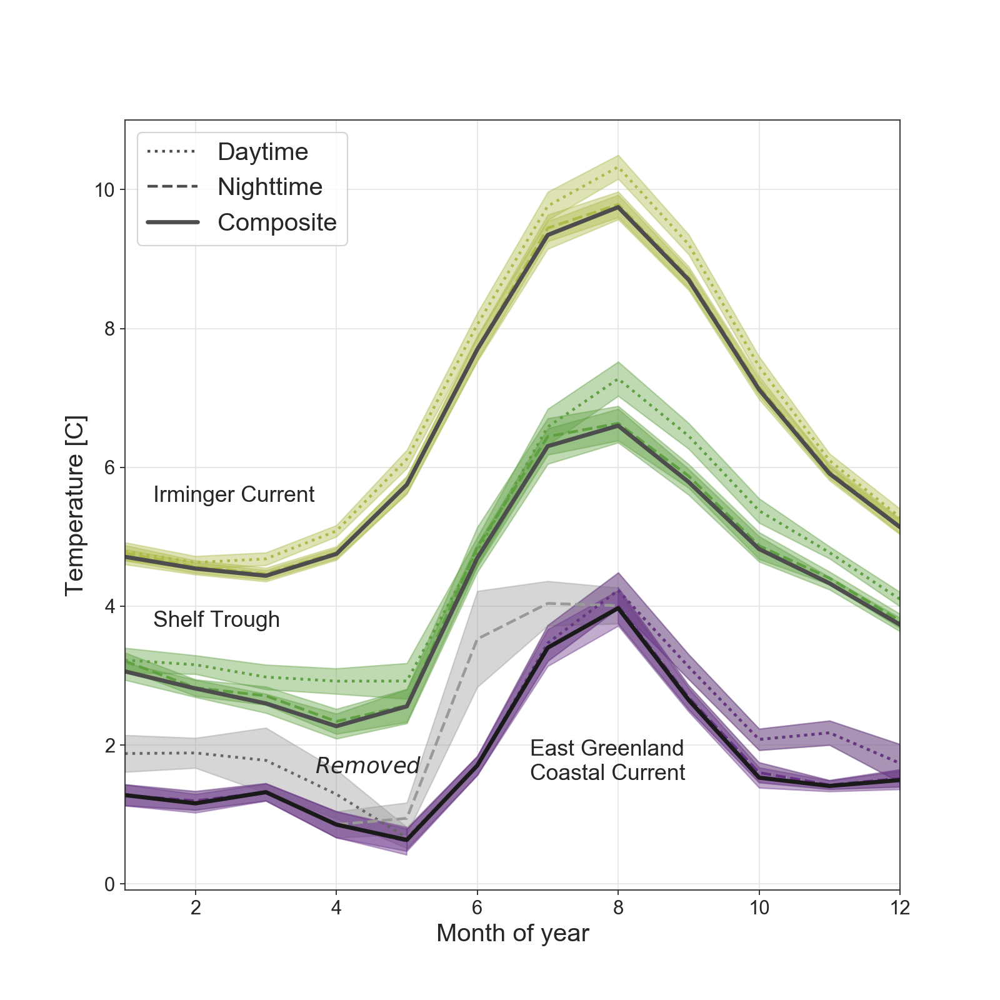

(1, 12)

In [380]:
fig, ax = plt.subplots(figsize=(10, 10))

plt.grid(color='.9')
plt.tick_params(labelsize=14)

handles = []
h, = plt.plot(climDI,color='C1',linestyle=':',linewidth=2,label='Daytime')
handles.append(copy.copy(h))
plt.fill_between(climDI.index, cupDI, clwDI,color='C1', alpha=.4,label='_no legend_')
h, = plt.plot(climNI,color='C1',linestyle='--',linewidth=2,label='Nighttime')
handles.append(copy.copy(h))
plt.fill_between(climNI.index, cupNI, clwNI,color='C1', alpha=.4,label='_no legend_')
h, = plt.plot(climallIC,color='0.3',linewidth=3,label='Composite')
handles.append(copy.copy(h))
plt.fill_between(climallIC.index, cupallIC, clwallIC,color='C1', alpha=.4,label='_no legend_')
plt.text(1.4,5.5,'Irminger Current',fontsize=16)

plt.plot(climDS,color='C3',linestyle=':',linewidth=2,label='_no legend_')
plt.fill_between(climDS.index, cupDS, clwDS,color='C3', alpha=.4,label='_no legend_')
plt.plot(climNS,color='C3',linestyle='--',linewidth=2,label='Shelf')
plt.fill_between(climNS.index, cupNS, clwNS,color='C3', alpha=.4,label='_no legend_')
plt.plot(climallSh,color='0.3',linewidth=3,label='_no legend_')
plt.fill_between(climallSh.index, cupallSh, clwallSh,color='C3', alpha=.4,label='_no legend_')
plt.text(1.4,3.7,'Shelf Trough',fontsize=16)

plt.plot(climDE,color='0.4',linestyle=':',linewidth=2,label='_no legend_')
plt.fill_between(climDE.index, cupDE, clwDE,color='0.6', alpha=.4,label='_no legend_')
plt.plot(climNE,linestyle='--',color='0.6',linewidth=2,label='EGCC')
plt.fill_between(climNE.index, cupNE, clwNE,color='0.6', alpha=.4,label='Removed data')
plt.plot(climDEc,color='C4',linestyle=':',linewidth=2,label='_no legend_')
plt.fill_between(climDEc.index, cupDEc, clwDEc,color='C4', alpha=.4,label='_no legend_')
plt.plot(climNEc,linestyle='--',color='C4',linewidth=2,label='EGCC QC')
plt.fill_between(climNEc.index, cupNEc, clwNEc,color='C4', alpha=.4,label='_no legend_')
plt.plot(climallE,color='0.1',linewidth=3,label='_no legend_')
plt.fill_between(climallE.index, cupallE, clwallE,color='C4', alpha=.4,label='_no legend_')
plt.text(6.75,1.5,'East Greenland\nCoastal Current',fontsize=16)
plt.text(3.7,1.6,'$\it{Removed}$',fontsize=16)

for h in handles:
    h.set_color('0.3')

leg = plt.legend(handles=handles,markerscale=4,fontsize=18)
plt.ylabel('Temperature [C]',fontsize=18)
plt.xlabel('Month of year',fontsize=18)
plt.xlim(1,12)

# plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Conferences/AGU_2019/Figures/SeasonalCurve.jpg', format='jpg', dpi=1000)

In [382]:
print ('\033[4mAvg diurnal bias:\033[0m')
print ('IC = '+str(round(MDataDT['ICseasonDif'].groupby(MDataDT.index.month).mean().mean(),2))+'+/-'+str(round(MDataDT['ICseasonDif'].groupby(MDataDT.index.month).mean().std(),2)))
print ('Shelf = '+str(round(MDataDT['ShelfseasonDif'].groupby(MDataDT.index.month).mean().mean(),2))+'+/-'+str(round(MDataDT['ShelfseasonDif'].groupby(MDataDT.index.month).mean().std(),2)))
print ('EGCC = '+str(round(climDEgcD_dif[218:].mean(),2))+'+/-'+str(round(climDEgcD_dif[218:].std(),2)))
print ('')
print ('\033[4mAvg of climatology:\033[0m')
print ('IC = '+str(allD['allICMean'].mean()))
print ('Shelf = '+str(allD['allShelfMean'].mean()))
print ('EGCC = '+str(allD['allEgcMean'].mean()))
print ('')
print ('\033[4mRange:\033[0m')
print ('IC = '+str(climallIC.max()-climallIC.min()))
print ('Shelf = '+str(climallSh.max()-climallSh.min()))
print ('EGCC = '+str(climallE.max()-climallE.min()))

Avg diurnal bias:
IC = 0.28+/-0.15
Shelf = 0.39+/-0.16
EGCC = 0.46+/-0.23

Avg of climatology:
IC = 6.545917148719903
Shelf = 4.293926696762435
EGCC = 2.268524062731376

Range:
IC = 5.308860723020778
Shelf = 4.327360843826794
EGCC = 3.3386269852015644


# ---Adjustment using airT--- 

In [383]:
allW = allD.resample('W').mean()
del allW['Month']
allW['Month'] = allW.index.month

allD_wint = allD.loc[allD.index.month.isin([1,2,3,12])]
allD_sum = allD.loc[allD.index.month.isin([6,7,8,9])]
allD_notwint = allD.loc[allD.index.month.isin([4,5,6,7,8,9,10,11])]

allW_wint = allW.loc[allW.index.month.isin([1,2,3,12])]
allW_sum = allW.loc[allW.index.month.isin([6,7,8,9])]
allW_notwint = allW.loc[allW.index.month.isin([4,5,6,7,8,9,10,11])]

allM_wint = allM.loc[allM.index.month.isin([1,2,3,12])]
allM_sum = allM.loc[allM.index.month.isin([6,7,8,9])]
allM_notwint = allM.loc[allM.index.month.isin([4,5,6,7,8,9,10,11])]

# Adjusting IC

In [384]:
resultICD = sm.ols(formula="allICMean ~ ERA5AirTempI:C(Month)", data=allD).fit()
parametersICD = np.where(resultICD.pvalues>0.05,0,resultICD.params)
print resultICD.summary()

                            OLS Regression Results                            
Dep. Variable:              allICMean   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.843
Method:                 Least Squares   F-statistic:                     2580.
Date:                Tue, 27 Oct 2020   Prob (F-statistic):               0.00
Time:                        10:01:47   Log-Likelihood:                -7042.3
No. Observations:                5747   AIC:                         1.411e+04
Df Residuals:                    5734   BIC:                         1.420e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [385]:
resultIC = sm.ols(formula="allICMean ~ ERA5AirTempI:C(Month)", data=allW).fit()
parametersIC = np.where(resultIC.pvalues>0.05,0,resultIC.params)
print resultIC.summary()

                            OLS Regression Results                            
Dep. Variable:              allICMean   R-squared:                       0.909
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     803.9
Date:                Tue, 27 Oct 2020   Prob (F-statistic):               0.00
Time:                        10:01:48   Log-Likelihood:                -900.62
No. Observations:                 980   AIC:                             1827.
Df Residuals:                     967   BIC:                             1891.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [386]:
resultICM = sm.ols(formula="allICMean ~ ERA5AirTempI:C(Month)", data=allM).fit()
parametersICM = np.where(resultICM.pvalues>0.05,0,resultICM.params)
print resultICM.summary()

                            OLS Regression Results                            
Dep. Variable:              allICMean   R-squared:                       0.953
Model:                            OLS   Adj. R-squared:                  0.950
Method:                 Least Squares   F-statistic:                     361.9
Date:                Tue, 27 Oct 2020   Prob (F-statistic):          7.90e-135
Time:                        10:01:48   Log-Likelihood:                -128.06
No. Observations:                 227   AIC:                             282.1
Df Residuals:                     214   BIC:                             326.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [387]:
paramspDI = np.where(resultICD.pvalues[1:13]>0.05,np.nan,resultICD.params[1:13])
paramsDI = np.where(resultICD.pvalues[1:13]<=0.05,np.nan,resultICD.params[1:13])
errpDI = np.where(resultICD.pvalues[1:13]>0.05,np.nan,resultICD.bse[1:13])
errDI = np.where(resultICD.pvalues[1:13]<=0.05,np.nan,resultICD.bse[1:13])

paramspI = np.where(resultIC.pvalues[1:13]>0.05,np.nan,resultIC.params[1:13])
paramsI = np.where(resultIC.pvalues[1:13]<=0.05,np.nan,resultIC.params[1:13])
errpI = np.where(resultIC.pvalues[1:13]>0.05,np.nan,resultIC.bse[1:13])
errI = np.where(resultIC.pvalues[1:13]<=0.05,np.nan,resultIC.bse[1:13])

paramspMI = np.where(resultICM.pvalues[1:13]>0.05,np.nan,resultICM.params[1:13])
paramsMI = np.where(resultICM.pvalues[1:13]<=0.05,np.nan,resultICM.params[1:13])
errpMI = np.where(resultICM.pvalues[1:13]>0.05,np.nan,resultICM.bse[1:13])
errMI = np.where(resultICM.pvalues[1:13]<=0.05,np.nan,resultICM.bse[1:13])

In [388]:
def detrend_sstI(row):
    parametersIC = parametersICD
    if row['Month']==1:
        a1 = parametersIC[1]
    elif row['Month']==2:
        a1 = parametersIC[2]
    elif row['Month']==3:
        a1 = parametersIC[3]
    elif row['Month']==4:
        a1 = parametersIC[4]
    elif row['Month']==5:
        a1 = parametersIC[5]
    elif row['Month']==6:
        a1 = parametersIC[6]
    elif row['Month']==7:
        a1 = parametersIC[7]
    elif row['Month']==8:
        a1 = parametersIC[8]
    elif row['Month']==9:
        a1 = parametersIC[9]
    elif row['Month']==10:
        a1 = parametersIC[10]
    elif row['Month']==11:
        a1 = parametersIC[11]
    elif row['Month']==12:
        a1 = parametersIC[12]
    return row['allICMean'] - a1 * row['ERA5AirTempI']

In [389]:
allD['allICMean_fulldetrend'] = allD.apply(detrend_sstI, axis=1)
allW['allICMean_fulldetrend'] = allD['allICMean_fulldetrend'].resample('W').mean()
allM['allICMean_fulldetrend'] = allD['allICMean_fulldetrend'].resample('MS').mean()

<IPython.core.display.Javascript object>


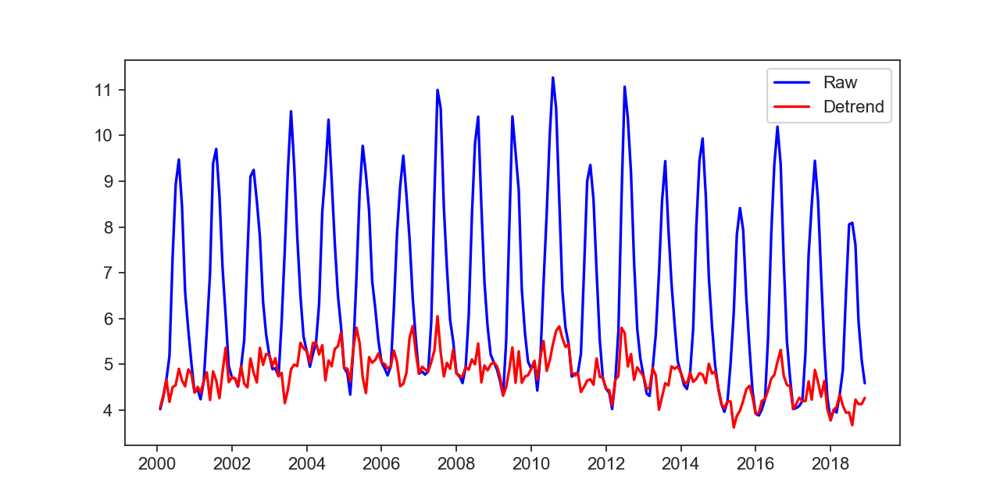

In [390]:
fig, ax = plt.subplots()
ax.plot(allM['allICMean'], color = 'b', label="Raw")
ax.plot(allM['allICMean_fulldetrend'], color = 'r', label="Detrend")
ax.legend(loc="best")

# Adjusted EGCC

In [394]:
resultED = sm.ols(formula="allEgcMean ~ ERA5AirTempE:C(Month)", data=allD).fit()
parametersED = np.where(resultED.pvalues>0.05,0,resultED.params)
print resultED.summary()

                            OLS Regression Results                            
Dep. Variable:             allEgcMean   R-squared:                       0.524
Model:                            OLS   Adj. R-squared:                  0.522
Method:                 Least Squares   F-statistic:                     270.5
Date:                Tue, 27 Oct 2020   Prob (F-statistic):               0.00
Time:                        10:01:54   Log-Likelihood:                -4542.6
No. Observations:                2960   AIC:                             9111.
Df Residuals:                    2947   BIC:                             9189.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [395]:
resultE = sm.ols(formula="allEgcMean ~ ERA5AirTempE:C(Month)", data=allW).fit()
parametersE = np.where(resultE.pvalues>0.05,0,resultE.params)
print resultE.summary()

                            OLS Regression Results                            
Dep. Variable:             allEgcMean   R-squared:                       0.600
Model:                            OLS   Adj. R-squared:                  0.593
Method:                 Least Squares   F-statistic:                     95.27
Date:                Tue, 27 Oct 2020   Prob (F-statistic):          1.07e-142
Time:                        10:01:54   Log-Likelihood:                -1015.6
No. Observations:                 776   AIC:                             2057.
Df Residuals:                     763   BIC:                             2118.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [396]:
resultEM = sm.ols(formula="allEgcMean ~ ERA5AirTempE:C(Month)", data=allM).fit()
parametersEM = np.where(resultEM.pvalues>0.05,0,resultEM.params)
print resultEM.summary()

                            OLS Regression Results                            
Dep. Variable:             allEgcMean   R-squared:                       0.715
Model:                            OLS   Adj. R-squared:                  0.698
Method:                 Least Squares   F-statistic:                     42.23
Date:                Tue, 27 Oct 2020   Prob (F-statistic):           1.69e-48
Time:                        10:01:55   Log-Likelihood:                -212.81
No. Observations:                 215   AIC:                             451.6
Df Residuals:                     202   BIC:                             495.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [397]:
paramspDE = np.where(resultED.pvalues[1:13]>0.05,np.nan,resultED.params[1:13])
paramsDE = np.where(resultED.pvalues[1:13]<=0.05,np.nan,resultED.params[1:13])
errpDE = np.where(resultED.pvalues[1:13]>0.05,np.nan,resultED.bse[1:13])
errDE = np.where(resultED.pvalues[1:13]<=0.05,np.nan,resultED.bse[1:13])

paramspE = np.where(resultE.pvalues[1:13]>0.05,np.nan,resultE.params[1:13])
paramsE = np.where(resultE.pvalues[1:13]<=0.05,np.nan,resultE.params[1:13])
errpE = np.where(resultE.pvalues[1:13]>0.05,np.nan,resultE.bse[1:13])
errE = np.where(resultE.pvalues[1:13]<=0.05,np.nan,resultE.bse[1:13])

paramspME = np.where(resultEM.pvalues[1:13]>0.05,np.nan,resultEM.params[1:13])
paramsME = np.where(resultEM.pvalues[1:13]<=0.05,np.nan,resultEM.params[1:13])
errpME = np.where(resultEM.pvalues[1:13]>0.05,np.nan,resultEM.bse[1:13])
errME = np.where(resultEM.pvalues[1:13]<=0.05,np.nan,resultEM.bse[1:13])

In [398]:
def detrend_sstE(row):
    parametersE = parametersED
    if row['Month']==1:
        a1 = parametersE[1]
    elif row['Month']==2:
        a1 = parametersE[2]
    elif row['Month']==3:
        a1 = parametersE[3]
    elif row['Month']==4:
        a1 = parametersE[4]
    elif row['Month']==5:
        a1 = parametersE[5]
    elif row['Month']==6:
        a1 = parametersE[6]
    elif row['Month']==7:
        a1 = parametersE[7]
    elif row['Month']==8:
        a1 = parametersE[8]
    elif row['Month']==9:
        a1 = parametersE[9]
    elif row['Month']==10:
        a1 = parametersE[10]
    elif row['Month']==11:
        a1 = parametersE[11]
    elif row['Month']==12:
        a1 = parametersE[12]
    return row['allEgcMean'] - a1 * row['ERA5AirTempE']

In [399]:
allD['allEgcMean_fulldetrend'] = allD.apply(detrend_sstE, axis=1)
allW['allEgcMean_fulldetrend'] = allD['allEgcMean_fulldetrend'].resample('W').mean()
allM['allEgcMean_fulldetrend'] = allD['allEgcMean_fulldetrend'].resample('MS').mean()

<IPython.core.display.Javascript object>


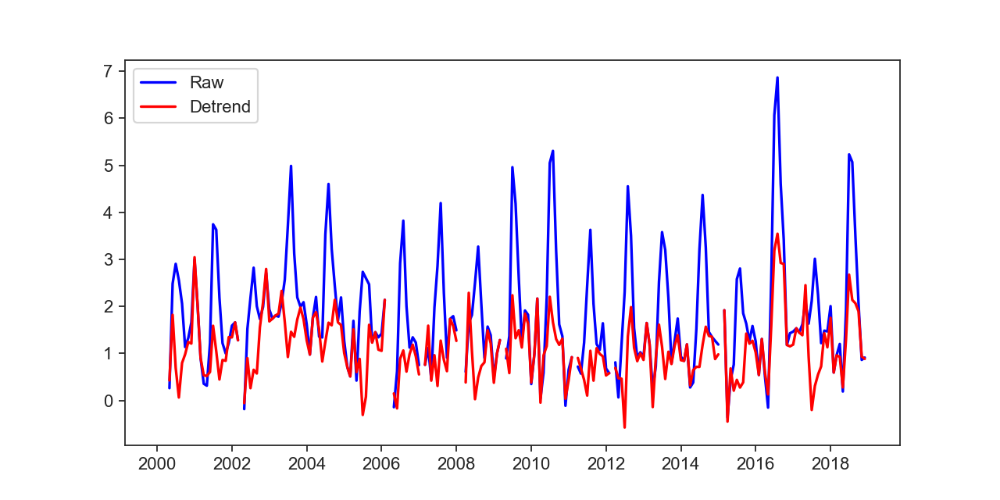

In [400]:
fig, ax = plt.subplots()
ax.plot(allM['allEgcMean'], color = 'b', label="Raw")
ax.plot(allM['allEgcMean_fulldetrend'], color = 'r', label="Detrend")
ax.legend(loc="best")

# Adjusted shelf

In [404]:
resultSD = sm.ols(formula="allShelfMean ~ ERA5AirTempS:C(Month)", data=allD).fit() 
parametersSD = np.where(resultSD.pvalues>0.05,0,resultSD.params)
print resultSD.summary()

                            OLS Regression Results                            
Dep. Variable:           allShelfMean   R-squared:                       0.619
Model:                            OLS   Adj. R-squared:                  0.618
Method:                 Least Squares   F-statistic:                     618.2
Date:                Tue, 27 Oct 2020   Prob (F-statistic):               0.00
Time:                        10:02:00   Log-Likelihood:                -7214.6
No. Observations:                4587   AIC:                         1.446e+04
Df Residuals:                    4574   BIC:                         1.454e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [405]:
resultS = sm.ols(formula="allShelfMean ~ ERA5AirTempS:C(Month)", data=allW).fit() 
parametersS = np.where(resultS.pvalues>0.05,0,resultS.params)
print resultS.summary()

                            OLS Regression Results                            
Dep. Variable:           allShelfMean   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.705
Method:                 Least Squares   F-statistic:                     192.9
Date:                Tue, 27 Oct 2020   Prob (F-statistic):          4.44e-245
Time:                        10:02:00   Log-Likelihood:                -1326.4
No. Observations:                 965   AIC:                             2679.
Df Residuals:                     952   BIC:                             2742.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [406]:
resultSM = sm.ols(formula="allShelfMean ~ ERA5AirTempS:C(Month)", data=allM).fit() 
parametersSM = np.where(resultSM.pvalues>0.05,0,resultSM.params)
print resultSM.summary()

                            OLS Regression Results                            
Dep. Variable:           allShelfMean   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.822
Method:                 Least Squares   F-statistic:                     88.06
Date:                Tue, 27 Oct 2020   Prob (F-statistic):           8.91e-76
Time:                        10:02:01   Log-Likelihood:                -234.04
No. Observations:                 227   AIC:                             494.1
Df Residuals:                     214   BIC:                             538.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [407]:
# # # Write files for ease of use later
# paramFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/ShelfParamswo'
# pickle.dump(parametersAwo,open(paramFile,'w')) 
# paramFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/ShelfParams'
# pickle.dump(parametersA,open(paramFile,'w')) 

In [408]:
paramspDS = np.where(resultSD.pvalues[1:13]>0.05,np.nan,resultSD.params[1:13])
paramsDS = np.where(resultSD.pvalues[1:13]<=0.05,np.nan,resultSD.params[1:13])
errpDS = np.where(resultSD.pvalues[1:13]>0.05,np.nan,resultSD.bse[1:13])
errDS = np.where(resultSD.pvalues[1:13]<=0.05,np.nan,resultSD.bse[1:13])

paramspS = np.where(resultS.pvalues[1:13]>0.05,np.nan,resultS.params[1:13])
paramsS = np.where(resultS.pvalues[1:13]<=0.05,np.nan,resultS.params[1:13])
errpS = np.where(resultS.pvalues[1:13]>0.05,np.nan,resultS.bse[1:13])
errS = np.where(resultS.pvalues[1:13]<=0.05,np.nan,resultS.bse[1:13])

paramspMS = np.where(resultSM.pvalues[1:13]>0.05,np.nan,resultSM.params[1:13])
paramsMS = np.where(resultSM.pvalues[1:13]<=0.05,np.nan,resultSM.params[1:13])
errpMS = np.where(resultSM.pvalues[1:13]>0.05,np.nan,resultSM.bse[1:13])
errMS = np.where(resultSM.pvalues[1:13]<=0.05,np.nan,resultSM.bse[1:13])

<IPython.core.display.Javascript object>


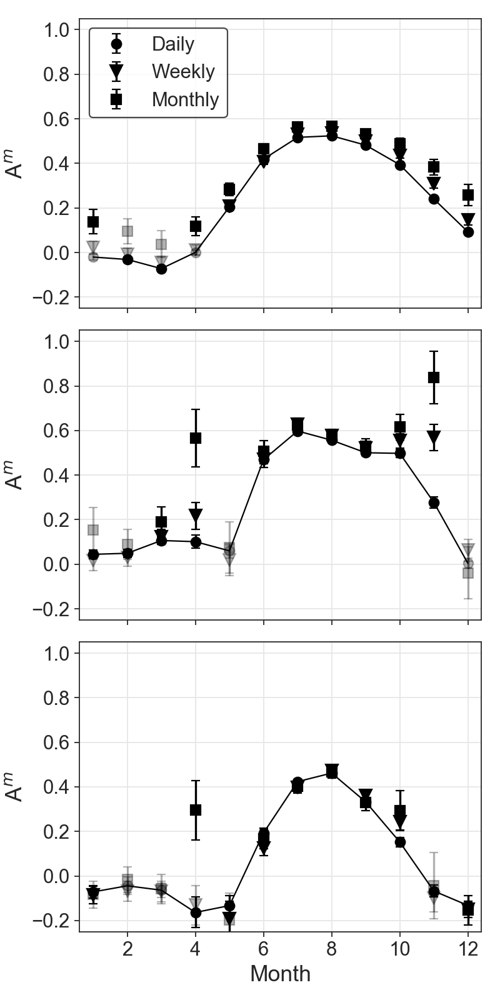

In [409]:
# For designating winter months in figure
mon = [1,2,3,4,5,6,7,8,9,10,11,12]

# Plot figure
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True,figsize=(5, 10))
plt.tick_params(labelsize=14)

a1 = ax[0]
a1.set_facecolor('white')
a1.grid(color='.9')
a1.tick_params(labelsize=14)
a1.plot(mon,resultICD.params[1:13],color='k',linewidth=1,label='_no legend_')
a1.errorbar(mon,paramsDI,errDI,color='k',fmt='o',marker='o',ms=7,capsize=3,alpha=0.3,label='_no legend_')
a1.errorbar(mon,paramspDI,errpDI,color='k',fmt='o',marker='o',ms=7,capsize=3,label='Daily')
a1.errorbar(mon,paramsI,errI,color='k',fmt='o',marker='v',ms=9,capsize=3,alpha=0.3,label='_no legend_')
a1.errorbar(mon,paramspI,errpI,color='k',fmt='o',marker='v',ms=9,capsize=3,label='Weekly')
a1.errorbar(mon,paramsMI,errMI,color='k',fmt='o',marker='s',ms=7,capsize=3,alpha=0.3,label='_no legend_')
a1.errorbar(mon,paramspMI,errpMI,color='k',fmt='o',marker='s',ms=7,capsize=3,label='Monthly')
a1.set_ylim([-0.25,1.05])
a1.set_ylabel('A$^m$',fontsize=16)
a1.legend(loc='upper left',markerscale=1,fontsize=14,edgecolor='0.1',facecolor='white')

a2 = ax[1]
a2.set_facecolor('white')
a2.grid(color='.9')
a2.tick_params(labelsize=14)
a2.plot(mon,resultSD.params[1:13],color='k',linewidth=1,label='_no legend_')
a2.errorbar(mon,paramsDS,errDS,color='k',fmt='o',marker='o',ms=7,capsize=3,alpha=0.3,label='_no legend_')
a2.errorbar(mon,paramspDS,errpDS,color='k',fmt='o',marker='o',ms=7,capsize=3,label='Daily')
a2.errorbar(mon,paramsS,errS,color='k',fmt='o',marker='v',ms=9,capsize=3,alpha=0.3,label='_no legend_')
a2.errorbar(mon,paramspS,errpS,color='k',fmt='o',marker='v',ms=9,capsize=3,label='Weekly')
a2.errorbar(mon,paramsMS,errMS,color='k',fmt='o',marker='s',ms=7,capsize=3,alpha=0.3,label='_no legend_')
a2.errorbar(mon,paramspMS,errpMS,color='k',fmt='o',marker='s',ms=7,capsize=3,label='Monthly')
a2.set_ylim([-0.25,1.05])
a2.set_ylabel('A$^m$',fontsize=16)

a3 = ax[2]
a3.set_facecolor('white')
a3.grid(color='.9')
a3.tick_params(labelsize=14)
a3.plot(mon,resultED.params[1:13],color='k',linewidth=1,label='_no legend_')
a3.errorbar(mon,paramsDE,errDE,color='k',fmt='o',marker='o',ms=7,capsize=3,alpha=0.3,label='_no legend_')
a3.errorbar(mon,paramspDE,errpDE,color='k',fmt='o',marker='o',ms=7,capsize=3,label='Daily')
a3.errorbar(mon,paramsE,errE,color='k',fmt='o',marker='v',ms=9,capsize=3,alpha=0.3,label='_no legend_')
a3.errorbar(mon,paramspE,errpE,color='k',fmt='o',marker='v',ms=9,capsize=3,label='Weekly')
a3.errorbar(mon,paramsME,errME,color='k',fmt='o',marker='s',ms=7,capsize=3,alpha=0.3,label='_no legend_')
a3.errorbar(mon,paramspME,errpME,color='k',fmt='o',marker='s',ms=7,capsize=3,label='Monthly')
a3.set_xlim([0.6,12.4])
a3.set_ylim([-0.25,1.05])
a3.set_ylabel('A$^m$',fontsize=16)
a3.set_xlabel('Month',fontsize=16)

plt.tight_layout()
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/AirTvSSTparams.jpg', format='jpg', dpi=600)
plt.show()

In [411]:
# Calculate without mooring using best time avg window - daily
def detrend_sstS(row):
    parametersS = parametersSD
    if row['Month']==1:
        a1 = parametersS[1]
    elif row['Month']==2:
        a1 = parametersS[2]
    elif row['Month']==3:
        a1 = parametersS[3]
    elif row['Month']==4:
        a1 = parametersS[4]
    elif row['Month']==5:
        a1 = parametersS[5]
    elif row['Month']==6:
        a1 = parametersS[6]
    elif row['Month']==7:
        a1 = parametersS[7]
    elif row['Month']==8:
        a1 = parametersS[8]
    elif row['Month']==9:
        a1 = parametersS[9]
    elif row['Month']==10:
        a1 = parametersS[10]
    elif row['Month']==11:
        a1 = parametersS[11]
    elif row['Month']==12:
        a1 = parametersS[12]
    return row['allShelfMean'] - a1 * row['ERA5AirTempS']

In [412]:
allD['allShelfMean_fulldetrendwo'] = allD.apply(detrend_sstS, axis=1)
allW['allShelfMean_fulldetrendwo'] = allD['allShelfMean_fulldetrendwo'].resample('W').mean()
allM['allShelfMean_fulldetrendwo'] = allD['allShelfMean_fulldetrendwo'].resample('MS').mean()
allA['allShelfMean_fulldetrendwo'] = allD['allShelfMean_fulldetrendwo'].resample('AS').mean()
allM['allShelfMean_fulldetrenderrwo'] = allD['allShelfMean_fulldetrendwo'].resample('MS').sem()
allM['allShelfMean_fulldetrendstdwo'] = allD['allShelfMean_fulldetrendwo'].resample('MS').std()
detrupwo = allM['allShelfMean_fulldetrendwo'] + allM['allShelfMean_fulldetrendstdwo']
detrdnwo = allM['allShelfMean_fulldetrendwo'] - allM['allShelfMean_fulldetrendstdwo']

# Figure 3 - Raw data

<IPython.core.display.Javascript object>


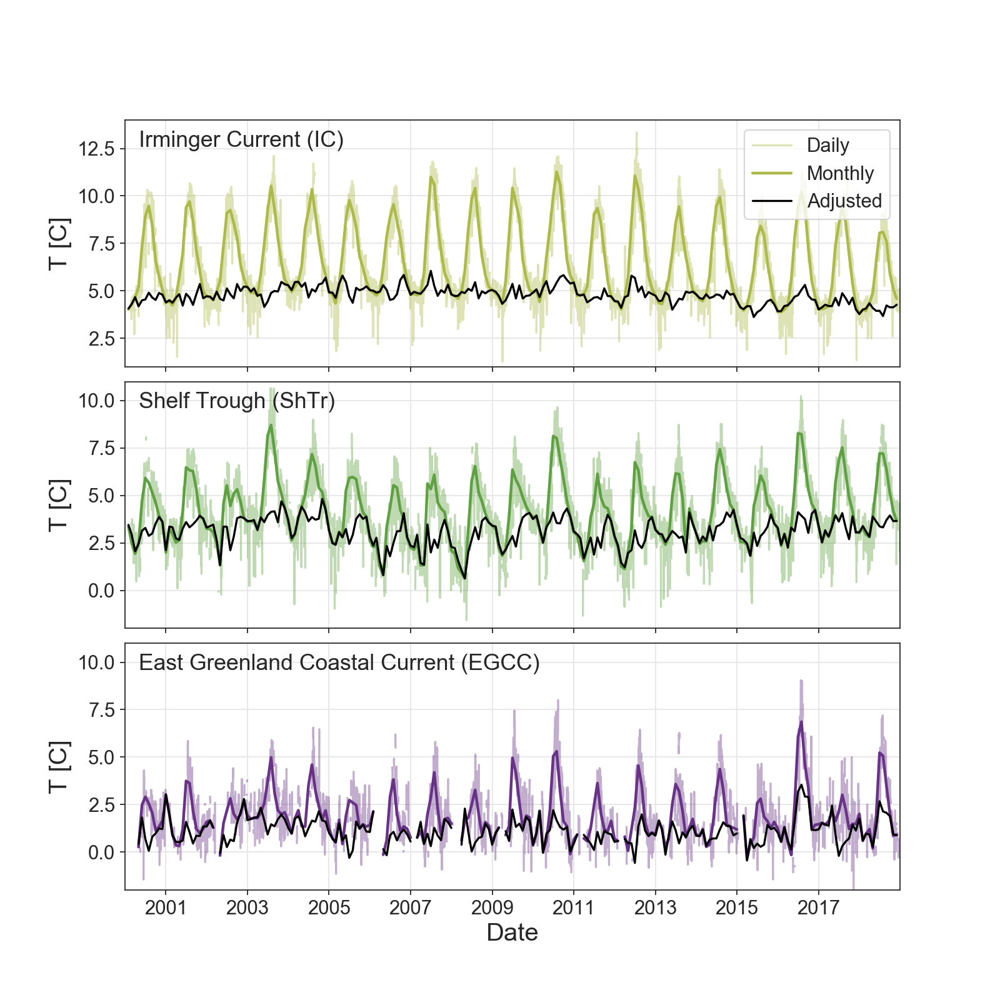

In [413]:
# Requires all of the above data to be run individually
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True,figsize=(10, 10))

handles = []
a1 = ax[0]
a1.set_facecolor('white')
a1.grid(color='.9')
a1.tick_params(labelsize=14)
h, = a1.plot(allD['allICMean'],color='C1',alpha=.4,label='Daily')
handles.append(copy.copy(h))
h, = a1.plot(allM['allICMean'],color='C1',linewidth=2,label='Monthly')
handles.append(copy.copy(h))
h, = a1.plot(allM['allICMean_fulldetrend'],color='k',label='Adjusted')
handles.append(copy.copy(h))
a1.text('5-1-2000',12.6,'Irminger Current (IC)',fontsize=16)
a1.set_ylim([1,14])
a1.set_ylabel('T [C]',fontsize=18)

cm = ['C1','C1','k']
for i,h in enumerate(handles):
    h.set_color(cm[i])

leg = a1.legend(handles=handles,markerscale=2,fontsize=14)

a2 = ax[1]
a2.set_facecolor('white')
a2.grid(color='.9')
a2.tick_params(labelsize=14)
a2.plot(allD['allShelfMean'],color='C3',alpha=.4,label='_no legend_')
a2.plot(allM['allShelfMean'],color='C3',linewidth=2,label='_no legend_')
a2.plot(allM['allShelfMean_fulldetrendwo'],color='k',label='_no legend_')
a2.text('5-1-2000',9.6,'Shelf Trough (ShTr)',fontsize=16)
a2.set_ylabel('T [C]',fontsize=18)
a2.set_ylim([-2,11])

a3 = ax[2]
a3.set_facecolor('white')
a3.grid(color='.9')
a3.tick_params(labelsize=14)
a3.plot(allD['allEgcMean'],color='C4',alpha=.4,label='_no legend_')
a3.plot(allM['allEgcMean'],color='C4',linewidth=2,label='_no legend_')
a3.plot(allM['allEgcMean_fulldetrend'],color='k',label='_no legend_')
a3.text('5-1-2000',9.6,'East Greenland Coastal Current (EGCC)',fontsize=16)
a3.set_ylabel('T [C]',fontsize=18)
a3.set_xlim(['1-1-2000','12-31-2018'])
a3.set_ylim([-2,11])
a3.set_xlabel('Date',fontsize=18)

plt.subplots_adjust(hspace=0.06)
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/RegionTimeseries.jpg', format='jpg', dpi=1000)
plt.show()

# Figure S2 - SST v AirT

In [414]:
allD['TempIC180m'] = moorICD['TempIC180m']
allM['TempIC180m'] = moorICM['TempIC180m']

allD_sh = allD.loc[allD.index.month.isin([4,5,10,11])]
allD_nw = allD.loc[allD.index.month.isin([4,5,6,7,8,9,10,11])]
allW_sh = allW.loc[allW.index.month.isin([4,5,10,11])]
allW_ap = allW_notwint.loc[allW_notwint.index.month.isin([4])]
allW_nw = allW.loc[allW.index.month.isin([4,5,6,7,8,9,10,11])]
allM_wint = allM.loc[allM.index.month.isin([1,2,3,12])]
allM_sum = allM.loc[allM.index.month.isin([6,7,8,9])]
allM_nw = allM.loc[allM.index.month.isin([4,5,6,7,8,9,10,11])]
allM_sh = allM.loc[allM.index.month.isin([4,5,10,11])]
allM_may = allM.loc[allM.index.month.isin([5])]

<IPython.core.display.Javascript object>


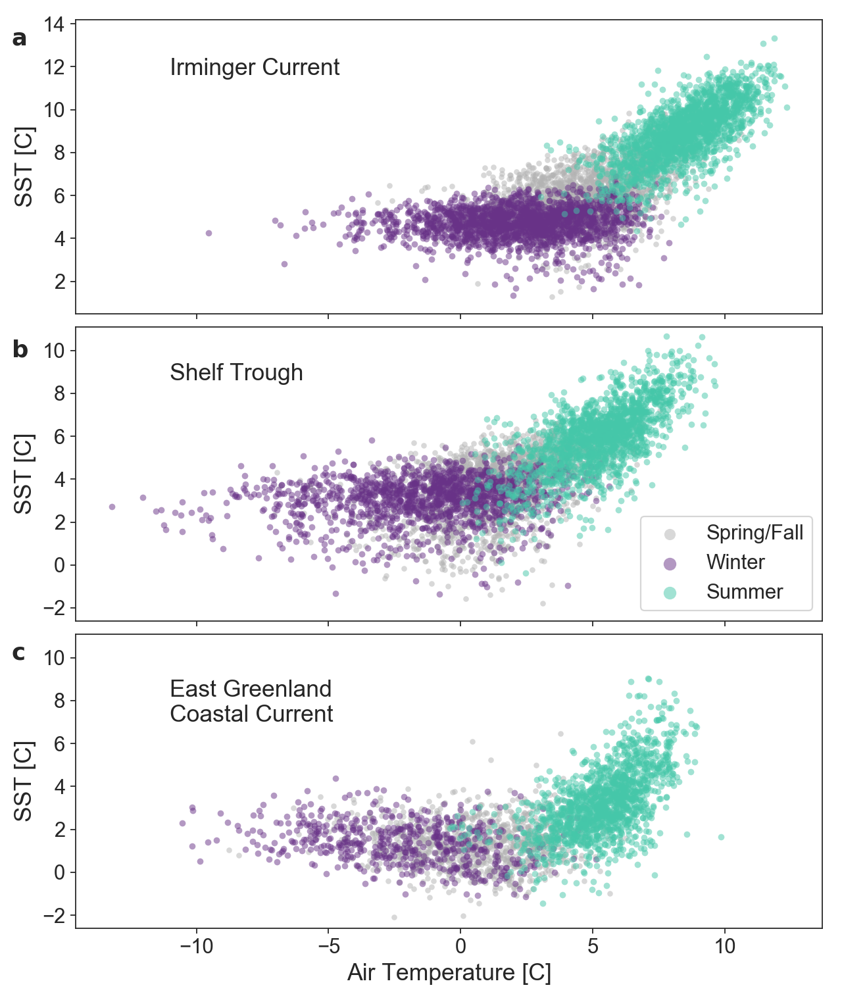

In [415]:
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True,figsize=(8,9.5))

a1 = ax[0]
a1.tick_params(labelsize=14)
a1.scatter(allD_sh['ERA5AirTempI'],allD_sh['allICMean'],color='0.7',linewidth=0,alpha=0.5,s=15,label='Spring/Fall')
a1.scatter(allD_wint['ERA5AirTempI'],allD_wint['allICMean'],color='C4',linewidth=0,alpha=0.5,s=19,label='Winter')
a1.scatter(allD_sum['ERA5AirTempI'],allD_sum['allICMean'],color='C7',linewidth=0,alpha=0.5,s=19,label='Summer')
a1.text(-11,11.6,'Irminger Current',fontsize=16)
a1.text(-17,13,'$\\bf{a}$',fontsize=16)
a1.set_ylim(0.5,14.2)
a1.set_ylabel('SST [C]',fontsize=16)

a3 = ax[1]
a3.tick_params(labelsize=14)
a3.scatter(allD_sh['ERA5AirTempS'],allD_sh['allShelfMean'],color='0.7',linewidth=0,alpha=0.5,s=15,label='Spring/Fall')
a3.scatter(allD_wint['ERA5AirTempS'],allD_wint['allShelfMean'],color='C4',linewidth=0,alpha=0.5,s=19,label='Winter')
a3.scatter(allD_sum['ERA5AirTempS'],allD_sum['allShelfMean'],color='C7',linewidth=0,alpha=0.5,s=19,label='Summer')
a3.text(-11,8.6,'Shelf Trough',fontsize=16)
a3.text(-17,9.7,'$\\bf{b}$',fontsize=16)
a3.set_ylim(-2.6,11.1)
a3.set_ylabel('SST [C]',fontsize=16)
a3.legend(markerscale=2,fontsize=14,loc='lower right')

a2 = ax[2]
a2.tick_params(labelsize=14)
a2.scatter(allD_sh['ERA5AirTempE'],allD_sh['allEgcMean'],color='0.7',linewidth=0,alpha=0.5,s=15,label='Spring/Fall')
a2.scatter(allD_wint['ERA5AirTempE'],allD_wint['allEgcMean'],color='C4',linewidth=0,alpha=0.5,s=19,label='Winter')
a2.scatter(allD_sum['ERA5AirTempE'],allD_sum['allEgcMean'],color='C7',linewidth=0,alpha=0.5,s=19,label='Summer')
a2.text(-11,7.0,'East Greenland\nCoastal Current',fontsize=16)
a2.text(-17,9.9,'$\\bf{c}$',fontsize=16)
a2.set_ylim(-2.6,11.1)
a2.set_ylabel('SST [C]',fontsize=16)
a2.set_xlabel('Air Temperature [C]',fontsize=16)

plt.tight_layout(h_pad=0.4)
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/AirvsSST.jpg', format='jpg', dpi=1000)
plt.show()

In [416]:
# Seasonal correlation with air temperature
resultSeas = sm.ols(formula="allShelfMean ~ ERA5AirTemp", data=allW_sh).fit()
print resultSeas.summary()

                            OLS Regression Results                            
Dep. Variable:           allShelfMean   R-squared:                       0.231
Model:                            OLS   Adj. R-squared:                  0.229
Method:                 Least Squares   F-statistic:                     97.29
Date:                Tue, 27 Oct 2020   Prob (F-statistic):           3.11e-20
Time:                        10:02:20   Log-Likelihood:                -555.09
No. Observations:                 325   AIC:                             1114.
Df Residuals:                     323   BIC:                             1122.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       2.3220      0.140     16.590      

# Figure S3 - Mooring v SST

In [421]:
allD_regsum = allD[['Tempshelf290m','allShelfMean_fulldetrendwo','TempIC180m','allICMean_fulldetrend']].loc[allD.index.month.isin([6,7,8,9])]
allD_regwint = allD[['Tempshelf290m','allShelfMean_fulldetrendwo','TempIC180m','allICMean_fulldetrend']].loc[allD.index.month.isin([1,2,3,12])]
allD_regsh = allD[['Tempshelf290m','allShelfMean_fulldetrendwo','TempIC180m','allICMean_fulldetrend']].loc[allD.index.month.isin([4,5,9,10,11])]
allD_regnonw = allD[['Tempshelf290m','allShelfMean_fulldetrendwo','TempIC180m','allICMean_fulldetrend']].loc[allD.index.month.isin([4,5,6,7,8,9,10,11])]

allW_regsum = allW[['Tempshelf290m','allShelfMean_fulldetrendwo']].loc[allW.index.month.isin([6,7,8,9])]
allW_regwint = allW[['Tempshelf290m','allShelfMean_fulldetrendwo']].loc[allW.index.month.isin([1,2,3,12])]
allW_regsh = allW[['Tempshelf290m','allShelfMean_fulldetrendwo']].loc[allW.index.month.isin([4,5,9,10,11])]
allW_regnonw = allW[['Tempshelf290m','allShelfMean_fulldetrendwo']].loc[allW.index.month.isin([4,5,6,7,8,9,10,11])]

allW['Tempshelf290m_std'] = allD['Tempshelf290m'].resample('W').std()
allW['Tempshelf290m_err'] = allD['Tempshelf290m'].resample('W').sem()

allM_regsum = allM[['Tempshelf290m','allShelfMean_fulldetrendwo','TempIC180m','allICMean_fulldetrend']].loc[allM.index.month.isin([6,7,8,9])]
allM_regwint = allM[['Tempshelf290m','allShelfMean_fulldetrendwo','TempIC180m','allICMean_fulldetrend']].loc[allM.index.month.isin([1,2,3,12])]
allM_regsh = allM[['Tempshelf290m','allShelfMean_fulldetrendwo','TempIC180m','allICMean_fulldetrend']].loc[allM.index.month.isin([4,5,9,10,11])]
allM_regnonw = allM[['Tempshelf290m','allShelfMean_fulldetrendwo','TempIC180m','allICMean_fulldetrend']].loc[allM.index.month.isin([4,5,6,7,8,9,10,11])]

allM['Tempshelf290m_std'] = allD['Tempshelf290m'].resample('MS').std()
allM['Tempshelf290m_err'] = allD['Tempshelf290m'].resample('MS').sem()

In [422]:
resultDMoor = sm.ols(formula="Tempshelf290m ~ allShelfMean_fulldetrendwo", data=allD).fit()
parametersDMoor = resultDMoor.params
print resultDMoor.summary()

                            OLS Regression Results                            
Dep. Variable:          Tempshelf290m   R-squared:                       0.128
Model:                            OLS   Adj. R-squared:                  0.128
Method:                 Least Squares   F-statistic:                     145.3
Date:                Tue, 27 Oct 2020   Prob (F-statistic):           2.55e-31
Time:                        10:03:22   Log-Likelihood:                -1520.4
No. Observations:                 988   AIC:                             3045.
Df Residuals:                     986   BIC:                             3055.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

In [423]:
resultWMoor = sm.ols(formula="Tempshelf290m ~ allShelfMean_fulldetrendwo", data=allW).fit()
parametersWMoor = resultWMoor.params
print resultWMoor.summary()

                            OLS Regression Results                            
Dep. Variable:          Tempshelf290m   R-squared:                       0.243
Model:                            OLS   Adj. R-squared:                  0.240
Method:                 Least Squares   F-statistic:                     65.28
Date:                Tue, 27 Oct 2020   Prob (F-statistic):           5.73e-14
Time:                        10:03:23   Log-Likelihood:                -283.50
No. Observations:                 205   AIC:                             571.0
Df Residuals:                     203   BIC:                             577.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

In [424]:
resultAMoor = sm.ols(formula="Tempshelf290m ~ allShelfMean_fulldetrendwo", data=allM_sum).fit()
parametersAMoor = resultAMoor.params
print resultAMoor.summary()
# 0.94+-0.13 , 1.18+-0.16

                            OLS Regression Results                            
Dep. Variable:          Tempshelf290m   R-squared:                       0.325
Model:                            OLS   Adj. R-squared:                  0.280
Method:                 Least Squares   F-statistic:                     7.225
Date:                Tue, 27 Oct 2020   Prob (F-statistic):             0.0169
Time:                        10:03:24   Log-Likelihood:                -14.992
No. Observations:                  17   AIC:                             33.98
Df Residuals:                      15   BIC:                             35.65
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

/usr/local/lib/python2.7/site-packages/scipy/stats/stats.py:1394: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=17
  "anyway, n=%i" % int(n))


<IPython.core.display.Javascript object>


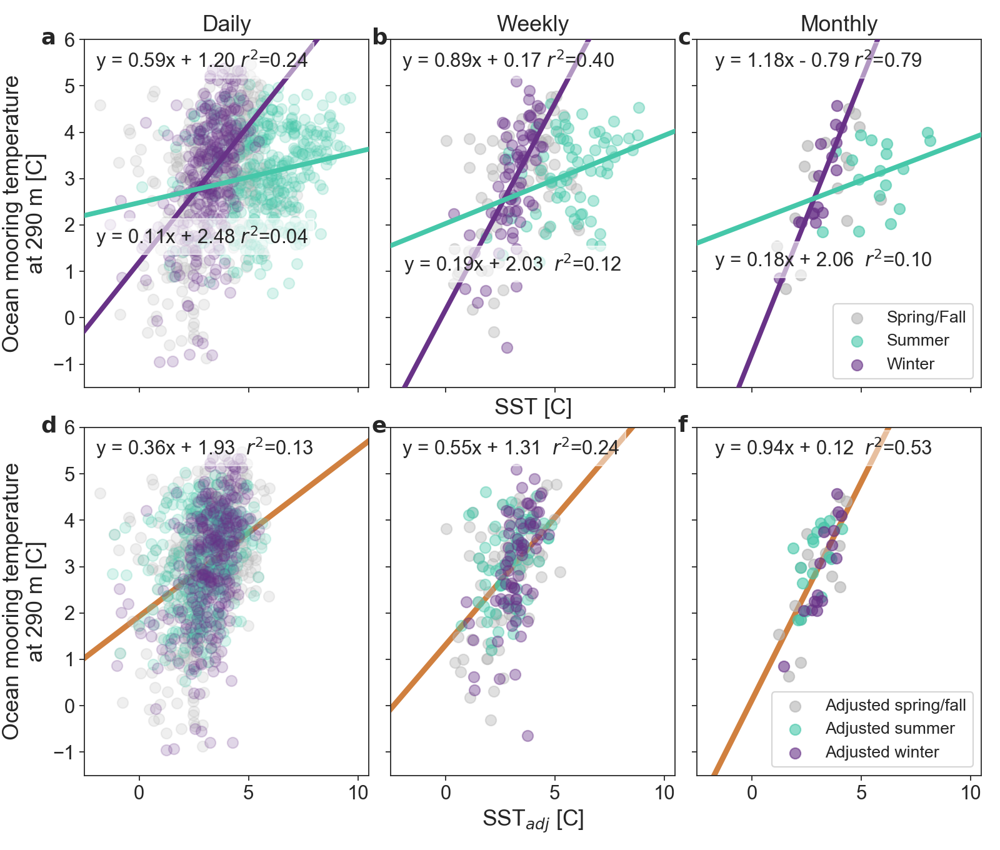

In [425]:
fig, ax = plt.subplots(nrows=2, ncols=3, sharey=True,sharex=True,figsize=(10,8.5))

a1 = ax[0,0]
a1.tick_params(labelsize=14)
a1.scatter(allD_sh['allShelfMean'],allD_sh['Tempshelf290m'],color='0.7',s=60,alpha=0.2,label='Spring/Fall')
a1.scatter(allD_sum['allShelfMean'],allD_sum['Tempshelf290m'],color='C7',s=60,alpha=0.2,label='Summer')
a1.scatter(allD_wint['allShelfMean'],allD_wint['Tempshelf290m'],color='C4',s=60,alpha=0.2,label='Winter')

# Linear regressions for winter and summer from statsmodel OLS
xi = np.arange(-10,20,1)
a1.plot(xi,0.59*xi+1.20,color='C4',linewidth=3.5,zorder=3) # winter only
a1.text(-2,5.4,'y = 0.59x + 1.20 $r^2$=0.24',fontsize=14,rotation=0,bbox=dict(facecolor='white', alpha=0.5)) 
a1.plot(xi,0.11*xi+2.48,color='C7',linewidth=3.5,zorder=3)  # summer only
a1.text(-2,1.6,'y = 0.11x + 2.48 $r^2$=0.04',fontsize=14,rotation=0,bbox=dict(facecolor='white', alpha=0.6)) 
a1.text(-4.5,5.9,'$\\bf{a}$',fontsize=16)
a1.set_xlim(-2.5,10.5)
a1.set_ylabel('Ocean mooring temperature\nat 290 m [C]',fontsize=16)
a1.set_title('Daily',fontsize=16)

a2 = ax[0,1]
a2.tick_params(labelsize=14)
a2.scatter(allW_sh['allShelfMean'],allW_sh['Tempshelf290m'],color='0.7',s=60,alpha=0.4,label='Spring/Fall')
a2.scatter(allW_sum['allShelfMean'],allW_sum['Tempshelf290m'],color='C7',s=60,alpha=0.4,label='Summer')
a2.scatter(allW_wint['allShelfMean'],allW_wint['Tempshelf290m'],color='C4',s=60,alpha=0.4,label='Winter')

# Linear regressions for winter and summer from statsmodel OLS
a2.plot(xi,0.89*xi+0.17,color='C4',linewidth=3.5,zorder=3) # winter only
a2.text(-2,5.4,'y = 0.89x + 0.17 $r^2$=0.40',fontsize=14,rotation=0,bbox=dict(facecolor='white', alpha=0.5)) 
a2.plot(xi,0.19*xi+2.03,color='C7',linewidth=3.5,zorder=3)  # summer only
a2.text(-1.9,1.0,'y = 0.19x + 2.03  $r^2$=0.12',fontsize=14,rotation=0,bbox=dict(facecolor='white', alpha=0.6)) 
a2.text(-3.4,5.9,'$\\bf{b}$',fontsize=16)
a2.set_xlim(-2.5,10.5)
a2.set_xlabel('SST [C]',fontsize=16,labelpad=8)
a2.set_title('Weekly',fontsize=16)

a3 = ax[0,2]
a3.tick_params(labelsize=14)
a3.scatter(allM_sh['allShelfMean'],allM_sh['Tempshelf290m'],color='0.7',s=60,alpha=0.6,label='Spring/Fall')
a3.scatter(allM_sum['allShelfMean'],allM_sum['Tempshelf290m'],color='C7',s=60,alpha=0.6,label='Summer')
a3.scatter(allM_wint['allShelfMean'],allM_wint['Tempshelf290m'],color='C4',s=60,alpha=0.6,label='Winter')

# Linear regressions for winter and summer from statsmodel OLS
a3.plot(xi,1.18*xi-0.79,color='C4',linewidth=3.5,zorder=3) # winter only
a3.text(-1.7,5.4,'y = 1.18x - 0.79 $r^2$=0.79',fontsize=14,rotation=0,bbox=dict(facecolor='white', alpha=0.5)) 
a3.plot(xi,0.18*xi+2.06,color='C7',linewidth=3.5,zorder=3)  # summer only
a3.text(-1.7,1.1,'y = 0.18x + 2.06  $r^2$=0.10',fontsize=14,rotation=0,bbox=dict(facecolor='white', alpha=0.6)) 
a3.text(-3.4,5.9,'$\\bf{c}$',fontsize=16)
a3.set_ylim(-1.5,6)
a3.set_xlim(-2.5,10.5)
a3.legend(markerscale=1,fontsize=12)
a3.set_title('Monthly',fontsize=16)

# Bottom
a4 = ax[1,0]
a4.tick_params(labelsize=14)
a4.scatter(allD_regsh['allShelfMean_fulldetrendwo'],allD_regsh['Tempshelf290m'],color='0.7',s=60,alpha=0.2,label='Adjusted spring/fall')
a4.scatter(allD_regsum['allShelfMean_fulldetrendwo'],allD_regsum['Tempshelf290m'],color='C7',s=60,alpha=0.2,label='Adjusted summer')
a4.scatter(allD_regwint['allShelfMean_fulldetrendwo'],allD_wint['Tempshelf290m'],color='C4',s=60,alpha=0.2,label='Adjusted winter')

# Linear regressions for winter and summer from statsmodel OLS
a4.plot(xi,0.36*xi+1.93,color='C9',linewidth=4,zorder=-1) # detrended
a4.text(-2,5.4,'y = 0.36x + 1.93  $r^2$=0.13',fontsize=14,bbox=dict(facecolor='white', alpha=0.5)) 
a4.text(-4.5,5.9,'$\\bf{d}$',fontsize=16)
a4.set_ylim(-1.5,6)
a4.set_xlim(-2.5,10.5)
a4.set_ylabel('Ocean mooring temperature\nat 290 m [C]',fontsize=16)

a5 = ax[1,1]
a5.tick_params(labelsize=14)
a5.scatter(allW_regsh['allShelfMean_fulldetrendwo'],allW_regsh['Tempshelf290m'],color='0.7',s=60,alpha=0.4,label='Adjusted spring/fall')
a5.scatter(allW_regsum['allShelfMean_fulldetrendwo'],allW_regsum['Tempshelf290m'],color='C7',s=60,alpha=0.4,label='Adjusted summer')
a5.scatter(allW_regwint['allShelfMean_fulldetrendwo'],allW_wint['Tempshelf290m'],color='C4',s=60,alpha=0.4,label='Adjusted winter')

# Linear regressions for winter and summer from statsmodel OLS
a5.plot(xi,0.55*xi+1.31,color='C9',linewidth=4,zorder=-1) # detrended
a5.text(-2,5.4,'y = 0.55x + 1.31  $r^2$=0.24',fontsize=14,bbox=dict(facecolor='white', alpha=0.5)) 
a5.text(-3.4,5.9,'$\\bf{e}$',fontsize=16)
a5.set_xlim(-2.5,10.5)
a5.set_xlabel('SST$_{adj}$ [C]',fontsize=16)

a6 = ax[1,2]
a6.tick_params(labelsize=14)
a6.scatter(allM_regsh['allShelfMean_fulldetrendwo'],allM_regsh['Tempshelf290m'],color='0.7',s=60,alpha=0.6,label='Adjusted spring/fall')
a6.scatter(allM_regsum['allShelfMean_fulldetrendwo'],allM_regsum['Tempshelf290m'],color='C7',s=60,alpha=0.6,label='Adjusted summer')
a6.scatter(allM_regwint['allShelfMean_fulldetrendwo'],allM_wint['Tempshelf290m'],color='C4',s=60,alpha=0.6,label='Adjusted winter')

# Linear regressions for winter and summer from statsmodel OLS
a6.plot(xi,0.94*xi+0.12,color='C9',linewidth=4,zorder=-1) # detrended
a6.text(-1.7,5.4,'y = 0.94x + 0.12  $r^2$=0.53',fontsize=14,bbox=dict(facecolor='white', alpha=0.5)) 
a6.text(-3.4,5.9,'$\\bf{f}$',fontsize=16)
a6.set_xlim(-2.5,10.5)
a6.legend(markerscale=1,fontsize=12)

plt.tight_layout(h_pad=0.4)
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/DWMSSTvMoor.jpg', format='jpg', dpi=1000)
plt.show()

<IPython.core.display.Javascript object>


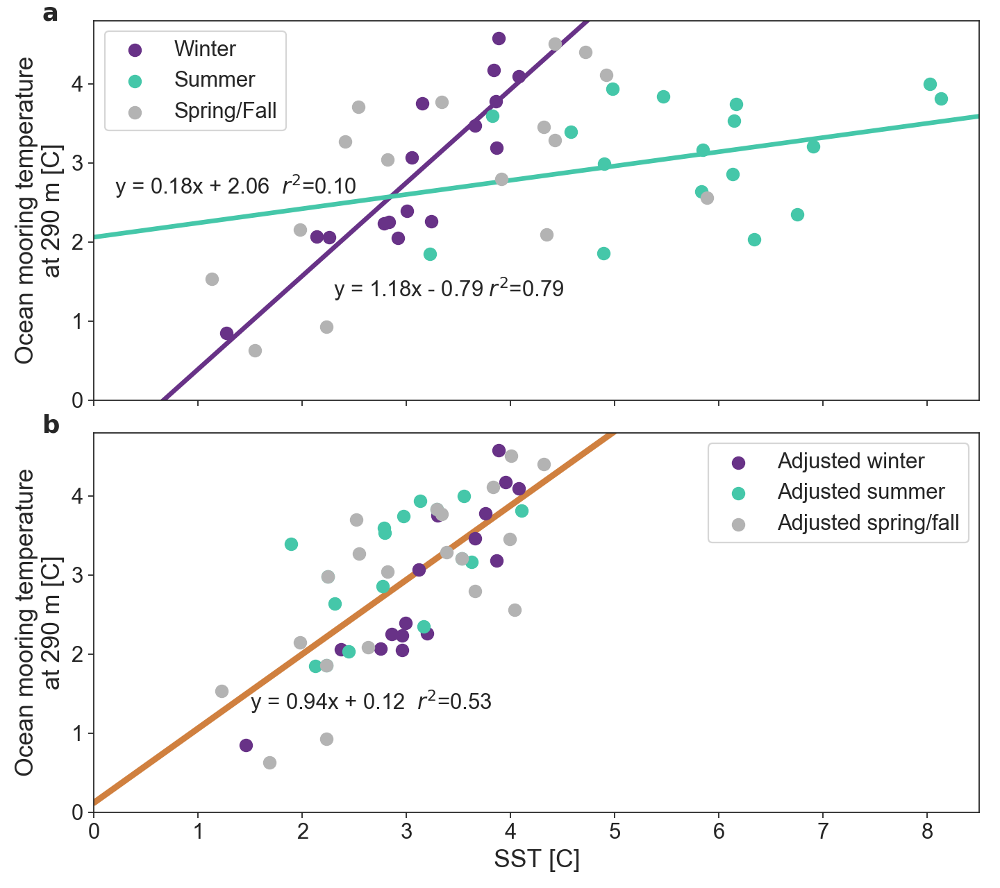

In [308]:
fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True,figsize=(9, 8))

a1 = ax[0]
a1.tick_params(labelsize=14)
a1.scatter(allM_wint['allShelfMean'],allM_wint['Tempshelf290m'],color='C4',s=60,label='Winter')
a1.scatter(allM_sum['allShelfMean'],allM_sum['Tempshelf290m'],color='C7',s=60,label='Summer')
a1.scatter(allM_sh['allShelfMean'],allM_sh['Tempshelf290m'],color='0.7',s=60,label='Spring/Fall')

# Linear regressions for winter and summer from statsmodel OLS
xi = np.arange(0,10,1)
a1.plot(xi,1.18*xi-0.79,color='C4',linewidth=3,zorder=-1) # winter only
a1.text(2.3,1.3,'y = 1.18x - 0.79 $r^2$=0.79',fontsize=14,rotation=0) 
a1.plot(xi,0.18*xi+2.06,color='C7',linewidth=3,zorder=-1)  # summer only
a1.text(0.2,2.6,'y = 0.18x + 2.06  $r^2$=0.10',fontsize=14, rotation=0) 
a1.text(-0.5,4.8,'$\\bf{a}$',fontsize=16)
a1.set_ylim(0.0,4.8)
a1.set_xlim(0.0,8.5)
a1.set_ylabel('Ocean mooring temperature\nat 290 m [C]',fontsize=16)
a1.legend(markerscale=1,fontsize=14)

a3 = ax[1]
a3.tick_params(labelsize=14)
a3.scatter(allM_regwint['allShelfMean_fulldetrendwo'],allM_wint['Tempshelf290m'],color='C4',s=60,label='Adjusted winter')
a3.scatter(allM_regsum['allShelfMean_fulldetrendwo'],allM_regsum['Tempshelf290m'],color='C7',s=60,label='Adjusted summer')
a3.scatter(allM_regsh['allShelfMean_fulldetrendwo'],allM_regsh['Tempshelf290m'],color='0.7',s=60,label='Adjusted spring/fall')

# Linear regressions for winter and summer from statsmodel OLS
a3.plot(xi,0.94*xi+0.12,color='C9',linewidth=4,zorder=-1) # detrended
a3.text(1.5,1.3,'y = 0.94x + 0.12  $r^2$=0.53',fontsize=14) 
a3.text(-0.5,4.8,'$\\bf{b}$',fontsize=16)
a3.set_ylim(0.0,4.8)
a3.set_xlim(0.0,8.5)
a3.set_ylabel('Ocean mooring temperature\nat 290 m [C]',fontsize=16)
a3.set_xlabel('SST [C]',fontsize=16)
a3.legend(markerscale=1,fontsize=14)

plt.tight_layout()
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/OceanvsSST.jpg', format='jpg', dpi=1000)
plt.show()

In [426]:
# Make sure slope/intercept are being calculated correctly
forReg = allM[['allShelfMean_fulldetrendwo','Tempshelf290m']].dropna(axis=0)
X = np.array(forReg['allShelfMean_fulldetrendwo']).reshape(forReg.shape[0],1)
y = np.array(forReg['Tempshelf290m']).reshape(forReg.shape[0],1)
reg = LinearRegression().fit(X,y)
print (reg.coef_)
print (reg.intercept_)

[[0.94183431]]
[0.11522961]


# Figure 4 - Proxy

In [427]:
# RMS calculations for Shelf
forRMS = allM[['Tempshelf290m','allShelfMean_fulldetrendwo']].dropna(axis=0)
forRMSwint = allM[['Tempshelf290m','allShelfMean_fulldetrendwo']].loc[allM.index.month.isin([1,2,3,12])].dropna(axis=0)
forRMSnonw = allM[['Tempshelf290m','allShelfMean_fulldetrendwo']].loc[allM.index.month.isin([4,5,6,7,8,9,10,11])].dropna(axis=0)
forRMSsum = allM[['Tempshelf290m','allShelfMean_fulldetrendwo']].loc[allM.index.month.isin([6,7,8,9])].dropna(axis=0)

rms = sqrt(mean_squared_error(forRMS['Tempshelf290m'], forRMS['allShelfMean_fulldetrendwo'])) # actual, predicted
rmswint = sqrt(mean_squared_error(forRMSwint['Tempshelf290m'], forRMSwint['allShelfMean_fulldetrendwo'])) # actual, predicted
rmsnonw = sqrt(mean_squared_error(forRMSnonw['Tempshelf290m'], forRMSnonw['allShelfMean_fulldetrendwo'])) # actual, predicted
rmssum = sqrt(mean_squared_error(forRMSsum['Tempshelf290m'], forRMSsum['allShelfMean_fulldetrendwo'])) # actual, predicted

print ("RMS = "+str(rms))
print ("Winter RMS = "+str(rmswint))
print ("Non-winter RMS = "+str(rmsnonw))
print ("Summer RMS = "+str(rmssum))

RMS = 0.661503822491
Winter RMS = 0.565832501481
Non-winter RMS = 0.703220197758
Summer RMS = 0.656838150164


<IPython.core.display.Javascript object>


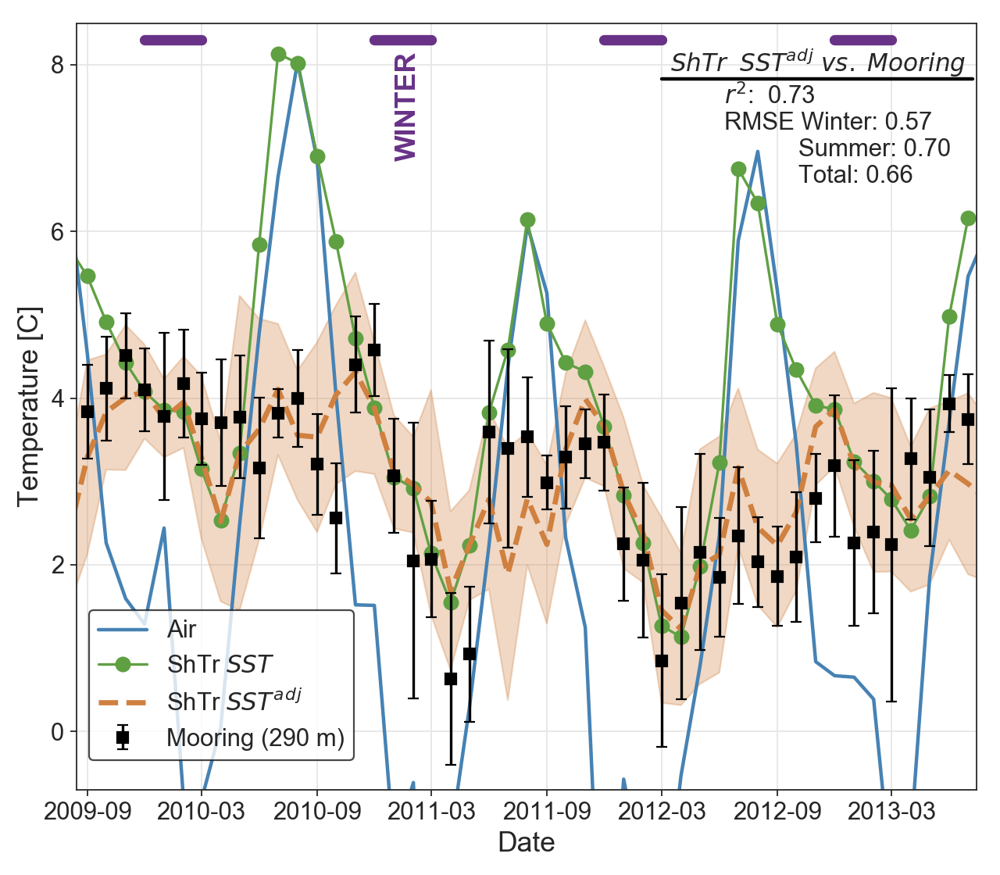

In [428]:
# For designating winter months in figure
allM['Winter'] = allM['allICMean'].index.month.isin([1,2,3,12])*8.3
wintwint = allM['Winter'].where(allM['Winter']==8.3)

# Plot figure
fig, ax = plt.subplots(figsize=(8, 7))
plt.tick_params(labelsize=14)

ax.set_facecolor('white')
ax.grid(color='.9')
plt.plot(allM.index,allM['ERA5AirTempS'],color='steelblue',linewidth=2.0,label='Air')
plt.errorbar(allM.index,allM['Tempshelf290m'],allM['Tempshelf290m_std'],color='k',fmt='o',marker='s',ms=6,capsize=3,label='Mooring (290 m)',zorder=3)
plt.plot(allM.index,allM['allShelfMean'],color='C3',marker='o',linewidth=1.5,ms=8,label='ShTr $SST$') 
plt.plot(allM.index,allM['allShelfMean_fulldetrendwo'],'--',color='C9',ms=5,linewidth=3.0,label='ShTr $SST^a$$^d$$^j$',zorder=2)
plt.fill_between(allM.index, detrupwo, detrdnwo,color='C9', alpha=.3,label='_no legend_')
 
plt.plot(wintwint.index,wintwint,color='C4',linewidth=6.0,label='_no legend_')
plt.text('23-Jan-2011',7.5,'WINTER',rotation=90,color='C4',va='center',ha='center',weight='bold',fontsize=16) 
plt.text('15-Mar-2012',6.6,'$\it{ShTr}$  $\it{SST}$$^a$$^d$$^j$ $\it{vs.}$ $\it{Mooring}$\n        $r^2$:  0.73\n        RMSE Winter: 0.57\n                   Summer: 0.70\n                   Total: 0.66',fontsize=14) 
plt.axhline(7.83,0.65,0.995,linewidth=2,color='k')

plt.ylim([-0.7,8.5])
plt.xlim('15-Aug-2009','15-Jul-2013')
plt.xlabel('Date',fontsize=16)
plt.ylabel('Temperature [C]',fontsize=16)
plt.legend(loc='upper left',bbox_to_anchor=(0,0.25),markerscale=1,fontsize=14,edgecolor='0.1',facecolor='white')
plt.tight_layout()
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/OceanvsSSTtimeseries.jpg', format='jpg', dpi=1000)
plt.show()

In [429]:
# Correlation for adjusted SSTs and mooring temps
forcorr = allM[['allShelfMean_fulldetrendwo','Tempshelf290m']].dropna()
stats.pearsonr(stats.zscore(forcorr['allShelfMean_fulldetrendwo']),stats.zscore(forcorr['Tempshelf290m']))

(0.7304494135380643, 2.5664281668913346e-09)

# Adjusted timeseries

In [430]:
# Smooth timeseries'
freq=0.04165
data1 = allM['allICMean_fulldetrend']['2000-02-01':'2018-12-01'].interpolate(method='spline', order=2, s=0.)
data1 = np.array(data1)
smooth_IC = butterworth(data1,freq)

data1 = allM['allEgcMean_fulldetrend']['2000-02-01':'2018-12-01'].interpolate(method='spline', order=2, s=0.)
data1 = np.array(data1)
smooth_Egc = butterworth(data1,freq)

data1 = allM['allShelfMean_fulldetrendwo']['2000-02-01':'2018-12-01'].interpolate(method='spline', order=2, s=0.)
data1 = np.array(data1)
smooth_detrendwo = butterworth(data1,freq)

print ('***Frequency in months***')

frequency_cutoff: 0.04165
frequency_cutoff_in_days: 24.0096038415
frequency_cutoff: 0.04165
frequency_cutoff_in_days: 24.0096038415
frequency_cutoff: 0.04165
frequency_cutoff_in_days: 24.0096038415
***Frequency in months***


<IPython.core.display.Javascript object>


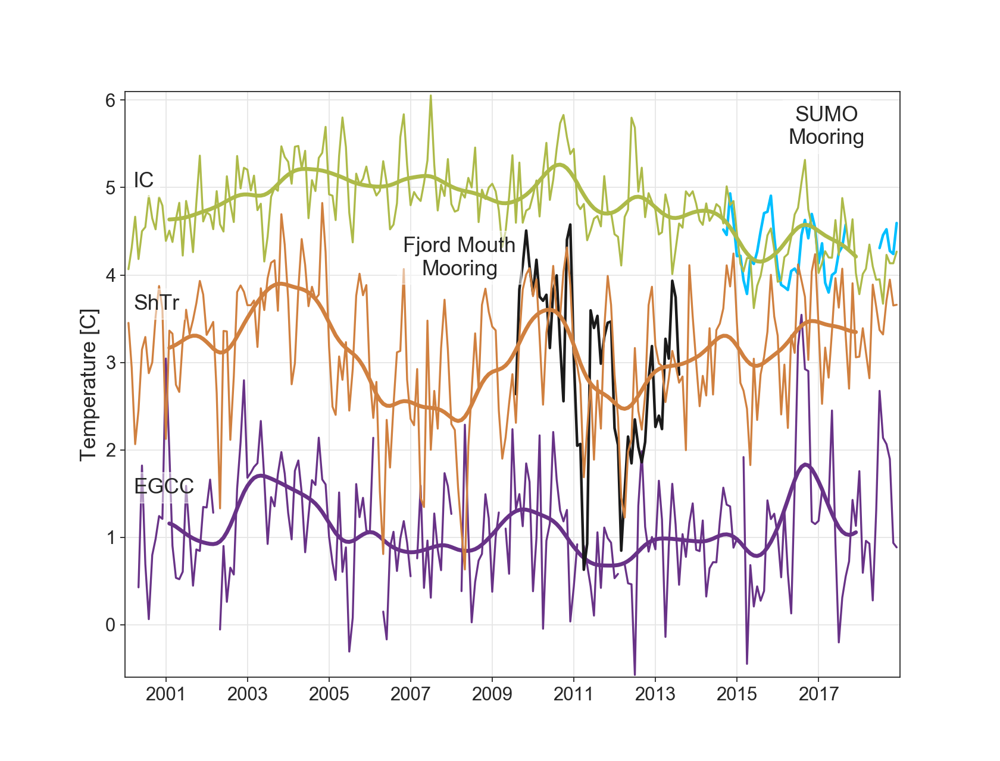

In [431]:
fig, ax = plt.subplots(nrows=1,ncols=1,sharex=False,figsize=(10.5, 8))

a3 = ax
a3.tick_params(labelsize=14)
a3.set_facecolor('white')
a3.grid(color='.9')

a3.plot(allM['2000-01-01':'2018-12-01'].index,allM['2000-01-01':'2018-12-01']['TempIC180m'],color='deepskyblue',linewidth=2,label='IC Mooring (180 m)')
a3.plot(allM.index,allM['allICMean_fulldetrend'],color='C1',linewidth=1.5,label='Detrended IC',zorder=2)
a3.plot(allM['2001-02-01':'2017-12-01'].index,smooth_IC[12:-12],color='C1',linewidth=3,label='_no legend_',zorder=2)
a3.plot(allM.index,allM['allEgcMean_fulldetrend'],color='C4',linewidth=1.5,label='Detrended EGCC',zorder=2)
a3.plot(allM['2001-02-01':'2017-12-01'].index,smooth_Egc[12:-12],color='C4',linewidth=3,label='_no legend_',zorder=2)
a3.plot(allM.index,allM['Tempshelf290m'],color='0.1',linewidth=2,label='Mooring (290 m)')
a3.plot(allM.index,allM['allShelfMean_fulldetrendwo'],color='C9',linewidth=1.5,label='Detrended shelf',zorder=2)
a3.plot(allM['2001-02-01':'2017-12-01'].index,smooth_detrendwo[12:-12],color='C9',linewidth=3,label='_no legend_',zorder=2)

a3.text('15-Mar-2000',5.0,'IC',fontsize=16,bbox=dict(facecolor='white', alpha=0.5))
a3.text('15-Mar-2000',3.6,'ShTr',fontsize=16,bbox=dict(facecolor='white', alpha=0.5))
a3.text('15-Mar-2000',1.5,'EGCC',fontsize=16,bbox=dict(facecolor='white', alpha=0.5))
a3.text('15-Mar-2008',4.0,'Fjord Mouth\nMooring',ha='center',fontsize=16,bbox=dict(facecolor='white', alpha=0.5))
a3.text('15-Mar-2017',5.5,'SUMO\nMooring',ha='center',fontsize=16,bbox=dict(facecolor='white', alpha=0.5))
a3.set_xlim('1-Jan-2000','31-Dec-2018')
a3.set_ylim(-0.6,6.1)
a3.set_ylabel('Temperature [C]',fontsize=16)
a3.set_yticks([0,1,2,3,4,5,6])

plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/Detrendedtimeseries.jpg', format='jpg', dpi=1000)

In [432]:
# Correlation for adjusted SSTs and mooring temps
forcorr = allM[['allShelfMean_fulldetrendwo','allICMean_fulldetrend']].dropna()
print ('IC',stats.pearsonr(stats.zscore(forcorr['allShelfMean_fulldetrendwo']),stats.zscore(forcorr['allICMean_fulldetrend'])))
forcorr = allM[['allShelfMean_fulldetrendwo','allEgcMean_fulldetrend']].dropna()
print ('EGCC',stats.pearsonr(stats.zscore(forcorr['allShelfMean_fulldetrendwo']),stats.zscore(forcorr['allEgcMean_fulldetrend'])))
print ('N = ' +str(forcorr.shape[0]))

('IC', (0.16444241126637274, 0.013108475330340567))
('EGCC', (0.3412530940940909, 2.9067881340806446e-07))
N = 215


In [433]:
forcorr = pd.concat([allM['allICMean_fulldetrend'],moorICM['TempIC180m']],axis=1).dropna()
print ('IC Moor (2-3d lag best)'+str(stats.pearsonr(stats.zscore(forcorr['allICMean_fulldetrend']),stats.zscore(forcorr['TempIC180m']))))

IC Moor (2-3d lag best)(0.3812551687805204, 0.01165352419264158)


In [434]:
print ('Original SST:')
print ('Shelf var ='),allM['allShelfMean'].var()
print ('IC var ='),allM['allICMean'].var()
print ('EGCC var ='),allM['allEgcMean'].var()
print (' ')
print ('Adjusted SST:')
print ('Shelf var ='),allM['allShelfMean_fulldetrendwo'].var()
print ('IC var ='),allM['allICMean_fulldetrend'].var()
print ('EGCC var ='),allM['allEgcMean_fulldetrend'].var()

Original SST:
Shelf var = 2.7454968238820006
IC var = 3.87014245059149
EGCC var = 1.4942866244142632
 
Adjusted SST:
Shelf var = 0.5633264588956776
IC var = 0.20338870551985613
EGCC var = 0.45459389659960053


In [435]:
print ('Original SST:')
print ('Shelf range ='),allM['allShelfMean'].max()-allM['allShelfMean'].min()
print ('IC range ='),allM['allICMean'].max()-allM['allICMean'].min()
print ('EGCC range ='),allM['allEgcMean'].max()-allM['allEgcMean'].min()
print (' ')
print ('Adjusted SST:')
print ('Shelf range ='),allM['allShelfMean_fulldetrendwo'].max()-allM['allShelfMean_fulldetrendwo'].min()
print ('IC range ='),allM['allICMean_fulldetrend'].max()-allM['allICMean_fulldetrend'].min()
print ('EGCC range ='),allM['allEgcMean_fulldetrend'].max()-allM['allEgcMean_fulldetrend'].min()

Original SST:
Shelf range = 8.079178175167723
IC range = 7.486727316821675
EGCC range = 7.2244085993076705
 
Adjusted SST:
Shelf range = 4.189993466221377
IC range = 2.431672600721548
EGCC range = 4.117886158419098


In [437]:
# # # Write files for ease of use later
# DataFileD = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/AllDataDaily2020'
# DataFileM = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/AllDataMonthly2020'
# DataFileA = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/AllDataAnnual2020'

# allD.to_pickle(DataFileD) 
# allM.to_pickle(DataFileM)
# allA.to_pickle(DataFileA)

# MDataDAFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataDA'
# MDataDTFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataDT'
# MDataDAnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataDAn'
# MDataDTnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataDTn'

# MDataDA.to_pickle(MDataDAFile) 
# MDataDT.to_pickle(MDataDTFile)
# MDataDAn.to_pickle(MDataDAnFile)
# MDataDTn.to_pickle(MDataDTnFile)

# MDataAFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataA'
# MDataTFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataT'
# MDataAnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAn'
# MDataTnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataTn'

# MDataA.to_pickle(MDataAFile) 
# MDataT.to_pickle(MDataTFile)
# MDataAn.to_pickle(MDataAnFile)
# MDataTn.to_pickle(MDataTnFile)

# MDataAnAFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAnA'
# MDataAnTFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAnT'
# MDataAnAnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAnAn'
# MDataAnTnFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/MDataAnTn'

# MDataAnA.to_pickle(MDataAnAFile) 
# MDataAnT.to_pickle(MDataAnTFile)
# MDataAnAn.to_pickle(MDataAnAnFile)
# MDataAnTn.to_pickle(MDataAnTnFile)

# forCoAuthor = allM[['allShelfMean_fulldetrendwo','allShelfMean_fulldetrendstdwo']]
# forCoAuthor.to_csv('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/ForCarolyn/SnowSST_deepwater20200619.csv')

# ---Trough anomaly transects---

# Produce adjusted SST for trough anomalies

In [438]:
resultT = sm.ols(formula="allShelfMean ~ ERA5AirTempS:C(Month)", data=allD).fit()
parametersT = np.where(resultT.pvalues>0.05,0,resultT.params)
print resultT.summary()

                            OLS Regression Results                            
Dep. Variable:           allShelfMean   R-squared:                       0.619
Model:                            OLS   Adj. R-squared:                  0.618
Method:                 Least Squares   F-statistic:                     618.2
Date:                Tue, 27 Oct 2020   Prob (F-statistic):               0.00
Time:                        10:05:51   Log-Likelihood:                -7214.6
No. Observations:                4587   AIC:                         1.446e+04
Df Residuals:                    4574   BIC:                         1.454e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [439]:
def detrend_sstT(row):
    if row['Month']==1:
        a1 = parametersT[1]
    elif row['Month']==2:
        a1 = parametersT[2]
    elif row['Month']==3:
        a1 = parametersT[3]
    elif row['Month']==4:
        a1 = parametersT[4]
    elif row['Month']==5:
        a1 = parametersT[5]
    elif row['Month']==6:
        a1 = parametersT[6]
    elif row['Month']==7:
        a1 = parametersT[7]
    elif row['Month']==8:
        a1 = parametersT[8]
    elif row['Month']==9:
        a1 = parametersT[9]
    elif row['Month']==10:
        a1 = parametersT[10]
    elif row['Month']==11:
        a1 = parametersT[11]
    elif row['Month']==12:
        a1 = parametersT[12]
    return row[0] - a1 * row[1]

In [440]:
# Boxes for transect of small boxes across shelf in trough
latbounds1 = [ 65.270 , 65.400 ] # Near mouth
lonbounds1 = [ -37.920 , -37.620 ] 
latbounds2 = [ 65.140 , 65.270 ] 
lonbounds2 = [ -37.888 , -37.588 ] 
latbounds3 = [ 65.010 , 65.140 ]
lonbounds3 = [ -37.846 , -37.546 ] 
latbounds4 = [ 64.880 , 65.010 ] 
lonbounds4 = [ -37.774 , -37.474 ] 
latbounds5 = [ 64.750 , 64.880 ] 
lonbounds5 = [ -37.804 , -37.504 ] 
latbounds6 = [ 64.680 , 64.810 ] 
lonbounds6 = [ -37.500 , -37.200 ] 
latbounds7 = [ 64.680 , 64.810 ] 
lonbounds7 = [ -37.200 , -36.900 ] 
latbounds8 = [ 64.710 , 64.840 ] 
lonbounds8 = [ -36.900 , -36.600 ] 
latbounds9 = [ 64.730 , 64.860 ] # [ 64.770 , 64.900 ]
lonbounds9 = [ -36.600 , -36.300 ] 
latbounds10 = [ 64.680 , 64.810 ] #[ 64.730 , 64.860 ] 
lonbounds10 = [ -36.300 , -36.000 ] 
latbounds11 = [ 64.650 , 64.780 ]  #[ 64.690 , 64.820 ] 
lonbounds11 = [ -36.000 , -35.700 ] 
latbounds12 = [ 64.630 , 64.760 ] 
lonbounds12 = [ -35.700 , -35.400 ] 
latbounds13 = [ 64.610 , 64.740 ] #Outer trough
lonbounds13 = [ -35.400 , -35.100 ] 

latboundsb = [ 62.4 , 66.7 ] # Serm Shelf only
lonboundsb = [ -41 , -32.5 ]

In [441]:
# Get lats and lons and spatial sampling box indices here - same for every image
bdir = '/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/Data/Helheim_Data/ERA5/'
ref = os.listdir(bdir)[1]
fhref = Dataset(bdir+ref, mode='r')  
lat_era = fhref.variables['latitude'][:]
if fhref.variables['longitude'][0] > 0:
    lon_era = fhref.variables['longitude'][:]-360
else:
    lon_era = fhref.variables['longitude'][:]
lat_indsb = np.where((lat_era > latboundsb[0]) & (lat_era < latboundsb[1]))
lon_indsb = np.where((lon_era > lonboundsb[0]) & (lon_era < lonboundsb[1]))

lat_inds1 = net_idx((latbounds1[0]+latbounds1[1])/2, lat_era)
lon_inds1 = net_idx((lonbounds1[0]+lonbounds1[1])/2, lon_era)
lat_inds2 = net_idx((latbounds2[0]+latbounds2[1])/2, lat_era)
lon_inds2 = net_idx((lonbounds2[0]+lonbounds2[1])/2, lon_era)
lat_inds3 = net_idx((latbounds3[0]+latbounds3[1])/2, lat_era)
lon_inds3 = net_idx((lonbounds3[0]+lonbounds3[1])/2, lon_era)
lat_inds4 = net_idx((latbounds4[0]+latbounds4[1])/2, lat_era)
lon_inds4 = net_idx((lonbounds4[0]+lonbounds4[1])/2, lon_era)
lat_inds5 = net_idx((latbounds5[0]+latbounds5[1])/2, lat_era)
lon_inds5 = net_idx((lonbounds5[0]+lonbounds5[1])/2, lon_era)
lat_inds6 = net_idx((latbounds6[0]+latbounds6[1])/2, lat_era)
lon_inds6 = net_idx((lonbounds6[0]+lonbounds6[1])/2, lon_era)
lat_inds7 = net_idx((latbounds7[0]+latbounds7[1])/2, lat_era)
lon_inds7 = net_idx((lonbounds7[0]+lonbounds7[1])/2, lon_era)
lat_inds8 = net_idx((latbounds8[0]+latbounds8[1])/2, lat_era)
lon_inds8 = net_idx((lonbounds8[0]+lonbounds8[1])/2, lon_era)
lat_inds9 = net_idx((latbounds9[0]+latbounds9[1])/2, lat_era)
lon_inds9 = net_idx((lonbounds9[0]+lonbounds9[1])/2, lon_era)
lat_inds10 = net_idx((latbounds10[0]+latbounds10[1])/2, lat_era)
lon_inds10 = net_idx((lonbounds10[0]+lonbounds10[1])/2, lon_era)
lat_inds11 = net_idx((latbounds11[0]+latbounds11[1])/2, lat_era)
lon_inds11 = net_idx((lonbounds11[0]+lonbounds11[1])/2, lon_era)
lat_inds12 = net_idx((latbounds12[0]+latbounds12[1])/2, lat_era)
lon_inds12 = net_idx((lonbounds12[0]+lonbounds12[1])/2, lon_era)
lat_inds13 = net_idx((latbounds13[0]+latbounds13[1])/2, lat_era)
lon_inds13 = net_idx((lonbounds13[0]+lonbounds13[1])/2, lon_era)

In [442]:
# ERA-5 air temperatures averaged for each transect box to make daily timeseries from 6-hourly 

yearStart = 1990
yearEnd = 2018
monthStart = 1
monthEnd = 12

try:
    del temp_array,temp1_array,tempS_array,tempE_array,windspd_array,windu_array,windv_array,time_array
except:
    print 'no old variable to delete'

for year in list(range(yearStart, yearEnd + 1)):
    for month in list(range(monthStart, monthEnd + 1)):
        file_era = bdir + "/era5_daily_%04d%02d.nc" % (year, month)
        era = Dataset(file_era, mode='r')
        time_era= era.variables['time']

        temp1 = era.variables['t2m'][:,lat_inds1,lon_inds1]
        temp2 = era.variables['t2m'][:,lat_inds2,lon_inds2]
        temp3 = era.variables['t2m'][:,lat_inds3,lon_inds3]
        temp4 = era.variables['t2m'][:,lat_inds4,lon_inds4]
        temp5 = era.variables['t2m'][:,lat_inds5,lon_inds5]
        temp6 = era.variables['t2m'][:,lat_inds6,lon_inds6]
        temp7 = era.variables['t2m'][:,lat_inds7,lon_inds7]
        temp8 = era.variables['t2m'][:,lat_inds8,lon_inds8]
        temp9 = era.variables['t2m'][:,lat_inds9,lon_inds9]
        temp10 = era.variables['t2m'][:,lat_inds10,lon_inds10]
        temp11 = era.variables['t2m'][:,lat_inds11,lon_inds11]
        temp12 = era.variables['t2m'][:,lat_inds12,lon_inds12]
        temp13 = era.variables['t2m'][:,lat_inds13,lon_inds13]
        
        time_eraconv = pd.to_datetime(netCDF4.num2date(time_era[:], time_era.units, time_era.calendar))

        
        try:
            temps1 = np.concatenate([temps1, temp1],axis=0)
            temps2 = np.concatenate([temps2, temp2],axis=0)
            temps3 = np.concatenate([temps3, temp3],axis=0)
            temps4 = np.concatenate([temps4, temp4],axis=0)
            temps5 = np.concatenate([temps5, temp5],axis=0)
            temps6 = np.concatenate([temps6, temp6],axis=0)
            temps7 = np.concatenate([temps7, temp7],axis=0)
            temps8 = np.concatenate([temps8, temp8],axis=0)
            temps9 = np.concatenate([temps9, temp9],axis=0)
            temps10 = np.concatenate([temps10, temp10],axis=0)
            temps11 = np.concatenate([temps11, temp11],axis=0)
            temps12 = np.concatenate([temps12, temp12],axis=0)
            temps13 = np.concatenate([temps13, temp13],axis=0)
            time_array = np.concatenate([time_array,time_eraconv],axis=0)
        except:
            temps1 = temp1
            temps2 = temp2
            temps3 = temp3
            temps4 = temp4
            temps5 = temp5
            temps6 = temp6
            temps7 = temp7
            temps8 = temp8
            temps9 = temp9
            temps10 = temp10
            temps11 = temp11
            temps12 = temp12
            temps13 = temp13
            time_array = time_eraconv
        era.close()

meantemp1 = temps1-273.15
meantemp2 = temps2-273.15
meantemp3 = temps3-273.15
meantemp4 = temps4-273.15
meantemp5 = temps5-273.15
meantemp6 = temps6-273.15
meantemp7 = temps7-273.15
meantemp8 = temps8-273.15
meantemp9 = temps9-273.15
meantemp10 = temps10-273.15
meantemp11 = temps11-273.15
meantemp12 = temps12-273.15
meantemp13 = temps13-273.15


eratemps = pd.concat([pd.DataFrame(time_array,columns=['Datetime']),pd.DataFrame(meantemp1,columns=['Temp1']),pd.DataFrame(meantemp2,columns=['Temp2']),pd.DataFrame(meantemp3,columns=['Temp3']),pd.DataFrame(meantemp4,columns=['Temp4']),pd.DataFrame(meantemp5,columns=['Temp5']),pd.DataFrame(meantemp6,columns=['Temp6']),pd.DataFrame(meantemp7,columns=['Temp7']),pd.DataFrame(meantemp8,columns=['Temp8']),pd.DataFrame(meantemp9,columns=['Temp9']),pd.DataFrame(meantemp10,columns=['Temp10']),pd.DataFrame(meantemp11,columns=['Temp11']),pd.DataFrame(meantemp12,columns=['Temp12']),pd.DataFrame(meantemp13,columns=['Temp13'])],axis=1)
eratemps = eratemps.set_index('Datetime')
eratemps = eratemps.resample("D").mean()

eratemps.head(5)

no old variable to delete


,Temp1,Temp2,Temp3,Temp4,Temp5,Temp6,Temp7,Temp8,Temp9,Temp10,Temp11,Temp12,Temp13
Datetime,,,,,,,,,,,,,
1990-01-01,0.278269,0.716684,0.716684,0.716684,0.716684,2.512209,2.996855,0.740570,0.991496,3.625841,3.625841,3.819750,3.819750
1990-01-02,-2.685593,0.550513,0.550513,0.550513,0.550513,1.926628,2.126188,0.717712,0.882599,2.429252,2.429252,2.537893,2.537893
1990-01-03,-1.909698,-0.546424,-0.546424,-0.546424,-0.546424,1.245505,1.678270,-0.516118,-0.269044,2.470089,2.470089,2.870749,2.870749
1990-01-04,-0.946315,0.828921,0.828921,0.828921,0.828921,2.663998,2.920318,1.102705,1.323839,3.225694,3.225694,3.411128,3.411128
1990-01-05,-1.252204,0.297018,0.297018,0.297018,0.297018,2.590030,2.795240,0.638093,0.934993,3.019199,3.019199,3.139397,3.139397


In [443]:
# MODIS shelf transects read in and corrected for diurnal bias
# _line.csv (straight line across shelf) and _trough.csv (line following N edge of trough)
col = ('Date','1 mean','1 anom','1 conc','1 count','2 mean','2 anom','2 conc','2 count','3 mean','3 anom','3 conc','3 count','4 mean','4 anom','4 conc','4 count','5 mean','5 anom','5 conc','5 count','6 mean','6 anom','6 conc','6 count','7 mean','7 anom','7 conc','7 count','8 mean','8 anom','8 conc','8 count','9 mean','9 anom','9 conc','9 count','10 mean','10 anom','10 conc','10 count','11 mean','11 anom','11 conc','11 count','12 mean','12 anom','12 conc','12 count','13 mean','13 anom','13 conc','13 count')
# Aqua
lineA = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/AquaMODISsst4km_trough.v2.20200123.csv', index_col=0, parse_dates=True, names = col, na_values='--')
# Aqua Night
lineAn = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/AquaNightMODISsst4km_trough.v2.20200123.csv', index_col=0, parse_dates=True, names = col, na_values='--')
# Terra
lineT = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/TerraMODISsst4km_trough.v2.20200123.csv', index_col=0, parse_dates=True, names = col, na_values='--')
# Terra Night
lineTn = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/TerraNightMODISsst4km_trough.v2.20200123.csv', index_col=0, parse_dates=True, names = col, na_values='--')
lineTn.head(2)

# Grab mean temperatures
cols = ('1','2','3','4','5','6','7','8','9','10','11','12','13')
line_meanA = lineA[['1 mean','2 mean','3 mean','4 mean','5 mean','6 mean','7 mean','8 mean','9 mean','10 mean','11 mean','12 mean','13 mean']]
line_meanA.columns = cols
line_meanA = line_meanA.join(allD['ShelfseasonDif'])
line_meanAn = lineAn[['1 mean','2 mean','3 mean','4 mean','5 mean','6 mean','7 mean','8 mean','9 mean','10 mean','11 mean','12 mean','13 mean']]
line_meanAn.columns = cols
line_meanT = lineT[['1 mean','2 mean','3 mean','4 mean','5 mean','6 mean','7 mean','8 mean','9 mean','10 mean','11 mean','12 mean','13 mean']]
line_meanT.columns = cols
line_meanT = line_meanT.join(allD['ShelfseasonDif'])
line_meanTn = lineTn[['1 mean','2 mean','3 mean','4 mean','5 mean','6 mean','7 mean','8 mean','9 mean','10 mean','11 mean','12 mean','13 mean']]
line_meanTn.columns = cols

# Correct for diurnal bias in daytime records
for col in line_meanA.columns[0:13]:
    line_meanA[col] = line_meanA[col]-line_meanA['ShelfseasonDif'] 
    line_meanT[col] = line_meanT[col]-line_meanT['ShelfseasonDif']  
del line_meanA['ShelfseasonDif'],line_meanT['ShelfseasonDif']

# Concatenate, average and detrend months 6-11 for air temperature 
all_mean = pd.concat((line_meanA,line_meanAn,line_meanT,line_meanTn))
line_mean_unc = all_mean.groupby(all_mean.index).mean()
line_mean_temp = pd.concat((line_mean_unc,eratemps),axis=1)
line_mean_temp['Month'] = line_mean_temp.index.month
line_mean_temp.tail(3)

,1,2,3,4,5,6,7,8,9,10,...,Temp5,Temp6,Temp7,Temp8,Temp9,Temp10,Temp11,Temp12,Temp13,Month
2018-12-29,0.977143,NaN,NaN,NaN,NaN,4.003264,NaN,NaN,NaN,NaN,...,-0.989436,0.586091,0.721081,-1.068139,-1.120039,0.751538,0.751538,0.742279,0.742279,12
2018-12-30,2.839130,2.814089,3.194962,2.885208,2.938125,3.500438,4.593302,4.850346,4.812024,5.352422,...,-2.286212,-0.981639,-0.862731,-2.550587,-2.642691,-0.706299,-0.706299,-0.435833,-0.435833,12
2018-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1.187290,-0.640266,-0.251136,-1.079835,-1.130761,0.307340,0.307340,0.517378,0.517378,12


In [444]:
# Apply air temperature detrending to all boxes individually and concatenate back in
sub = line_mean_temp[['1','Temp1','Month']]
line_mean_temp['21'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['2','Temp2','Month']]
line_mean_temp['22'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['3','Temp3','Month']]
line_mean_temp['23'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['4','Temp4','Month']]
line_mean_temp['24'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['5','Temp5','Month']]
line_mean_temp['25'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['6','Temp6','Month']]
line_mean_temp['26'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['7','Temp7','Month']]
line_mean_temp['27'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['8','Temp8','Month']]
line_mean_temp['28'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['9','Temp9','Month']]
line_mean_temp['29'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['10','Temp10','Month']]
line_mean_temp['30'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['11','Temp11','Month']]
line_mean_temp['31'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['12','Temp12','Month']]
line_mean_temp['32'] = sub.apply(detrend_sstT, axis=1)
sub = line_mean_temp[['13','Temp13','Month']]
line_mean_temp['33'] = sub.apply(detrend_sstT, axis=1)
line_mean_temp.tail(5)

,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,33
2018-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-12-29,0.977143,NaN,NaN,NaN,NaN,4.003264,NaN,NaN,NaN,NaN,...,NaN,NaN,4.003264,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-12-30,2.839130,2.814089,3.194962,2.885208,2.938125,3.500438,4.593302,4.850346,4.812024,5.352422,...,2.885208,2.938125,3.500438,4.593302,4.850346,4.812024,5.352422,5.548576,5.759524,6.042396
2018-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [445]:
# Make into the anomaly using a corrected IC
# Cut down to only new columns and rename
line_corr = line_mean_temp[['21','22','23','24','25','26','27','28','29','30','31','32','33']]
line_corr.columns = cols
line_corr = line_corr.join(allD['allICMean_fulldetrend'])

# Subtract IC to get the anomaly
for col in line_corr.columns[0:13]:
    line_corr[col] = line_corr[col]-line_corr['allICMean_fulldetrend']

del line_corr['allICMean_fulldetrend']
line_anom_unc = line_corr

line_anom_unc.tail(2)

,1,2,3,4,5,6,7,8,9,10,11,12,13
2018-12-30,-1.884257,-1.909298,-1.528425,-1.838179,-1.785262,-1.222949,-0.130085,0.126959,0.088636,0.629035,0.825189,1.036137,1.319008
2018-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [446]:
# AnomFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/DetrendedAnomTransect'
# line_anom_unc.to_pickle(AnomFile)

# Icemasked transects

In [447]:
# MODIS shelf transects WITH ICE MASKED
# _line.csv (straight line across shelf) and _trough.csv (line following N edge of trough)
col = ('Date','1 mean','1 anom','1 count','2 mean','2 anom','2 count','3 mean','3 anom','3 count','4 mean','4 anom','4 count','5 mean','5 anom','5 count','6 mean','6 anom','6 count','7 mean','7 anom','7 count','8 mean','8 anom','8 count','9 mean','9 anom','9 count','10 mean','10 anom','10 count','11 mean','11 anom','11 count','12 mean','12 anom','12 count','13 mean','13 anom','13 count')
# Aqua
lineIA = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/AquaMODISsst4km_trough20191223_icemask.csv', index_col=0, parse_dates=True, names = col)
# Aqua Night
lineIAn = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/AquaNightMODISsst4km_trough20191223_icemask.csv', index_col=0, parse_dates=True, names = col)
# Terra
lineIT = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/TerraMODISsst4km_trough20191223_icemask.csv', index_col=0, parse_dates=True, names = col)
# Terra Night
lineITn = pd.read_csv('/Volumes/Colossus/SST_Helheim_images/Results/TerraNightMODISsst4km_trough20191223_icemask.csv', index_col=0, parse_dates=True, names = col)
lineITn.head(2)

,1 mean,1 anom,1 count,2 mean,2 anom,2 count,3 mean,3 anom,3 count,4 mean,...,10 count,11 mean,11 anom,11 count,12 mean,12 anom,12 count,13 mean,13 anom,13 count
Date,,,,,,,,,,,,,,,,,,,,,
2000-02-24,3.14,-1.234099,1.0,3.59,-0.784099,2.0,NaN,NaN,0.0,NaN,...,0.0,NaN,NaN,0.0,4.06,-0.314099,2.0,5.045,0.670901,24.0
2000-02-25,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,...,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0


In [448]:
# Concatenate, average, and correct for diurnal bias WITH ICE MASKED
cols = ('1','2','3','4','5','6','7','8','9','10','11','12','13')
line_anomIA = lineIA[['1 anom','2 anom','3 anom','4 anom','5 anom','6 anom','7 anom','8 anom','9 anom','10 anom','11 anom','12 anom','13 anom']]
line_anomIA.columns = cols
line_anomIAn = lineIAn[['1 anom','2 anom','3 anom','4 anom','5 anom','6 anom','7 anom','8 anom','9 anom','10 anom','11 anom','12 anom','13 anom']]
line_anomIAn.columns = cols
line_anomIT = lineIT[['1 anom','2 anom','3 anom','4 anom','5 anom','6 anom','7 anom','8 anom','9 anom','10 anom','11 anom','12 anom','13 anom']]
line_anomIT.columns = cols
line_anomITn = lineITn[['1 anom','2 anom','3 anom','4 anom','5 anom','6 anom','7 anom','8 anom','9 anom','10 anom','11 anom','12 anom','13 anom']]
line_anomITn.columns = cols

# Concatenate, average and detrend months 6-11 for air temperature; These are diurnal bias corrected
all_anomI = pd.concat((line_anomIA,line_anomIAn,line_anomIT,line_anomITn))
line_anomI_unc = all_anomI.groupby(all_anomI.index).mean()

In [449]:
# Makes weekly means and anom without sea ice
idx = pd.date_range('01-01-2000', '12-31-2018')
line_mean = line_mean_unc.reindex(idx, fill_value=np.nan)
line_anom = line_anom_unc.reindex(idx, fill_value=np.nan)
line_meanwk = line_mean.resample("W-SAT").mean()
line_anomwk = line_anom.resample("W-SAT").mean()
line_anommo = line_anom.resample("MS").mean()

# Makes sea ice masked weekly means
line_anomI = line_anomI_unc.reindex(idx, fill_value=np.nan)
line_anomIwk = line_anomI.resample("W-SAT").mean()
line_anomImo = line_anomI.resample("MS").mean()

# Combine daily and weekly bias corrected with sea ice info
line_anomInt = line_anomI.where(line_anomI==-999.,line_anom) # to get daily but don't use
line_anomIntwk = line_anomIwk.where(line_anomIwk==-999.,line_anomwk)
line_anomIntMo = line_anomImo.where(line_anomImo==-999.,line_anommo)

line_anomIntwk.tail(2)

,1,2,3,4,5,6,7,8,9,10,11,12,13
2018-12-29,-1.861523,-1.002539,-1.020688,-1.635574,-3.829324,-1.775902,-3.240324,-0.012961,-2.054351,-1.086459,0.848624,1.232712,0.346099
2019-01-05,-1.884257,-1.909298,-1.528425,-1.838179,-1.785262,-1.222949,-0.130085,0.126959,0.088636,0.629035,0.825189,1.036137,1.319008


# Intrusion calculations

In [450]:
# Change anomaly to -1.8 from IC where sea ice exists
allW_trans = allD.resample('W-SAT').mean()
line_anomIntwkice = line_anomIntwk.join(allW_trans['allICMean_fulldetrend'])
line_anomIntwkice = line_anomIntwkice.where(line_anomIntwkice!=-999,-1.8-line_anomIntwkice['allICMean_fulldetrend'],axis=0)
del line_anomIntwkice['allICMean_fulldetrend']
line_anomclim = line_anomIntwkice.groupby([line_anomIntwkice.index.weekofyear]).mean()

# Change anomaly to -1.8 from IC where sea ice exists
allM_trans = allD.resample('MS').mean()
line_anomIntMoice = line_anomIntMo.join(allM_trans['allICMean_fulldetrend'])
line_anomIntMoice = line_anomIntMoice.where(line_anomIntMoice!=-999,-1.8-line_anomIntMoice['allICMean_fulldetrend'],axis=0)
del line_anomIntMoice['allICMean_fulldetrend']

In [451]:
# Determine extent of intrusion with sea ice adjusted to freezing temperatures

dataset = line_anomIntwkice

bcol = list(dataset) # list of 13 positions (1-13)
bif = []
temp = -1.5 # Dividing anomaly between EGCC and AW
pos = 5 # Position of what is considered not encroached

# For each date, find the first position where the anomaly is greater than temp (anomalt (-3 or -3.5) deemed to be not  
# EGCC since. EGCC is about -5C). This signifies the extent of the intrusion. 
for dt in dataset.index:
    m = 0
    for i in bcol:
        if dataset[i][dt]>=temp:
            m = int(i)
            break
    # Test that position found is robust (i.e. not due to missing measurements)
    # If a position for the intrusion is found, test if there are nans before the intrusion cutoff position (can also 
    # do int(i) for exact position). If the position (m/i) is a 1 or 2 then consider it a full observation (nan=1). If 
    # not, if all of the observations before pos (or that position) except '1' are greater than -1000 (nans will be 
    # excluded) then nans=1. Or if the slot before pos is nan, we can doubt our designation as "not encroached". Then 
    # anything with a position >pos is certainly encroachment by our def. Anything with nans=0 means there are cloud 
    # observations that preclude knowing where the actual furthest extent of the intrusion is
    nans = 0
    noobs = 0
    if m > 0: # when a temp greater than temp was found
        if int(i)<pos: # if it's before a certain position count it as a good observation
            nans = 1
        else: # currently this checks before pos, but could be before the int(i) to care about exact position
            if all(dataset[str(j+1)][dt] > -1000 for j in range(1,int(i))): # if all positions before temp are observed SST or sea ice
                nans = 1
            elif pd.isna(dataset[str(int(i)-1)][dt]) and pd.isna(dataset[str(int(i)-2)][dt]): # if the position or position before temp is cloud don't consider having a reliable measure of temp position
                noobs = 1
            else: # otherwise its a good observation
                nans = 1
    
    # For any that had no temp min achieved, if there is no measurement from the box before pos we can say clouds
    # preclude our ability to determine encroachment for that day
    elif all(dataset[str(j+1)][dt] > -1000 for j in range(1,13)): #if we have all measurements, but no temp, its a good observation
        nans = 1
    elif pd.isna(dataset['12'][dt]) and pd.isna(dataset['13'][dt]): # if we don't have good cold observations offshore we can't be sure of the position
        noobs = 1
    else: # otherwise we have a good measurement of temp not on the shelf and will call that 13
        nans = 1
        
    bif.append({'DateTime': dt, 'Bifurcation': m, 'nans': nans, 'noobserv': noobs})

bifurclimW = pd.DataFrame(bif)
bifurclimW = bifurclimW.set_index('DateTime')
nonansW = bifurclimW[bifurclimW['nans']==1.0]
nonansW = nonansW.where(nonansW.Bifurcation>0,13) # because nonans need to be greater than 0 and finding all cooler temps sets it at 13 if there were observations

bifurclimW.tail(5)

,Bifurcation,nans,noobserv
DateTime,,,
2018-12-08,3,1,0
2018-12-15,0,0,1
2018-12-22,2,1,0
2018-12-29,2,1,0
2019-01-05,6,1,0


In [452]:
# Determine extent of intrusion with sea ice adjusted to freezing temperatures

dataset = line_anomIntMoice

bcol = list(dataset) # list of 13 positions (1-13)
bif = []
temp = -1.5 # Dividing anomaly between EGCC and AW
pos = 5 # Position of what is considered not encroached

# For each date, find the first position where the anomaly is greater than temp (anomalt (-3 or -3.5) deemed to be not  
# EGCC since. EGCC is about -5C). This signifies the extent of the intrusion. 
for dt in dataset.index:
    m = 0
    for i in bcol:
        if dataset[i][dt]>=temp:
            m = int(i)
            break
    # Test that position found is robust (i.e. not due to missing measurements)
    # If a position for the intrusion is found, test if there are nans before the intrusion cutoff position (can also 
    # do int(i) for exact position). If the position (m/i) is a 1 or 2 then consider it a full observation (nan=1). If 
    # not, if all of the observations before pos (or that position) except '1' are greater than -1000 (nans will be 
    # excluded) then nans=1. Or if the slot before pos is nan, we can doubt our designation as "not encroached". Then 
    # anything with a position >pos is certainly encroachment by our def. Anything with nans=0 means there are cloud 
    # observations that preclude knowing where the actual furthest extent of the intrusion is
    nans = 0
    noobs = 0
    if m > 0: # when a temp greater than temp was found
        if int(i)<pos: # if it's before a certain position count it as a good observation
            nans = 1
        else: # currently this checks before pos, but could be before the int(i) to care about exact position
            if all(dataset[str(j+1)][dt] > -1000 for j in range(1,int(i))): # if all positions before temp are observed SST or sea ice
                nans = 1
            elif pd.isna(dataset[str(int(i)-1)][dt]) and pd.isna(dataset[str(int(i)-2)][dt]): # if the position or position before temp is cloud don't consider having a reliable measure of temp position
                noobs = 1
            else: # otherwise its a good observation
                nans = 1
    
    # For any that had no temp min achieved, if there is no measurement from the box before pos we can say clouds
    # preclude our ability to determine encroachment for that day
    elif all(dataset[str(j+1)][dt] > -1000 for j in range(1,13)): #if we have all measurements, but no temp, its a good observation
        nans = 1
    elif pd.isna(dataset['12'][dt]) and pd.isna(dataset['13'][dt]): # if we don't have good cold observations offshore we can't be sure of the position
        noobs = 1
    else: # otherwise we have a good measurement of temp not on the shelf and will call that 13
        nans = 1
        
    bif.append({'DateTime': dt, 'Bifurcation': m, 'nans': nans, 'noobserv': noobs})

bifurclimM = pd.DataFrame(bif)
bifurclimM = bifurclimM.set_index('DateTime')
nonansM = bifurclimM[bifurclimM['nans']==1.0]
nonansM = nonansM.where(nonansM.Bifurcation>0,13) # because nonans need to be greater than 0 and finding all cooler temps sets it at 13 if there were observations

bifurclimM.tail(5)

,Bifurcation,nans,noobserv
DateTime,,,
2018-08-01,1,1,0
2018-09-01,1,1,0
2018-10-01,1,1,0
2018-11-01,3,1,0
2018-12-01,2,1,0


In [453]:
# Smooth climatology for SSTadj and intrusion
seas = pd.concat([allW_trans[['Tempshelf290m','allShelfMean_fulldetrendwo','allICMean_fulldetrend','allEgcMean_fulldetrend']]],axis=1)
climseas = seas.groupby([seas.index.weekofyear]).mean()
climseas_std = seas.groupby([seas.index.weekofyear]).std()
climseas_err = seas.groupby([seas.index.weekofyear]).sem()
climseas = climseas.interpolate(method='spline', order=2, s=0.)

freq=0.05
# data1 = np.array(climseas['Tempshelf290m'])
# data1 = np.concatenate([data1[-50:],data1,data1[:50]])
# climseas['Tempshelf290m_filt'] = butterworth(data1,freq)[50:-50]
# scaler = preprocessing.StandardScaler()
# climseas['Tempshelf290m_filt_standz'] = scaler.fit_transform(climseas['Tempshelf290m_filt'])

data1 = np.array(climseas['allShelfMean_fulldetrendwo'])
data1 = np.concatenate([data1[-50:],data1,data1[:50]])
climseas['allShelfMean_fulldetrendwo_filt'] = butterworth(data1,freq)[50:-50]
scaler = preprocessing.StandardScaler()
climseas['allShelfMean_fulldetrendwo_filt_standz'] = scaler.fit_transform(climseas['allShelfMean_fulldetrendwo_filt'])
proxup = climseas['allShelfMean_fulldetrendwo'] + climseas_err['allShelfMean_fulldetrendwo']
proxdn = climseas['allShelfMean_fulldetrendwo'] - climseas_err['allShelfMean_fulldetrendwo']

# Bifurcation for sea ice adjusted anomaly
climbif = nonansW.groupby([nonansW.index.weekofyear]).mean()
climbif['BifStd'] = nonansW['Bifurcation'].groupby([nonansW.index.weekofyear]).std()
climbif['BifErr'] = nonansW['Bifurcation'].groupby([nonansW.index.weekofyear]).sem()
bifup = climbif['Bifurcation'] + climbif['BifErr']
bifdn = climbif['Bifurcation'] - climbif['BifErr']
bifup = bifup.where(bifup<13,13)
climbif['BifurcationInt'] = climbif['Bifurcation'].interpolate(method='spline', order=2, s=0.)
data1 = np.array(climbif['BifurcationInt'])
data1 = np.concatenate([data1[-50:],data1,data1[:50]])
climbif['Bifurcation_filt'] = butterworth(data1,freq)[50:-50]

frequency_cutoff: 0.05
frequency_cutoff_in_days: 20.0
frequency_cutoff: 0.05
frequency_cutoff_in_days: 20.0


/usr/local/lib/python2.7/site-packages/sklearn/preprocessing/data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/usr/local/lib/python2.7/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


In [454]:
print ('Seasonal Range:')
print ('ShTr: '+str(climseas['allShelfMean_fulldetrendwo'].max()-climseas['allShelfMean_fulldetrendwo'].min()))
print ('IC: '+str(climseas['allICMean_fulldetrend'].max()-climseas['allICMean_fulldetrend'].min()))
print ('Egc: '+str(climseas['allEgcMean_fulldetrend'].max()-climseas['allEgcMean_fulldetrend'].min()))

Seasonal Range:
ShTr: 2.1782758533579107
IC: 0.9728564703779483
Egc: 1.71958442104556


<IPython.core.display.Javascript object>


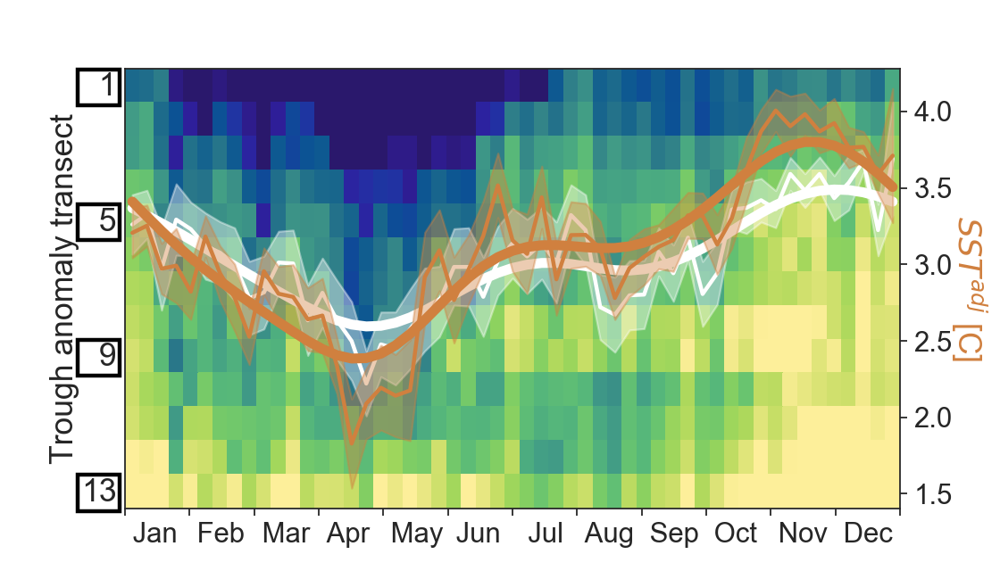

In [455]:
# Climatology trough anomaly transect
fig, ax = plt.subplots(figsize=(7, 4))
sns.set_style("white")

a1 = plt.subplot(111)
s1 = sns.heatmap(line_anomclim.T, cmap=cmocean.cm.haline,xticklabels=False,yticklabels=False,cbar=False,vmin=-4.0,vmax=-0.5)
sns.lineplot(data=climbif['Bifurcation'],color='w',linewidth=2, ax=a1)
sns.lineplot(data=climbif['Bifurcation_filt'],color='w',linewidth=5, ax=a1)
a1.fill_between(climbif.index-0.5, bifdn, bifup,color='w',alpha=.4,label='_no legend_')
a1.axes.get_xaxis().set_visible(False)
a1.set_ylabel('Trough anomaly transect',fontsize=16,labelpad=23)
a1.text(-1.8,0.8,'  1',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))
a1.text(-1.8,4.8,'  5',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))
a1.text(-1.8,8.8,'  9',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))
a1.text(-1.8,12.8,'13',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))

ax2 = a1.twinx()
ax2.tick_params(bottom='on',labelsize=14)
sns.lineplot(data=climseas['allShelfMean_fulldetrendwo'], color='C9',linewidth=2, ax=ax2)
sns.lineplot(data=climseas['allShelfMean_fulldetrendwo_filt'], color='C9',linewidth=5, ax=ax2)
ax2.fill_between(climseas_err.index-0.5, proxdn, proxup,color='C9',alpha=.4,label='_no legend_')
line = ax2.lines[0] # get the line
line.set_xdata(line.get_xdata() - 0.5)
line3 = ax2.lines[1] # get the line
line3.set_xdata(line3.get_xdata() - 0.5)
line1 = a1.lines[0] # get the line
line1.set_xdata(line1.get_xdata() - 0.5)
line2 = a1.lines[1] # get the line
line2.set_xdata(line2.get_xdata() - 0.5)
ax2.axes.get_xaxis().set_visible(True)
ax2.set_ylabel('$SST^{adj}$ [C]',color='C9',fontsize=16,rotation=270,labelpad=18)
ax2.set_yticks([1.5,2.0,2.5,3.0,3.5,4.0])
ax2.set_xticks(np.arange(0,54,53/12.0))
ax2.set_xticklabels([' Jan',' Feb',' Mar',' Apr',' May',' Jun','  Jul',' Aug',' Sep',' Oct',' Nov',' Dec'],ha='left')

s1.axvline(x=53, color='k',linewidth=3,zorder=0)
a1.axis('tight')
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/AnomClim_Int_Prox.jpg', format='jpg', dpi=1000)

In [456]:
stats.pearsonr(stats.zscore(climseas['allShelfMean_fulldetrendwo']),stats.zscore(climbif['Bifurcation']))

(-0.8579475890884849, 2.277540925908114e-16)

# Figure 5c

In [457]:
# For monthly plotting
line_anomIntMoice.loc['2000-02-01'] = np.nan # not a full month
iced = line_anomIntMoice.reset_index()

# Calculate monthss from 2000-01-01 so can use as index for intrusion and the proxy, calculates points for mid year and averages 4.3 weeks per month approx
prod = [allA['2000':'2018'].index[i]-pd.to_datetime(['01-01-2000']) for i in range(allA['2000':'2018'].index.shape[0])]
prod = pd.concat([pd.DataFrame(allA['2000':'2018'].index,columns=['Datetime']),pd.DataFrame((prod/np.timedelta64(1,'W')+52/2)/4.348,columns=['months'])],axis=1)
prod = prod.set_index('Datetime')
bifdet = nonansW['Bifurcation'].resample("AS").mean()
bifdeterr = nonansW['Bifurcation'].resample("AS").sem()
bifup = bifdet + bifdeterr
bifdn = bifdet - bifdeterr
det = allM['allShelfMean_fulldetrendwo'].resample("AS").mean()
deterr = allM['allShelfMean_fulldetrendwo'].resample("AS").sem()
detup = det + deterr
detdn = det - deterr
proxydet = pd.concat([det['2001':'2018'],bifdet['2001':'2018'],prod['2001':'2018']],axis=1)
# proxydet.drop(proxydet.head(1).index,inplace=True)
proxydet = proxydet.reset_index()
proxydet = proxydet.set_index(['months'])
del iced['index']

dischM = disch['2000':'2018'].resample('MS').mean()
disup = dischM['Discharge'] + dischM['Error']
disdn = dischM['Discharge'] - dischM['Error']

In [217]:
# TransFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/AnomTransectFinal20201026'
# line_anomIntMoice.to_pickle(TransFile)

<IPython.core.display.Javascript object>


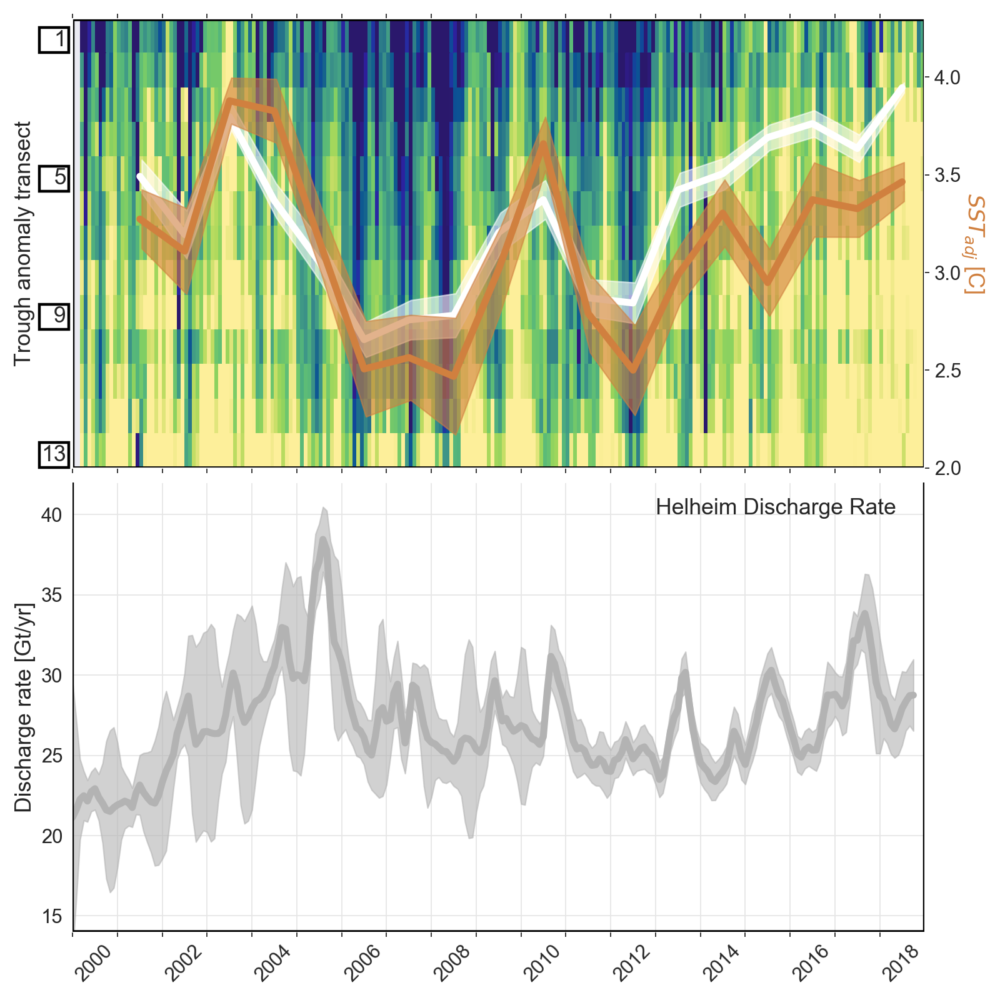

In [458]:
# Plot weekly 2000-2018 trough anomaly
fig, ax = plt.subplots(nrows=2,sharex=False,figsize=(10, 10))
sns.set_style("dark")

x_ticks = ['2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018']
x_labels = ['2000','','2002','','2004','','2006','','2008','','2010','','2012','','2014','','2016','','2018']

a1 = plt.subplot(211)
s1 = sns.heatmap(iced.T, cmap=cmocean.cm.haline,xticklabels=False,yticklabels=False,cbar=False,vmin=-4.0,vmax=-0.5)
a1.plot(proxydet['Bifurcation'], color='w',linewidth=5)
a1.fill_between(proxydet.index+0.5, bifdn['2001':'2018'], bifup['2001':'2018'],color='w',alpha=.6,label='_no legend_')
a1.axes.get_xaxis().set_visible(False)
a1.set_ylabel('Trough anomaly transect',fontsize=16,labelpad=27)
a1.text(-5,0.8,'  1',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))
a1.text(-5,4.8,'  5',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))
a1.text(-5,8.8,'  9',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))
a1.text(-5,12.8,'13',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))

ax2 = a1.twinx()
ax2.tick_params(bottom='on',top='on',labelsize=14)
ax2.plot(proxydet['allShelfMean_fulldetrendwo'], color='C9',linewidth=5)
ax2.fill_between(proxydet.index+0.5, detdn['2001':'2018'], detup['2001':'2018'],color='C9',alpha=.6,label='_no legend_')
ax2.axes.get_xaxis().set_visible(True)
ax2.set_ylabel('$SST_{adj}$ [C]',color='C9',fontsize=16,rotation=270,labelpad=17)
ax2.set_yticks([2.0,2.5,3.0,3.5,4.0])
ax2.set_ylim(2,4.3)
ax2.set_xticks(np.arange(0,12.0*19,12))
# ax2.set_xticklabels(x_labels,rotation=45,ha='left')

s1.axhline(y=0.0, color='k',linewidth=3,zorder=3)
s1.axhline(y=13, color='k',linewidth=3,zorder=3)
s1.axvline(x=0.2, color='k',linewidth=2,zorder=3)
s1.axvline(x=12*19, color='k',linewidth=2,zorder=3)
a1.axis('tight')

a2 = plt.subplot(212)
a2.grid(color='.9')
a2.set_facecolor('white')
a2.tick_params(bottom='on',labelsize=14)
a2.plot(dischM['Discharge'], color='0.7',linewidth=5)
a2.fill_between(dischM['Discharge'].index, disdn, disup,color='0.7',alpha=.6,label='_no legend_')
a2.text('2013-01-01',40,'Helheim Discharge Rate',fontsize=16)
a2.axes.get_xaxis().set_visible(True)
a2.set_ylabel('Discharge rate [Gt/yr]',fontsize=16)
# a2.set_yticks([2.0,2.5,3.0,3.5,4.0])
a2.set_ylim(14,42)
a2.set_xlim(['2000-01-01','2018-12-31'])
a2.axhline(y=14, color='k',linewidth=3,zorder=3)
# a2.axhline(y=42, color='k',linewidth=3,zorder=3)
a2.axvline(x='2000-01-01', color='k',linewidth=2,zorder=3)
a2.axvline(x='2018-12-31', color='k',linewidth=2,zorder=3)
a2.set_xticks(x_ticks)
a2.set_xticklabels(x_labels,rotation=45,ha='left')

plt.tight_layout(h_pad=0.01)
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/InterannaulTroughAnomMonthly.jpg', format='jpg', dpi=800)

In [395]:
# For weekly plotting
iced = line_anomIntwkice.reset_index()

# Calculate weeks from 2000-01-01 so can use as index for intrusion and the proxy
prod = [allA['2000':'2018'].index[i]-pd.to_datetime(['01-01-2000']) for i in range(allA['2000':'2018'].index.shape[0])]
prod = pd.concat([pd.DataFrame(allA['2000':'2018'].index,columns=['Datetime']),pd.DataFrame((prod/np.timedelta64(1,'W')+52/2),columns=['weeks'])],axis=1)
prod = prod.set_index('Datetime')
nonansM = nonansW.resample("MS").mean()
bifdet = nonansM['Bifurcation'].resample("AS").mean()
bifdeterr = nonansW['Bifurcation'].resample("AS").sem()
bifup = bifdet + bifdeterr
bifdn = bifdet - bifdeterr
det = allM['allShelfMean_fulldetrendwo'].resample("AS").mean()
deterr = allM['allShelfMean_fulldetrendwo'].resample("AS").sem()
detup = det + deterr
detdn = det - deterr
proxydet = pd.concat([det['2001':'2018'],bifdet['2001':'2018'],prod['2001':'2018']],axis=1)
# proxydet.drop(proxydet.head(1).index,inplace=True)
proxydet = proxydet.reset_index()
proxydet = proxydet.set_index(['weeks'])
del iced['index']

<IPython.core.display.Javascript object>


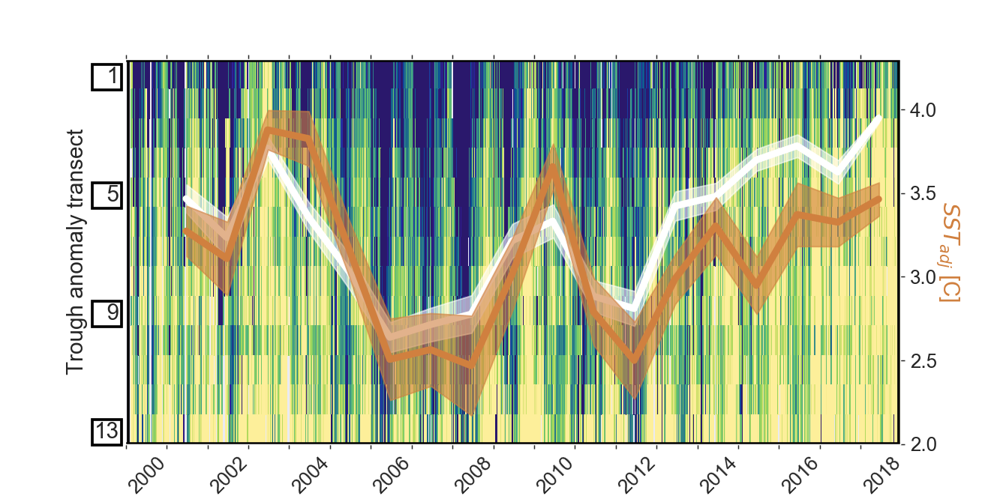

In [396]:
# Plot weekly 2000-2018 trough anomaly
fig, ax = plt.subplots(figsize=(10, 5))
sns.set_style("dark")

x_labels = ['2000','','2002','','2004','','2006','','2008','','2010','','2012','','2014','','2016','','2018']

a1 = plt.subplot(111)
s1 = sns.heatmap(iced.T, cmap=cmocean.cm.haline,xticklabels=False,yticklabels=False,cbar=False,vmin=-4.0,vmax=-0.5)
a1.plot(proxydet['Bifurcation'], color='w',linewidth=5)
a1.fill_between(proxydet.index+0.5, bifdn['2001':'2018'], bifup['2001':'2018'],color='w',alpha=.6,label='_no legend_')
a1.axes.get_xaxis().set_visible(False)
a1.set_ylabel('Trough anomaly transect',fontsize=16,labelpad=27)
a1.text(-23,0.8,'  1',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))
a1.text(-23,4.8,'  5',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))
a1.text(-23,8.8,'  9',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))
a1.text(-23,12.8,'13',fontsize=16,ha='center',bbox=dict(facecolor='white',edgecolor='k',lw=2,boxstyle='square,pad=0.1'))

ax2 = a1.twinx()
ax2.tick_params(bottom='on',top='on',labelsize=14)
ax2.plot(proxydet['allShelfMean_fulldetrendwo'], color='C9',linewidth=5)
ax2.fill_between(proxydet.index+0.5, detdn['2001':'2018'], detup['2001':'2018'],color='C9',alpha=.6,label='_no legend_')
ax2.axes.get_xaxis().set_visible(True)
ax2.set_ylabel('$SST_{adj}$ [C]',color='C9',fontsize=16,rotation=270,labelpad=17)
ax2.set_yticks([2.0,2.5,3.0,3.5,4.0])
ax2.set_ylim(2,4.3)
ax2.set_xticks(np.arange(1,53.0*19,52.3))
ax2.set_xticklabels(x_labels,rotation=45,ha='left')

s1.axhline(y=0.02, color='k',linewidth=3,zorder=3)
s1.axhline(y=13, color='k',linewidth=3,zorder=3)
s1.axvline(x=4, color='k',linewidth=2,zorder=3)
s1.axvline(x=52*19+3, color='k',linewidth=2,zorder=3)
a1.axis('tight')
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/InterannaulTroughAnom.jpg', format='jpg', dpi=800)

In [459]:
stats.pearsonr(stats.zscore(proxydet['Bifurcation']),stats.zscore(proxydet['allShelfMean_fulldetrendwo']))

(-0.7747569529494807, 0.0001597108306263768)

# Figure S5 - Trough anomaly distribution of pixels

In [460]:
# paramFile = '/Volumes/Colossus/SST_Helheim_images/Results/Variables/ShelfParams'
# parametersT = pickle.load(open(paramFile))

In [ ]:
# # Simple boundary boxes for IC, EGCC, and shelf
# latboundsI = [ 62.5 , 64.0 ]
# lonboundsI = [ -35.5 , -33.0 ]
# EGCm_coords = [[-33.9,66.5],[-33.4,66.1],[-36.0,65.1],[-36.5,65.5]] # for box diagonal to grid
# latboundsshelf = [ 64.5 , 65.00 ]
# lonboundsshelf = [ -38.0 , -36.0 ]

In [210]:
# For giving adjusted SSTs for EGCC, IC and Shelf
def detrend_sstEP(ssts,airt,month):
    if month==1:
        a1 = parametersE[1]
    elif month==2:
        a1 = parametersE[2]
    elif month==3:
        a1 = parametersE[3]
    elif month==4:
        a1 = parametersE[4]
    elif month==5:
        a1 = parametersE[5]
    elif month==6:
        a1 = parametersE[6]
    elif month==7:
        a1 = parametersE[7]
    elif month==8:
        a1 = parametersE[8]
    elif month==9:
        a1 = parametersE[9]
    elif month==10:
        a1 = parametersE[10]
    elif month==11:
        a1 = parametersE[11]
    elif month==12:
        a1 = parametersE[12]
    return ssts - a1 * airt

def detrend_sstIP(ssts,airt,month):
    if month==1:
        a1 = parametersIC[1]
    elif month==2:
        a1 = parametersIC[2]
    elif month==3:
        a1 = parametersIC[3]
    elif month==4:
        a1 = parametersIC[4]
    elif month==5:
        a1 = parametersIC[5]
    elif month==6:
        a1 = parametersIC[6]
    elif month==7:
        a1 = parametersIC[7]
    elif month==8:
        a1 = parametersIC[8]
    elif month==9:
        a1 = parametersIC[9]
    elif month==10:
        a1 = parametersIC[10]
    elif month==11:
        a1 = parametersIC[11]
    elif month==12:
        a1 = parametersIC[12]
    return ssts - a1 * airt

def detrend_sstSP(ssts,airt,month):
    if month==1:
        a1 = parametersS[1]
    elif month==2:
        a1 = parametersS[2]
    elif month==3:
        a1 = parametersS[3]
    elif month==4:
        a1 = parametersS[4]
    elif month==5:
        a1 = parametersS[5]
    elif month==6:
        a1 = parametersS[6]
    elif month==7:
        a1 = parametersS[7]
    elif month==8:
        a1 = parametersS[8]
    elif month==9:
        a1 = parametersS[9]
    elif month==10:
        a1 = parametersS[10]
    elif month==11:
        a1 = parametersS[11]
    elif month==12:
        a1 = parametersS[12]
    return ssts - a1 * airt

In [211]:
years = ['2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018'] 

# sat = 'Terra'
sat = 'Terra'
# prod = ''
prod = 'Night'

bdir = '/Volumes/Colossus/SST_Helheim_images/HelheimMODIS/GlobalSST'+sat+prod
icedir = '/Volumes/LaCieGrande/MODIS_SeaIce_Helheim/GlobalSeaIce'+sat+'/Aligned'

# Get list of sea ice files
os.chdir(icedir)
MOD29filelist = Snow.get_file_in_directory(icedir)
os.chdir(bdir)
print sat+prod

TerraNight


In [212]:
# Get lats and lons and spatial sampling box indices here because same for every image
ref = os.listdir(bdir)[1]
fhref = Dataset(ref, mode='r')  
lonsb = fhref.variables['lon'][:]
latsb = fhref.variables['lat'][:]
lat_indsb = np.where((latsb > latboundsb[0]) & (latsb < latboundsb[1]))
lon_indsb = np.where((lonsb > lonboundsb[0]) & (lonsb < lonboundsb[1]))
lats_sub = latsb[lat_indsb[0]] # subsetting lat lon so can sample later
lons_sub = lonsb[lon_indsb[0]] # subsetting lat lon so can sample later
lons,lats = np.meshgrid(lons_sub,lats_sub)
indsI = np.where((lats > latboundsI[0]) & (lats < latboundsI[1]) & (lons > lonboundsI[0]) & (lons < lonboundsI[1]))
inds2 = np.where((lats > latboundsshelf[0]) & (lats < latboundsshelf[1]) & (lons > lonboundsshelf[0]) & (lons < lonboundsshelf[1]))

# For diagonal EGCC box
EGCmask_coords = regionmask.Regions_cls('EGCmask',[0],['EGCC'],['E'],[EGCm_coords])
EGCCbox = EGCmask_coords.mask(lons_sub,lats_sub,xarray=False)

In [213]:
# Build daily mean and max time series, absolute and anomaly 
ICsstconcat = []
Shsstconcat = []
Egcsstconcat = []

for year in years:
    # To make monthly means for all years
    start = datetime(int(year),01,01)
    end = datetime(int(year),12,31)
    e = 0
    while start < end:
        print year
        months = calendar.monthrange(start.year,start.month)
        e += months[1]
        month = start.strftime("%B")
        first = e-months[1]+1
        last = e
        print month, first, last
        start += timedelta(days=months[1])
        
        if sat+prod=='Aqua':
            # For Aqua
            MODfilesb = [f for f in os.listdir(bdir) if (year in f[1:5]) & (first <= int(f[5:8])) & (last+1 >= int(f[5:8]))] # to bin across months
        else: 
            # For Terra, Tn, An
            MODfilesb = [f for f in os.listdir(bdir) if (year in f[1:5]) & (first < int(f[5:8])) & (last+1 >= int(f[5:8]))] # to bin across months
        
        for img in MODfilesb:
            fhb = Dataset(img, mode='r')              
            sstb = fhb.variables['sst'][lat_indsb[0],lon_indsb[0]]
            sstbqa = fhb.variables['qual_sst'][lat_indsb[0],lon_indsb[0]]
            sstb = np.where(sstb<-2,np.nan,sstb)
            sstb = np.where(sstb>30,np.nan,sstb)
            sstb = np.where(sstbqa>=2,np.nan,sstb) #keep only pixels that have best qa of 0 or 1
            
            icedate = img[1:8]
            try:
                MOD29file = [f for f in MOD29filelist if f[10:17]==icedate]
                icefile = icedir +'/'+ MOD29file[0]
                icemask = np.load(icefile)
                sstb = np.where(icemask==1,sstb,np.nan)
            except Exception as err: 
                print (err)
                print ("No MOD29 file match found for", img)
            
            temp = era5WindD.loc[fhb.time_coverage_start[0:10]]
            
            # Irminger samples
            sstshelfI = sstb[indsI[0],indsI[1]]
            sstshelfI = detrend_sstIP(sstshelfI,temp['ERA5AirTempI'],int(fhb.time_coverage_start[5:7]))
            meanICsst = np.nanmean(sstshelfI)
            sstshelfanomI = sstshelfI - meanICsst
            ICsst = sstshelfanomI[np.isfinite(sstshelfanomI)]
            ICsstconcat = np.concatenate([ICsstconcat,ICsst],axis=0)
            
            # EGCC sample
            sstshelfE = ma.masked_where(np.isnan(EGCCbox),sstb) # for box diagonal to grid
            sstshelfE = sstshelfE[sstshelfE.mask==False]
            sstshelfE = detrend_sstEP(sstshelfE,temp['ERA5AirTempE'],int(fhb.time_coverage_start[5:7]))
            sstshelfanomE = sstshelfE - meanICsst
            Egcsst = sstshelfanomE[np.isfinite(sstshelfanomE)]
            Egcsstconcat = np.concatenate([Egcsstconcat,Egcsst],axis=0)
            
            # Shelf sample
            sstshelf = sstb[inds2[0],inds2[1]]
            sstshelf = detrend_sstSP(sstshelf,temp['ERA5AirTempS'],int(fhb.time_coverage_start[5:7]))
            sstshelfanom = sstshelf - meanICsst
            Shsst = sstshelfanom[np.isfinite(sstshelfanom)]
            Shsstconcat = np.concatenate([Shsstconcat,Shsst],axis=0)
    
            print img, "completed"
            
            fhb.close()

2000
January 1 31
2000
February 32 60
T2000056.L3m_DAY_NSST_sst_4km.nc completed
T2000057.L3m_DAY_NSST_sst_4km.nc completed
T2000058.L3m_DAY_NSST_sst_4km.nc completed


/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:51: RuntimeWarning: Mean of empty slice


T2000059.L3m_DAY_NSST_sst_4km.nc completed
T2000060.L3m_DAY_NSST_sst_4km.nc completed
T2000061.L3m_DAY_NSST_sst_4km.nc completed
2000
March 61 91
T2000062.L3m_DAY_NSST_sst_4km.nc completed
T2000063.L3m_DAY_NSST_sst_4km.nc completed
T2000064.L3m_DAY_NSST_sst_4km.nc completed
T2000065.L3m_DAY_NSST_sst_4km.nc completed
T2000066.L3m_DAY_NSST_sst_4km.nc completed
T2000067.L3m_DAY_NSST_sst_4km.nc completed
T2000068.L3m_DAY_NSST_sst_4km.nc completed
T2000069.L3m_DAY_NSST_sst_4km.nc completed
T2000070.L3m_DAY_NSST_sst_4km.nc completed
T2000071.L3m_DAY_NSST_sst_4km.nc completed
T2000072.L3m_DAY_NSST_sst_4km.nc completed
T2000073.L3m_DAY_NSST_sst_4km.nc completed
T2000074.L3m_DAY_NSST_sst_4km.nc completed
T2000075.L3m_DAY_NSST_sst_4km.nc completed
T2000076.L3m_DAY_NSST_sst_4km.nc completed
T2000077.L3m_DAY_NSST_sst_4km.nc completed
T2000078.L3m_DAY_NSST_sst_4km.nc completed
T2000079.L3m_DAY_NSST_sst_4km.nc completed
T2000080.L3m_DAY_NSST_sst_4km.nc completed
T2000081.L3m_DAY_NSST_sst_4km.nc comp

T2000257.L3m_DAY_NSST_sst_4km.nc completed
T2000258.L3m_DAY_NSST_sst_4km.nc completed
T2000259.L3m_DAY_NSST_sst_4km.nc completed
T2000260.L3m_DAY_NSST_sst_4km.nc completed
T2000261.L3m_DAY_NSST_sst_4km.nc completed
T2000262.L3m_DAY_NSST_sst_4km.nc completed
T2000263.L3m_DAY_NSST_sst_4km.nc completed
T2000264.L3m_DAY_NSST_sst_4km.nc completed
T2000265.L3m_DAY_NSST_sst_4km.nc completed
T2000266.L3m_DAY_NSST_sst_4km.nc completed
T2000267.L3m_DAY_NSST_sst_4km.nc completed
T2000268.L3m_DAY_NSST_sst_4km.nc completed
T2000269.L3m_DAY_NSST_sst_4km.nc completed
T2000270.L3m_DAY_NSST_sst_4km.nc completed
T2000271.L3m_DAY_NSST_sst_4km.nc completed
T2000272.L3m_DAY_NSST_sst_4km.nc completed
T2000273.L3m_DAY_NSST_sst_4km.nc completed
T2000274.L3m_DAY_NSST_sst_4km.nc completed
T2000275.L3m_DAY_NSST_sst_4km.nc completed
2000
October 275 305
T2000276.L3m_DAY_NSST_sst_4km.nc completed
T2000277.L3m_DAY_NSST_sst_4km.nc completed
T2000278.L3m_DAY_NSST_sst_4km.nc completed
T2000279.L3m_DAY_NSST_sst_4km.nc 

T2001075.L3m_DAY_NSST_sst_4km.nc completed
T2001076.L3m_DAY_NSST_sst_4km.nc completed
T2001077.L3m_DAY_NSST_sst_4km.nc completed
T2001078.L3m_DAY_NSST_sst_4km.nc completed
T2001079.L3m_DAY_NSST_sst_4km.nc completed
T2001080.L3m_DAY_NSST_sst_4km.nc completed
T2001081.L3m_DAY_NSST_sst_4km.nc completed
T2001082.L3m_DAY_NSST_sst_4km.nc completed
T2001083.L3m_DAY_NSST_sst_4km.nc completed
T2001084.L3m_DAY_NSST_sst_4km.nc completed
T2001085.L3m_DAY_NSST_sst_4km.nc completed
T2001086.L3m_DAY_NSST_sst_4km.nc completed
T2001087.L3m_DAY_NSST_sst_4km.nc completed
T2001088.L3m_DAY_NSST_sst_4km.nc completed
T2001089.L3m_DAY_NSST_sst_4km.nc completed
T2001090.L3m_DAY_NSST_sst_4km.nc completed
T2001091.L3m_DAY_NSST_sst_4km.nc completed
2001
April 91 120
T2001092.L3m_DAY_NSST_sst_4km.nc completed
T2001093.L3m_DAY_NSST_sst_4km.nc completed
T2001094.L3m_DAY_NSST_sst_4km.nc completed
T2001095.L3m_DAY_NSST_sst_4km.nc completed
T2001096.L3m_DAY_NSST_sst_4km.nc completed
T2001097.L3m_DAY_NSST_sst_4km.nc com

T2001281.L3m_DAY_NSST_sst_4km.nc completed
T2001282.L3m_DAY_NSST_sst_4km.nc completed
T2001283.L3m_DAY_NSST_sst_4km.nc completed
T2001284.L3m_DAY_NSST_sst_4km.nc completed
T2001285.L3m_DAY_NSST_sst_4km.nc completed
T2001286.L3m_DAY_NSST_sst_4km.nc completed
T2001287.L3m_DAY_NSST_sst_4km.nc completed
T2001288.L3m_DAY_NSST_sst_4km.nc completed
T2001289.L3m_DAY_NSST_sst_4km.nc completed
T2001290.L3m_DAY_NSST_sst_4km.nc completed
T2001291.L3m_DAY_NSST_sst_4km.nc completed
T2001292.L3m_DAY_NSST_sst_4km.nc completed
T2001293.L3m_DAY_NSST_sst_4km.nc completed
T2001294.L3m_DAY_NSST_sst_4km.nc completed
T2001295.L3m_DAY_NSST_sst_4km.nc completed
T2001296.L3m_DAY_NSST_sst_4km.nc completed
T2001297.L3m_DAY_NSST_sst_4km.nc completed
T2001298.L3m_DAY_NSST_sst_4km.nc completed
T2001299.L3m_DAY_NSST_sst_4km.nc completed
T2001300.L3m_DAY_NSST_sst_4km.nc completed
T2001301.L3m_DAY_NSST_sst_4km.nc completed
T2001302.L3m_DAY_NSST_sst_4km.nc completed
T2001303.L3m_DAY_NSST_sst_4km.nc completed
T2001304.L3

T2002107.L3m_DAY_NSST_sst_4km.nc completed
T2002108.L3m_DAY_NSST_sst_4km.nc completed
T2002109.L3m_DAY_NSST_sst_4km.nc completed
T2002110.L3m_DAY_NSST_sst_4km.nc completed
T2002111.L3m_DAY_NSST_sst_4km.nc completed
T2002112.L3m_DAY_NSST_sst_4km.nc completed
T2002113.L3m_DAY_NSST_sst_4km.nc completed
T2002114.L3m_DAY_NSST_sst_4km.nc completed
T2002115.L3m_DAY_NSST_sst_4km.nc completed
T2002116.L3m_DAY_NSST_sst_4km.nc completed
T2002117.L3m_DAY_NSST_sst_4km.nc completed
T2002118.L3m_DAY_NSST_sst_4km.nc completed
T2002119.L3m_DAY_NSST_sst_4km.nc completed
T2002120.L3m_DAY_NSST_sst_4km.nc completed
T2002121.L3m_DAY_NSST_sst_4km.nc completed
2002
May 121 151
T2002122.L3m_DAY_NSST_sst_4km.nc completed
T2002123.L3m_DAY_NSST_sst_4km.nc completed
T2002124.L3m_DAY_NSST_sst_4km.nc completed
T2002125.L3m_DAY_NSST_sst_4km.nc completed
T2002126.L3m_DAY_NSST_sst_4km.nc completed
T2002127.L3m_DAY_NSST_sst_4km.nc completed
T2002128.L3m_DAY_NSST_sst_4km.nc completed
T2002129.L3m_DAY_NSST_sst_4km.nc comp

T2002299.L3m_DAY_NSST_sst_4km.nc completed
T2002300.L3m_DAY_NSST_sst_4km.nc completed
T2002301.L3m_DAY_NSST_sst_4km.nc completed
T2002302.L3m_DAY_NSST_sst_4km.nc completed
T2002303.L3m_DAY_NSST_sst_4km.nc completed
T2002304.L3m_DAY_NSST_sst_4km.nc completed
T2002305.L3m_DAY_NSST_sst_4km.nc completed
2002
November 305 334
T2002306.L3m_DAY_NSST_sst_4km.nc completed
T2002307.L3m_DAY_NSST_sst_4km.nc completed
T2002308.L3m_DAY_NSST_sst_4km.nc completed
T2002309.L3m_DAY_NSST_sst_4km.nc completed
T2002310.L3m_DAY_NSST_sst_4km.nc completed
T2002311.L3m_DAY_NSST_sst_4km.nc completed
T2002312.L3m_DAY_NSST_sst_4km.nc completed
T2002313.L3m_DAY_NSST_sst_4km.nc completed
T2002314.L3m_DAY_NSST_sst_4km.nc completed
T2002315.L3m_DAY_NSST_sst_4km.nc completed
T2002316.L3m_DAY_NSST_sst_4km.nc completed
T2002317.L3m_DAY_NSST_sst_4km.nc completed
T2002318.L3m_DAY_NSST_sst_4km.nc completed
T2002319.L3m_DAY_NSST_sst_4km.nc completed
T2002320.L3m_DAY_NSST_sst_4km.nc completed
T2002321.L3m_DAY_NSST_sst_4km.nc

T2003124.L3m_DAY_NSST_sst_4km.nc completed
T2003125.L3m_DAY_NSST_sst_4km.nc completed
T2003126.L3m_DAY_NSST_sst_4km.nc completed
T2003127.L3m_DAY_NSST_sst_4km.nc completed
T2003128.L3m_DAY_NSST_sst_4km.nc completed
T2003129.L3m_DAY_NSST_sst_4km.nc completed
T2003130.L3m_DAY_NSST_sst_4km.nc completed
T2003131.L3m_DAY_NSST_sst_4km.nc completed
T2003132.L3m_DAY_NSST_sst_4km.nc completed
T2003133.L3m_DAY_NSST_sst_4km.nc completed
T2003134.L3m_DAY_NSST_sst_4km.nc completed
T2003135.L3m_DAY_NSST_sst_4km.nc completed
T2003136.L3m_DAY_NSST_sst_4km.nc completed
T2003137.L3m_DAY_NSST_sst_4km.nc completed
T2003138.L3m_DAY_NSST_sst_4km.nc completed
T2003139.L3m_DAY_NSST_sst_4km.nc completed
T2003140.L3m_DAY_NSST_sst_4km.nc completed
T2003141.L3m_DAY_NSST_sst_4km.nc completed
T2003142.L3m_DAY_NSST_sst_4km.nc completed
T2003143.L3m_DAY_NSST_sst_4km.nc completed
T2003144.L3m_DAY_NSST_sst_4km.nc completed
T2003145.L3m_DAY_NSST_sst_4km.nc completed
T2003146.L3m_DAY_NSST_sst_4km.nc completed
T2003147.L3

T2003316.L3m_DAY_NSST_sst_4km.nc completed
T2003317.L3m_DAY_NSST_sst_4km.nc completed
T2003318.L3m_DAY_NSST_sst_4km.nc completed
T2003319.L3m_DAY_NSST_sst_4km.nc completed
T2003320.L3m_DAY_NSST_sst_4km.nc completed
T2003321.L3m_DAY_NSST_sst_4km.nc completed
T2003322.L3m_DAY_NSST_sst_4km.nc completed
T2003323.L3m_DAY_NSST_sst_4km.nc completed
T2003324.L3m_DAY_NSST_sst_4km.nc completed
T2003325.L3m_DAY_NSST_sst_4km.nc completed
T2003326.L3m_DAY_NSST_sst_4km.nc completed
T2003327.L3m_DAY_NSST_sst_4km.nc completed
T2003328.L3m_DAY_NSST_sst_4km.nc completed
T2003329.L3m_DAY_NSST_sst_4km.nc completed
T2003330.L3m_DAY_NSST_sst_4km.nc completed
T2003331.L3m_DAY_NSST_sst_4km.nc completed
T2003332.L3m_DAY_NSST_sst_4km.nc completed
T2003333.L3m_DAY_NSST_sst_4km.nc completed
T2003334.L3m_DAY_NSST_sst_4km.nc completed
T2003335.L3m_DAY_NSST_sst_4km.nc completed
2003
December 335 365
T2003336.L3m_DAY_NSST_sst_4km.nc completed
T2003337.L3m_DAY_NSST_sst_4km.nc completed
T2003338.L3m_DAY_NSST_sst_4km.nc

T2004147.L3m_DAY_NSST_sst_4km.nc completed
T2004148.L3m_DAY_NSST_sst_4km.nc completed
T2004149.L3m_DAY_NSST_sst_4km.nc completed
T2004150.L3m_DAY_NSST_sst_4km.nc completed
T2004151.L3m_DAY_NSST_sst_4km.nc completed
T2004152.L3m_DAY_NSST_sst_4km.nc completed
T2004153.L3m_DAY_NSST_sst_4km.nc completed
2004
June 153 182
T2004154.L3m_DAY_NSST_sst_4km.nc completed
T2004155.L3m_DAY_NSST_sst_4km.nc completed
T2004156.L3m_DAY_NSST_sst_4km.nc completed
T2004157.L3m_DAY_NSST_sst_4km.nc completed
T2004158.L3m_DAY_NSST_sst_4km.nc completed
T2004159.L3m_DAY_NSST_sst_4km.nc completed
T2004160.L3m_DAY_NSST_sst_4km.nc completed
T2004161.L3m_DAY_NSST_sst_4km.nc completed
T2004162.L3m_DAY_NSST_sst_4km.nc completed
T2004163.L3m_DAY_NSST_sst_4km.nc completed
T2004164.L3m_DAY_NSST_sst_4km.nc completed
T2004165.L3m_DAY_NSST_sst_4km.nc completed
T2004166.L3m_DAY_NSST_sst_4km.nc completed
T2004167.L3m_DAY_NSST_sst_4km.nc completed
T2004168.L3m_DAY_NSST_sst_4km.nc completed
T2004169.L3m_DAY_NSST_sst_4km.nc com

T2004336.L3m_DAY_NSST_sst_4km.nc completed
2004
December 336 366
T2004337.L3m_DAY_NSST_sst_4km.nc completed
T2004338.L3m_DAY_NSST_sst_4km.nc completed
T2004339.L3m_DAY_NSST_sst_4km.nc completed
T2004340.L3m_DAY_NSST_sst_4km.nc completed
T2004341.L3m_DAY_NSST_sst_4km.nc completed
T2004342.L3m_DAY_NSST_sst_4km.nc completed
T2004343.L3m_DAY_NSST_sst_4km.nc completed
T2004344.L3m_DAY_NSST_sst_4km.nc completed
T2004345.L3m_DAY_NSST_sst_4km.nc completed
T2004346.L3m_DAY_NSST_sst_4km.nc completed
T2004347.L3m_DAY_NSST_sst_4km.nc completed
T2004348.L3m_DAY_NSST_sst_4km.nc completed
T2004349.L3m_DAY_NSST_sst_4km.nc completed
T2004350.L3m_DAY_NSST_sst_4km.nc completed
T2004351.L3m_DAY_NSST_sst_4km.nc completed
T2004352.L3m_DAY_NSST_sst_4km.nc completed
T2004353.L3m_DAY_NSST_sst_4km.nc completed
T2004354.L3m_DAY_NSST_sst_4km.nc completed
T2004355.L3m_DAY_NSST_sst_4km.nc completed
T2004356.L3m_DAY_NSST_sst_4km.nc completed
T2004357.L3m_DAY_NSST_sst_4km.nc completed
T2004358.L3m_DAY_NSST_sst_4km.nc

T2005162.L3m_DAY_NSST_sst_4km.nc completed
T2005163.L3m_DAY_NSST_sst_4km.nc completed
T2005164.L3m_DAY_NSST_sst_4km.nc completed
T2005165.L3m_DAY_NSST_sst_4km.nc completed
T2005166.L3m_DAY_NSST_sst_4km.nc completed
T2005167.L3m_DAY_NSST_sst_4km.nc completed
T2005168.L3m_DAY_NSST_sst_4km.nc completed
T2005169.L3m_DAY_NSST_sst_4km.nc completed
T2005170.L3m_DAY_NSST_sst_4km.nc completed
T2005171.L3m_DAY_NSST_sst_4km.nc completed
T2005172.L3m_DAY_NSST_sst_4km.nc completed
T2005173.L3m_DAY_NSST_sst_4km.nc completed
T2005174.L3m_DAY_NSST_sst_4km.nc completed
T2005175.L3m_DAY_NSST_sst_4km.nc completed
T2005176.L3m_DAY_NSST_sst_4km.nc completed
T2005177.L3m_DAY_NSST_sst_4km.nc completed
T2005178.L3m_DAY_NSST_sst_4km.nc completed
T2005179.L3m_DAY_NSST_sst_4km.nc completed
T2005180.L3m_DAY_NSST_sst_4km.nc completed
T2005181.L3m_DAY_NSST_sst_4km.nc completed
T2005182.L3m_DAY_NSST_sst_4km.nc completed
2005
July 182 212
T2005183.L3m_DAY_NSST_sst_4km.nc completed
T2005184.L3m_DAY_NSST_sst_4km.nc com

T2005353.L3m_DAY_NSST_sst_4km.nc completed
T2005354.L3m_DAY_NSST_sst_4km.nc completed
T2005355.L3m_DAY_NSST_sst_4km.nc completed
T2005356.L3m_DAY_NSST_sst_4km.nc completed
T2005357.L3m_DAY_NSST_sst_4km.nc completed
T2005358.L3m_DAY_NSST_sst_4km.nc completed
T2005359.L3m_DAY_NSST_sst_4km.nc completed
T2005360.L3m_DAY_NSST_sst_4km.nc completed
T2005361.L3m_DAY_NSST_sst_4km.nc completed
T2005362.L3m_DAY_NSST_sst_4km.nc completed
T2005363.L3m_DAY_NSST_sst_4km.nc completed
T2005364.L3m_DAY_NSST_sst_4km.nc completed
T2005365.L3m_DAY_NSST_sst_4km.nc completed
2006
January 1 31
T2006002.L3m_DAY_NSST_sst_4km.nc completed
T2006003.L3m_DAY_NSST_sst_4km.nc completed
T2006004.L3m_DAY_NSST_sst_4km.nc completed
T2006005.L3m_DAY_NSST_sst_4km.nc completed
T2006006.L3m_DAY_NSST_sst_4km.nc completed
T2006007.L3m_DAY_NSST_sst_4km.nc completed
T2006008.L3m_DAY_NSST_sst_4km.nc completed
T2006009.L3m_DAY_NSST_sst_4km.nc completed
T2006010.L3m_DAY_NSST_sst_4km.nc completed
T2006011.L3m_DAY_NSST_sst_4km.nc com

T2006178.L3m_DAY_NSST_sst_4km.nc completed
T2006179.L3m_DAY_NSST_sst_4km.nc completed
T2006180.L3m_DAY_NSST_sst_4km.nc completed
T2006181.L3m_DAY_NSST_sst_4km.nc completed
T2006182.L3m_DAY_NSST_sst_4km.nc completed
2006
July 182 212
T2006183.L3m_DAY_NSST_sst_4km.nc completed
T2006184.L3m_DAY_NSST_sst_4km.nc completed
T2006185.L3m_DAY_NSST_sst_4km.nc completed
T2006186.L3m_DAY_NSST_sst_4km.nc completed
T2006187.L3m_DAY_NSST_sst_4km.nc completed
T2006188.L3m_DAY_NSST_sst_4km.nc completed
T2006189.L3m_DAY_NSST_sst_4km.nc completed
T2006190.L3m_DAY_NSST_sst_4km.nc completed
T2006191.L3m_DAY_NSST_sst_4km.nc completed
T2006192.L3m_DAY_NSST_sst_4km.nc completed
T2006193.L3m_DAY_NSST_sst_4km.nc completed
T2006194.L3m_DAY_NSST_sst_4km.nc completed
T2006195.L3m_DAY_NSST_sst_4km.nc completed
T2006196.L3m_DAY_NSST_sst_4km.nc completed
T2006197.L3m_DAY_NSST_sst_4km.nc completed
T2006198.L3m_DAY_NSST_sst_4km.nc completed
T2006199.L3m_DAY_NSST_sst_4km.nc completed
T2006200.L3m_DAY_NSST_sst_4km.nc com

T2007002.L3m_DAY_NSST_sst_4km.nc completed
T2007003.L3m_DAY_NSST_sst_4km.nc completed
T2007004.L3m_DAY_NSST_sst_4km.nc completed
T2007005.L3m_DAY_NSST_sst_4km.nc completed
T2007006.L3m_DAY_NSST_sst_4km.nc completed
T2007007.L3m_DAY_NSST_sst_4km.nc completed
T2007008.L3m_DAY_NSST_sst_4km.nc completed
T2007009.L3m_DAY_NSST_sst_4km.nc completed
T2007010.L3m_DAY_NSST_sst_4km.nc completed
T2007011.L3m_DAY_NSST_sst_4km.nc completed
T2007012.L3m_DAY_NSST_sst_4km.nc completed
T2007013.L3m_DAY_NSST_sst_4km.nc completed
T2007014.L3m_DAY_NSST_sst_4km.nc completed
T2007015.L3m_DAY_NSST_sst_4km.nc completed
T2007016.L3m_DAY_NSST_sst_4km.nc completed
T2007017.L3m_DAY_NSST_sst_4km.nc completed
T2007018.L3m_DAY_NSST_sst_4km.nc completed
T2007019.L3m_DAY_NSST_sst_4km.nc completed
T2007020.L3m_DAY_NSST_sst_4km.nc completed
T2007021.L3m_DAY_NSST_sst_4km.nc completed
T2007022.L3m_DAY_NSST_sst_4km.nc completed
T2007023.L3m_DAY_NSST_sst_4km.nc completed
T2007024.L3m_DAY_NSST_sst_4km.nc completed
T2007025.L3

T2007192.L3m_DAY_NSST_sst_4km.nc completed
T2007193.L3m_DAY_NSST_sst_4km.nc completed
T2007194.L3m_DAY_NSST_sst_4km.nc completed
T2007195.L3m_DAY_NSST_sst_4km.nc completed
T2007196.L3m_DAY_NSST_sst_4km.nc completed
T2007197.L3m_DAY_NSST_sst_4km.nc completed
T2007198.L3m_DAY_NSST_sst_4km.nc completed
T2007199.L3m_DAY_NSST_sst_4km.nc completed
T2007200.L3m_DAY_NSST_sst_4km.nc completed
T2007201.L3m_DAY_NSST_sst_4km.nc completed
T2007202.L3m_DAY_NSST_sst_4km.nc completed
T2007203.L3m_DAY_NSST_sst_4km.nc completed
T2007204.L3m_DAY_NSST_sst_4km.nc completed
T2007205.L3m_DAY_NSST_sst_4km.nc completed
T2007206.L3m_DAY_NSST_sst_4km.nc completed
T2007207.L3m_DAY_NSST_sst_4km.nc completed
T2007208.L3m_DAY_NSST_sst_4km.nc completed
T2007209.L3m_DAY_NSST_sst_4km.nc completed
T2007210.L3m_DAY_NSST_sst_4km.nc completed
T2007211.L3m_DAY_NSST_sst_4km.nc completed
T2007212.L3m_DAY_NSST_sst_4km.nc completed
T2007213.L3m_DAY_NSST_sst_4km.nc completed
2007
August 213 243
T2007214.L3m_DAY_NSST_sst_4km.nc c

T2008018.L3m_DAY_NSST_sst_4km.nc completed
T2008019.L3m_DAY_NSST_sst_4km.nc completed
T2008020.L3m_DAY_NSST_sst_4km.nc completed
T2008021.L3m_DAY_NSST_sst_4km.nc completed
T2008022.L3m_DAY_NSST_sst_4km.nc completed
T2008023.L3m_DAY_NSST_sst_4km.nc completed
T2008024.L3m_DAY_NSST_sst_4km.nc completed
T2008025.L3m_DAY_NSST_sst_4km.nc completed
T2008026.L3m_DAY_NSST_sst_4km.nc completed
T2008027.L3m_DAY_NSST_sst_4km.nc completed
T2008028.L3m_DAY_NSST_sst_4km.nc completed
T2008029.L3m_DAY_NSST_sst_4km.nc completed
T2008030.L3m_DAY_NSST_sst_4km.nc completed
T2008031.L3m_DAY_NSST_sst_4km.nc completed
T2008032.L3m_DAY_NSST_sst_4km.nc completed
2008
February 32 60
T2008033.L3m_DAY_NSST_sst_4km.nc completed
T2008034.L3m_DAY_NSST_sst_4km.nc completed
T2008035.L3m_DAY_NSST_sst_4km.nc completed
T2008036.L3m_DAY_NSST_sst_4km.nc completed
T2008037.L3m_DAY_NSST_sst_4km.nc completed
T2008038.L3m_DAY_NSST_sst_4km.nc completed
T2008039.L3m_DAY_NSST_sst_4km.nc completed
T2008040.L3m_DAY_NSST_sst_4km.nc c

T2008211.L3m_DAY_NSST_sst_4km.nc completed
T2008212.L3m_DAY_NSST_sst_4km.nc completed
T2008213.L3m_DAY_NSST_sst_4km.nc completed
T2008214.L3m_DAY_NSST_sst_4km.nc completed
2008
August 214 244
T2008215.L3m_DAY_NSST_sst_4km.nc completed
T2008216.L3m_DAY_NSST_sst_4km.nc completed
T2008217.L3m_DAY_NSST_sst_4km.nc completed
T2008218.L3m_DAY_NSST_sst_4km.nc completed
T2008219.L3m_DAY_NSST_sst_4km.nc completed
T2008220.L3m_DAY_NSST_sst_4km.nc completed
T2008221.L3m_DAY_NSST_sst_4km.nc completed
T2008222.L3m_DAY_NSST_sst_4km.nc completed
T2008223.L3m_DAY_NSST_sst_4km.nc completed
T2008224.L3m_DAY_NSST_sst_4km.nc completed
T2008225.L3m_DAY_NSST_sst_4km.nc completed
T2008226.L3m_DAY_NSST_sst_4km.nc completed
T2008227.L3m_DAY_NSST_sst_4km.nc completed
T2008228.L3m_DAY_NSST_sst_4km.nc completed
T2008229.L3m_DAY_NSST_sst_4km.nc completed
T2008230.L3m_DAY_NSST_sst_4km.nc completed
T2008231.L3m_DAY_NSST_sst_4km.nc completed
T2008232.L3m_DAY_NSST_sst_4km.nc completed
T2008233.L3m_DAY_NSST_sst_4km.nc c

T2009041.L3m_DAY_NSST_sst_4km.nc completed
T2009042.L3m_DAY_NSST_sst_4km.nc completed
T2009043.L3m_DAY_NSST_sst_4km.nc completed
T2009044.L3m_DAY_NSST_sst_4km.nc completed
T2009045.L3m_DAY_NSST_sst_4km.nc completed
T2009046.L3m_DAY_NSST_sst_4km.nc completed
T2009047.L3m_DAY_NSST_sst_4km.nc completed
T2009048.L3m_DAY_NSST_sst_4km.nc completed
T2009049.L3m_DAY_NSST_sst_4km.nc completed
T2009050.L3m_DAY_NSST_sst_4km.nc completed
T2009051.L3m_DAY_NSST_sst_4km.nc completed
T2009052.L3m_DAY_NSST_sst_4km.nc completed
T2009053.L3m_DAY_NSST_sst_4km.nc completed
T2009054.L3m_DAY_NSST_sst_4km.nc completed
T2009055.L3m_DAY_NSST_sst_4km.nc completed
T2009056.L3m_DAY_NSST_sst_4km.nc completed
T2009057.L3m_DAY_NSST_sst_4km.nc completed
T2009058.L3m_DAY_NSST_sst_4km.nc completed
T2009059.L3m_DAY_NSST_sst_4km.nc completed
T2009060.L3m_DAY_NSST_sst_4km.nc completed
2009
March 60 90
T2009061.L3m_DAY_NSST_sst_4km.nc completed
T2009062.L3m_DAY_NSST_sst_4km.nc completed
T2009063.L3m_DAY_NSST_sst_4km.nc comp

T2009231.L3m_DAY_NSST_sst_4km.nc completed
T2009232.L3m_DAY_NSST_sst_4km.nc completed
T2009233.L3m_DAY_NSST_sst_4km.nc completed
T2009234.L3m_DAY_NSST_sst_4km.nc completed
T2009235.L3m_DAY_NSST_sst_4km.nc completed
T2009236.L3m_DAY_NSST_sst_4km.nc completed
T2009237.L3m_DAY_NSST_sst_4km.nc completed
T2009238.L3m_DAY_NSST_sst_4km.nc completed
T2009239.L3m_DAY_NSST_sst_4km.nc completed
T2009240.L3m_DAY_NSST_sst_4km.nc completed
T2009241.L3m_DAY_NSST_sst_4km.nc completed
T2009242.L3m_DAY_NSST_sst_4km.nc completed
T2009243.L3m_DAY_NSST_sst_4km.nc completed
T2009244.L3m_DAY_NSST_sst_4km.nc completed
2009
September 244 273
T2009245.L3m_DAY_NSST_sst_4km.nc completed
T2009246.L3m_DAY_NSST_sst_4km.nc completed
T2009247.L3m_DAY_NSST_sst_4km.nc completed
T2009248.L3m_DAY_NSST_sst_4km.nc completed
T2009249.L3m_DAY_NSST_sst_4km.nc completed
T2009250.L3m_DAY_NSST_sst_4km.nc completed
T2009251.L3m_DAY_NSST_sst_4km.nc completed
T2009252.L3m_DAY_NSST_sst_4km.nc completed
T2009253.L3m_DAY_NSST_sst_4km.n

T2010056.L3m_DAY_NSST_sst_4km.nc completed
T2010057.L3m_DAY_NSST_sst_4km.nc completed
T2010058.L3m_DAY_NSST_sst_4km.nc completed
T2010059.L3m_DAY_NSST_sst_4km.nc completed
T2010060.L3m_DAY_NSST_sst_4km.nc completed
2010
March 60 90
T2010061.L3m_DAY_NSST_sst_4km.nc completed
T2010062.L3m_DAY_NSST_sst_4km.nc completed
T2010063.L3m_DAY_NSST_sst_4km.nc completed
T2010064.L3m_DAY_NSST_sst_4km.nc completed
T2010065.L3m_DAY_NSST_sst_4km.nc completed
T2010066.L3m_DAY_NSST_sst_4km.nc completed
T2010067.L3m_DAY_NSST_sst_4km.nc completed
T2010068.L3m_DAY_NSST_sst_4km.nc completed
T2010069.L3m_DAY_NSST_sst_4km.nc completed
T2010070.L3m_DAY_NSST_sst_4km.nc completed
T2010071.L3m_DAY_NSST_sst_4km.nc completed
T2010072.L3m_DAY_NSST_sst_4km.nc completed
T2010073.L3m_DAY_NSST_sst_4km.nc completed
T2010074.L3m_DAY_NSST_sst_4km.nc completed
T2010075.L3m_DAY_NSST_sst_4km.nc completed
T2010076.L3m_DAY_NSST_sst_4km.nc completed
T2010077.L3m_DAY_NSST_sst_4km.nc completed
T2010078.L3m_DAY_NSST_sst_4km.nc comp

T2010246.L3m_DAY_NSST_sst_4km.nc completed
T2010247.L3m_DAY_NSST_sst_4km.nc completed
T2010248.L3m_DAY_NSST_sst_4km.nc completed
T2010249.L3m_DAY_NSST_sst_4km.nc completed
T2010250.L3m_DAY_NSST_sst_4km.nc completed
T2010251.L3m_DAY_NSST_sst_4km.nc completed
T2010252.L3m_DAY_NSST_sst_4km.nc completed
T2010253.L3m_DAY_NSST_sst_4km.nc completed
T2010254.L3m_DAY_NSST_sst_4km.nc completed
T2010255.L3m_DAY_NSST_sst_4km.nc completed
T2010256.L3m_DAY_NSST_sst_4km.nc completed
T2010257.L3m_DAY_NSST_sst_4km.nc completed
T2010258.L3m_DAY_NSST_sst_4km.nc completed
T2010259.L3m_DAY_NSST_sst_4km.nc completed
T2010260.L3m_DAY_NSST_sst_4km.nc completed
T2010261.L3m_DAY_NSST_sst_4km.nc completed
T2010262.L3m_DAY_NSST_sst_4km.nc completed
T2010263.L3m_DAY_NSST_sst_4km.nc completed
T2010264.L3m_DAY_NSST_sst_4km.nc completed
T2010265.L3m_DAY_NSST_sst_4km.nc completed
T2010266.L3m_DAY_NSST_sst_4km.nc completed
T2010267.L3m_DAY_NSST_sst_4km.nc completed
T2010268.L3m_DAY_NSST_sst_4km.nc completed
T2010269.L3

T2011073.L3m_DAY_NSST_sst_4km.nc completed
T2011074.L3m_DAY_NSST_sst_4km.nc completed
T2011075.L3m_DAY_NSST_sst_4km.nc completed
T2011076.L3m_DAY_NSST_sst_4km.nc completed
T2011077.L3m_DAY_NSST_sst_4km.nc completed
T2011078.L3m_DAY_NSST_sst_4km.nc completed
T2011079.L3m_DAY_NSST_sst_4km.nc completed
T2011080.L3m_DAY_NSST_sst_4km.nc completed
T2011081.L3m_DAY_NSST_sst_4km.nc completed
T2011082.L3m_DAY_NSST_sst_4km.nc completed
T2011083.L3m_DAY_NSST_sst_4km.nc completed
T2011084.L3m_DAY_NSST_sst_4km.nc completed
T2011085.L3m_DAY_NSST_sst_4km.nc completed
T2011086.L3m_DAY_NSST_sst_4km.nc completed
T2011087.L3m_DAY_NSST_sst_4km.nc completed
T2011088.L3m_DAY_NSST_sst_4km.nc completed
T2011089.L3m_DAY_NSST_sst_4km.nc completed
T2011090.L3m_DAY_NSST_sst_4km.nc completed
T2011091.L3m_DAY_NSST_sst_4km.nc completed
2011
April 91 120
T2011092.L3m_DAY_NSST_sst_4km.nc completed
T2011093.L3m_DAY_NSST_sst_4km.nc completed
T2011094.L3m_DAY_NSST_sst_4km.nc completed
T2011095.L3m_DAY_NSST_sst_4km.nc com

T2011262.L3m_DAY_NSST_sst_4km.nc completed
T2011263.L3m_DAY_NSST_sst_4km.nc completed
T2011264.L3m_DAY_NSST_sst_4km.nc completed
T2011265.L3m_DAY_NSST_sst_4km.nc completed
T2011266.L3m_DAY_NSST_sst_4km.nc completed
T2011267.L3m_DAY_NSST_sst_4km.nc completed
T2011268.L3m_DAY_NSST_sst_4km.nc completed
T2011269.L3m_DAY_NSST_sst_4km.nc completed
T2011270.L3m_DAY_NSST_sst_4km.nc completed
T2011271.L3m_DAY_NSST_sst_4km.nc completed
T2011272.L3m_DAY_NSST_sst_4km.nc completed
T2011273.L3m_DAY_NSST_sst_4km.nc completed
T2011274.L3m_DAY_NSST_sst_4km.nc completed
2011
October 274 304
T2011275.L3m_DAY_NSST_sst_4km.nc completed
T2011276.L3m_DAY_NSST_sst_4km.nc completed
T2011277.L3m_DAY_NSST_sst_4km.nc completed
T2011278.L3m_DAY_NSST_sst_4km.nc completed
T2011279.L3m_DAY_NSST_sst_4km.nc completed
T2011280.L3m_DAY_NSST_sst_4km.nc completed
T2011281.L3m_DAY_NSST_sst_4km.nc completed
T2011282.L3m_DAY_NSST_sst_4km.nc completed
T2011283.L3m_DAY_NSST_sst_4km.nc completed
T2011284.L3m_DAY_NSST_sst_4km.nc 

T2012078.L3m_DAY_NSST_sst_4km.nc completed
T2012079.L3m_DAY_NSST_sst_4km.nc completed
T2012080.L3m_DAY_NSST_sst_4km.nc completed
T2012081.L3m_DAY_NSST_sst_4km.nc completed
T2012082.L3m_DAY_NSST_sst_4km.nc completed
T2012083.L3m_DAY_NSST_sst_4km.nc completed
T2012084.L3m_DAY_NSST_sst_4km.nc completed
T2012085.L3m_DAY_NSST_sst_4km.nc completed
T2012086.L3m_DAY_NSST_sst_4km.nc completed
T2012087.L3m_DAY_NSST_sst_4km.nc completed
T2012088.L3m_DAY_NSST_sst_4km.nc completed
T2012089.L3m_DAY_NSST_sst_4km.nc completed
T2012090.L3m_DAY_NSST_sst_4km.nc completed
T2012091.L3m_DAY_NSST_sst_4km.nc completed
T2012092.L3m_DAY_NSST_sst_4km.nc completed
2012
April 92 121
T2012093.L3m_DAY_NSST_sst_4km.nc completed
T2012094.L3m_DAY_NSST_sst_4km.nc completed
T2012095.L3m_DAY_NSST_sst_4km.nc completed
T2012096.L3m_DAY_NSST_sst_4km.nc completed
T2012097.L3m_DAY_NSST_sst_4km.nc completed
T2012098.L3m_DAY_NSST_sst_4km.nc completed
T2012099.L3m_DAY_NSST_sst_4km.nc completed
T2012100.L3m_DAY_NSST_sst_4km.nc com

T2012269.L3m_DAY_NSST_sst_4km.nc completed
T2012270.L3m_DAY_NSST_sst_4km.nc completed
T2012271.L3m_DAY_NSST_sst_4km.nc completed
T2012272.L3m_DAY_NSST_sst_4km.nc completed
T2012273.L3m_DAY_NSST_sst_4km.nc completed
T2012274.L3m_DAY_NSST_sst_4km.nc completed
T2012275.L3m_DAY_NSST_sst_4km.nc completed
2012
October 275 305
T2012276.L3m_DAY_NSST_sst_4km.nc completed
T2012277.L3m_DAY_NSST_sst_4km.nc completed
T2012278.L3m_DAY_NSST_sst_4km.nc completed
T2012279.L3m_DAY_NSST_sst_4km.nc completed
T2012280.L3m_DAY_NSST_sst_4km.nc completed
T2012281.L3m_DAY_NSST_sst_4km.nc completed
T2012282.L3m_DAY_NSST_sst_4km.nc completed
T2012283.L3m_DAY_NSST_sst_4km.nc completed
T2012284.L3m_DAY_NSST_sst_4km.nc completed
T2012285.L3m_DAY_NSST_sst_4km.nc completed
T2012286.L3m_DAY_NSST_sst_4km.nc completed
T2012287.L3m_DAY_NSST_sst_4km.nc completed
T2012288.L3m_DAY_NSST_sst_4km.nc completed
T2012289.L3m_DAY_NSST_sst_4km.nc completed
T2012290.L3m_DAY_NSST_sst_4km.nc completed
T2012291.L3m_DAY_NSST_sst_4km.nc 

T2013095.L3m_DAY_NSST_sst_4km.nc completed
T2013096.L3m_DAY_NSST_sst_4km.nc completed
T2013097.L3m_DAY_NSST_sst_4km.nc completed
T2013098.L3m_DAY_NSST_sst_4km.nc completed
T2013099.L3m_DAY_NSST_sst_4km.nc completed
T2013100.L3m_DAY_NSST_sst_4km.nc completed
T2013101.L3m_DAY_NSST_sst_4km.nc completed
T2013102.L3m_DAY_NSST_sst_4km.nc completed
T2013103.L3m_DAY_NSST_sst_4km.nc completed
T2013104.L3m_DAY_NSST_sst_4km.nc completed
T2013105.L3m_DAY_NSST_sst_4km.nc completed
T2013106.L3m_DAY_NSST_sst_4km.nc completed
T2013107.L3m_DAY_NSST_sst_4km.nc completed
T2013108.L3m_DAY_NSST_sst_4km.nc completed
T2013109.L3m_DAY_NSST_sst_4km.nc completed
T2013110.L3m_DAY_NSST_sst_4km.nc completed
T2013111.L3m_DAY_NSST_sst_4km.nc completed
T2013112.L3m_DAY_NSST_sst_4km.nc completed
T2013113.L3m_DAY_NSST_sst_4km.nc completed
T2013114.L3m_DAY_NSST_sst_4km.nc completed
T2013115.L3m_DAY_NSST_sst_4km.nc completed
T2013116.L3m_DAY_NSST_sst_4km.nc completed
T2013117.L3m_DAY_NSST_sst_4km.nc completed
T2013118.L3

T2013283.L3m_DAY_NSST_sst_4km.nc completed
T2013284.L3m_DAY_NSST_sst_4km.nc completed
T2013285.L3m_DAY_NSST_sst_4km.nc completed
T2013286.L3m_DAY_NSST_sst_4km.nc completed
T2013287.L3m_DAY_NSST_sst_4km.nc completed
T2013288.L3m_DAY_NSST_sst_4km.nc completed
T2013289.L3m_DAY_NSST_sst_4km.nc completed
T2013290.L3m_DAY_NSST_sst_4km.nc completed
T2013291.L3m_DAY_NSST_sst_4km.nc completed
T2013292.L3m_DAY_NSST_sst_4km.nc completed
T2013293.L3m_DAY_NSST_sst_4km.nc completed
T2013294.L3m_DAY_NSST_sst_4km.nc completed
T2013295.L3m_DAY_NSST_sst_4km.nc completed
T2013296.L3m_DAY_NSST_sst_4km.nc completed
T2013297.L3m_DAY_NSST_sst_4km.nc completed
T2013298.L3m_DAY_NSST_sst_4km.nc completed
T2013299.L3m_DAY_NSST_sst_4km.nc completed
T2013300.L3m_DAY_NSST_sst_4km.nc completed
T2013301.L3m_DAY_NSST_sst_4km.nc completed
T2013302.L3m_DAY_NSST_sst_4km.nc completed
T2013303.L3m_DAY_NSST_sst_4km.nc completed
T2013304.L3m_DAY_NSST_sst_4km.nc completed
T2013305.L3m_DAY_NSST_sst_4km.nc completed
2013
Novemb

T2014107.L3m_DAY_NSST_sst_4km.nc completed
T2014108.L3m_DAY_NSST_sst_4km.nc completed
T2014109.L3m_DAY_NSST_sst_4km.nc completed
T2014110.L3m_DAY_NSST_sst_4km.nc completed
T2014111.L3m_DAY_NSST_sst_4km.nc completed
T2014112.L3m_DAY_NSST_sst_4km.nc completed
T2014113.L3m_DAY_NSST_sst_4km.nc completed
T2014114.L3m_DAY_NSST_sst_4km.nc completed
T2014115.L3m_DAY_NSST_sst_4km.nc completed
T2014116.L3m_DAY_NSST_sst_4km.nc completed
T2014117.L3m_DAY_NSST_sst_4km.nc completed
T2014118.L3m_DAY_NSST_sst_4km.nc completed
T2014119.L3m_DAY_NSST_sst_4km.nc completed
T2014120.L3m_DAY_NSST_sst_4km.nc completed
T2014121.L3m_DAY_NSST_sst_4km.nc completed
2014
May 121 151
T2014122.L3m_DAY_NSST_sst_4km.nc completed
T2014123.L3m_DAY_NSST_sst_4km.nc completed
T2014124.L3m_DAY_NSST_sst_4km.nc completed
T2014125.L3m_DAY_NSST_sst_4km.nc completed
T2014126.L3m_DAY_NSST_sst_4km.nc completed
T2014127.L3m_DAY_NSST_sst_4km.nc completed
T2014128.L3m_DAY_NSST_sst_4km.nc completed
T2014129.L3m_DAY_NSST_sst_4km.nc comp

T2014298.L3m_DAY_NSST_sst_4km.nc completed
T2014299.L3m_DAY_NSST_sst_4km.nc completed
T2014300.L3m_DAY_NSST_sst_4km.nc completed
T2014301.L3m_DAY_NSST_sst_4km.nc completed
T2014302.L3m_DAY_NSST_sst_4km.nc completed
T2014303.L3m_DAY_NSST_sst_4km.nc completed
T2014304.L3m_DAY_NSST_sst_4km.nc completed
T2014305.L3m_DAY_NSST_sst_4km.nc completed
2014
November 305 334
T2014306.L3m_DAY_NSST_sst_4km.nc completed
T2014307.L3m_DAY_NSST_sst_4km.nc completed
T2014308.L3m_DAY_NSST_sst_4km.nc completed
T2014309.L3m_DAY_NSST_sst_4km.nc completed
T2014310.L3m_DAY_NSST_sst_4km.nc completed
T2014311.L3m_DAY_NSST_sst_4km.nc completed
T2014312.L3m_DAY_NSST_sst_4km.nc completed
T2014313.L3m_DAY_NSST_sst_4km.nc completed
T2014314.L3m_DAY_NSST_sst_4km.nc completed
T2014315.L3m_DAY_NSST_sst_4km.nc completed
T2014316.L3m_DAY_NSST_sst_4km.nc completed
T2014317.L3m_DAY_NSST_sst_4km.nc completed
T2014318.L3m_DAY_NSST_sst_4km.nc completed
T2014319.L3m_DAY_NSST_sst_4km.nc completed
T2014320.L3m_DAY_NSST_sst_4km.nc

T2015125.L3m_DAY_NSST_sst_4km.nc completed
T2015126.L3m_DAY_NSST_sst_4km.nc completed
T2015127.L3m_DAY_NSST_sst_4km.nc completed
T2015128.L3m_DAY_NSST_sst_4km.nc completed
T2015129.L3m_DAY_NSST_sst_4km.nc completed
T2015130.L3m_DAY_NSST_sst_4km.nc completed
T2015131.L3m_DAY_NSST_sst_4km.nc completed
T2015132.L3m_DAY_NSST_sst_4km.nc completed
T2015133.L3m_DAY_NSST_sst_4km.nc completed
T2015134.L3m_DAY_NSST_sst_4km.nc completed
T2015135.L3m_DAY_NSST_sst_4km.nc completed
T2015136.L3m_DAY_NSST_sst_4km.nc completed
T2015137.L3m_DAY_NSST_sst_4km.nc completed
T2015138.L3m_DAY_NSST_sst_4km.nc completed
T2015139.L3m_DAY_NSST_sst_4km.nc completed
T2015140.L3m_DAY_NSST_sst_4km.nc completed
T2015141.L3m_DAY_NSST_sst_4km.nc completed
T2015142.L3m_DAY_NSST_sst_4km.nc completed
T2015143.L3m_DAY_NSST_sst_4km.nc completed
T2015144.L3m_DAY_NSST_sst_4km.nc completed
T2015145.L3m_DAY_NSST_sst_4km.nc completed
T2015146.L3m_DAY_NSST_sst_4km.nc completed
T2015147.L3m_DAY_NSST_sst_4km.nc completed
T2015148.L3

T2015314.L3m_DAY_NSST_sst_4km.nc completed
T2015315.L3m_DAY_NSST_sst_4km.nc completed
T2015316.L3m_DAY_NSST_sst_4km.nc completed
T2015317.L3m_DAY_NSST_sst_4km.nc completed
T2015318.L3m_DAY_NSST_sst_4km.nc completed
T2015319.L3m_DAY_NSST_sst_4km.nc completed
T2015320.L3m_DAY_NSST_sst_4km.nc completed
T2015321.L3m_DAY_NSST_sst_4km.nc completed
T2015322.L3m_DAY_NSST_sst_4km.nc completed
T2015323.L3m_DAY_NSST_sst_4km.nc completed
T2015324.L3m_DAY_NSST_sst_4km.nc completed
T2015325.L3m_DAY_NSST_sst_4km.nc completed
T2015326.L3m_DAY_NSST_sst_4km.nc completed
T2015327.L3m_DAY_NSST_sst_4km.nc completed
T2015328.L3m_DAY_NSST_sst_4km.nc completed
T2015329.L3m_DAY_NSST_sst_4km.nc completed
T2015330.L3m_DAY_NSST_sst_4km.nc completed
T2015331.L3m_DAY_NSST_sst_4km.nc completed
T2015332.L3m_DAY_NSST_sst_4km.nc completed
T2015333.L3m_DAY_NSST_sst_4km.nc completed
T2015334.L3m_DAY_NSST_sst_4km.nc completed
T2015335.L3m_DAY_NSST_sst_4km.nc completed
2015
December 335 365
T2015336.L3m_DAY_NSST_sst_4km.nc

T2016144.L3m_DAY_NSST_sst_4km.nc completed
T2016145.L3m_DAY_NSST_sst_4km.nc completed
T2016146.L3m_DAY_NSST_sst_4km.nc completed
T2016147.L3m_DAY_NSST_sst_4km.nc completed
T2016148.L3m_DAY_NSST_sst_4km.nc completed
T2016149.L3m_DAY_NSST_sst_4km.nc completed
T2016150.L3m_DAY_NSST_sst_4km.nc completed
T2016151.L3m_DAY_NSST_sst_4km.nc completed
T2016152.L3m_DAY_NSST_sst_4km.nc completed
T2016153.L3m_DAY_NSST_sst_4km.nc completed
2016
June 153 182
T2016154.L3m_DAY_NSST_sst_4km.nc completed
T2016155.L3m_DAY_NSST_sst_4km.nc completed
T2016156.L3m_DAY_NSST_sst_4km.nc completed
T2016157.L3m_DAY_NSST_sst_4km.nc completed
T2016158.L3m_DAY_NSST_sst_4km.nc completed
T2016159.L3m_DAY_NSST_sst_4km.nc completed
T2016160.L3m_DAY_NSST_sst_4km.nc completed
T2016161.L3m_DAY_NSST_sst_4km.nc completed
T2016162.L3m_DAY_NSST_sst_4km.nc completed
T2016163.L3m_DAY_NSST_sst_4km.nc completed
T2016164.L3m_DAY_NSST_sst_4km.nc completed
T2016165.L3m_DAY_NSST_sst_4km.nc completed
T2016166.L3m_DAY_NSST_sst_4km.nc com

T2016332.L3m_DAY_NSST_sst_4km.nc completed
T2016333.L3m_DAY_NSST_sst_4km.nc completed
T2016334.L3m_DAY_NSST_sst_4km.nc completed
T2016335.L3m_DAY_NSST_sst_4km.nc completed
T2016336.L3m_DAY_NSST_sst_4km.nc completed
2016
December 336 366
T2016337.L3m_DAY_NSST_sst_4km.nc completed
T2016338.L3m_DAY_NSST_sst_4km.nc completed
T2016339.L3m_DAY_NSST_sst_4km.nc completed
T2016340.L3m_DAY_NSST_sst_4km.nc completed
T2016341.L3m_DAY_NSST_sst_4km.nc completed
T2016342.L3m_DAY_NSST_sst_4km.nc completed
T2016343.L3m_DAY_NSST_sst_4km.nc completed
T2016344.L3m_DAY_NSST_sst_4km.nc completed
T2016345.L3m_DAY_NSST_sst_4km.nc completed
T2016346.L3m_DAY_NSST_sst_4km.nc completed
T2016347.L3m_DAY_NSST_sst_4km.nc completed
T2016348.L3m_DAY_NSST_sst_4km.nc completed
T2016349.L3m_DAY_NSST_sst_4km.nc completed
T2016350.L3m_DAY_NSST_sst_4km.nc completed
T2016351.L3m_DAY_NSST_sst_4km.nc completed
T2016352.L3m_DAY_NSST_sst_4km.nc completed
T2016353.L3m_DAY_NSST_sst_4km.nc completed
T2016354.L3m_DAY_NSST_sst_4km.nc

T2017155.L3m_DAY_NSST_sst_4km.nc completed
T2017156.L3m_DAY_NSST_sst_4km.nc completed
T2017157.L3m_DAY_NSST_sst_4km.nc completed
T2017158.L3m_DAY_NSST_sst_4km.nc completed
T2017159.L3m_DAY_NSST_sst_4km.nc completed
T2017160.L3m_DAY_NSST_sst_4km.nc completed
T2017161.L3m_DAY_NSST_sst_4km.nc completed
T2017162.L3m_DAY_NSST_sst_4km.nc completed
T2017163.L3m_DAY_NSST_sst_4km.nc completed
T2017164.L3m_DAY_NSST_sst_4km.nc completed
T2017165.L3m_DAY_NSST_sst_4km.nc completed
T2017166.L3m_DAY_NSST_sst_4km.nc completed
T2017167.L3m_DAY_NSST_sst_4km.nc completed
T2017168.L3m_DAY_NSST_sst_4km.nc completed
T2017169.L3m_DAY_NSST_sst_4km.nc completed
T2017170.L3m_DAY_NSST_sst_4km.nc completed
T2017171.L3m_DAY_NSST_sst_4km.nc completed
T2017172.L3m_DAY_NSST_sst_4km.nc completed
T2017173.L3m_DAY_NSST_sst_4km.nc completed
T2017174.L3m_DAY_NSST_sst_4km.nc completed
T2017175.L3m_DAY_NSST_sst_4km.nc completed
T2017176.L3m_DAY_NSST_sst_4km.nc completed
T2017177.L3m_DAY_NSST_sst_4km.nc completed
T2017178.L3

T2017345.L3m_DAY_NSST_sst_4km.nc completed
T2017346.L3m_DAY_NSST_sst_4km.nc completed
T2017347.L3m_DAY_NSST_sst_4km.nc completed
T2017348.L3m_DAY_NSST_sst_4km.nc completed
T2017349.L3m_DAY_NSST_sst_4km.nc completed
T2017350.L3m_DAY_NSST_sst_4km.nc completed
T2017351.L3m_DAY_NSST_sst_4km.nc completed
T2017352.L3m_DAY_NSST_sst_4km.nc completed
T2017353.L3m_DAY_NSST_sst_4km.nc completed
T2017354.L3m_DAY_NSST_sst_4km.nc completed
T2017355.L3m_DAY_NSST_sst_4km.nc completed
T2017356.L3m_DAY_NSST_sst_4km.nc completed
T2017357.L3m_DAY_NSST_sst_4km.nc completed
T2017358.L3m_DAY_NSST_sst_4km.nc completed
T2017359.L3m_DAY_NSST_sst_4km.nc completed
T2017360.L3m_DAY_NSST_sst_4km.nc completed
T2017361.L3m_DAY_NSST_sst_4km.nc completed
T2017362.L3m_DAY_NSST_sst_4km.nc completed
T2017363.L3m_DAY_NSST_sst_4km.nc completed
T2017364.L3m_DAY_NSST_sst_4km.nc completed
T2017365.L3m_DAY_NSST_sst_4km.nc completed
2018
January 1 31
T2018002.L3m_DAY_NSST_sst_4km.nc completed
T2018003.L3m_DAY_NSST_sst_4km.nc com

T2018170.L3m_DAY_NSST_sst_4km.nc completed
T2018171.L3m_DAY_NSST_sst_4km.nc completed
T2018173.L3m_DAY_NSST_sst_4km.nc completed
T2018174.L3m_DAY_NSST_sst_4km.nc completed
T2018175.L3m_DAY_NSST_sst_4km.nc completed
T2018176.L3m_DAY_NSST_sst_4km.nc completed
T2018177.L3m_DAY_NSST_sst_4km.nc completed
T2018178.L3m_DAY_NSST_sst_4km.nc completed
T2018179.L3m_DAY_NSST_sst_4km.nc completed
T2018180.L3m_DAY_NSST_sst_4km.nc completed
T2018181.L3m_DAY_NSST_sst_4km.nc completed
T2018182.L3m_DAY_NSST_sst_4km.nc completed
2018
July 182 212
T2018183.L3m_DAY_NSST_sst_4km.nc completed
T2018184.L3m_DAY_NSST_sst_4km.nc completed
T2018185.L3m_DAY_NSST_sst_4km.nc completed
T2018186.L3m_DAY_NSST_sst_4km.nc completed
T2018187.L3m_DAY_NSST_sst_4km.nc completed
T2018188.L3m_DAY_NSST_sst_4km.nc completed
T2018189.L3m_DAY_NSST_sst_4km.nc completed
T2018190.L3m_DAY_NSST_sst_4km.nc completed
T2018191.L3m_DAY_NSST_sst_4km.nc completed
T2018192.L3m_DAY_NSST_sst_4km.nc completed
T2018193.L3m_DAY_NSST_sst_4km.nc com

T2018360.L3m_DAY_NSST_sst_4km.nc completed
T2018361.L3m_DAY_NSST_sst_4km.nc completed
T2018362.L3m_DAY_NSST_sst_4km.nc completed
T2018363.L3m_DAY_NSST_sst_4km.nc completed
T2018364.L3m_DAY_NSST_sst_4km.nc completed
T2018365.L3m_DAY_NSST_sst_4km.nc completed


In [214]:
# Find anomaly cutoff for 99% of IC pixels
np.quantile(ICsstconcat,0.01)

-1.4311189651489258

<IPython.core.display.Javascript object>


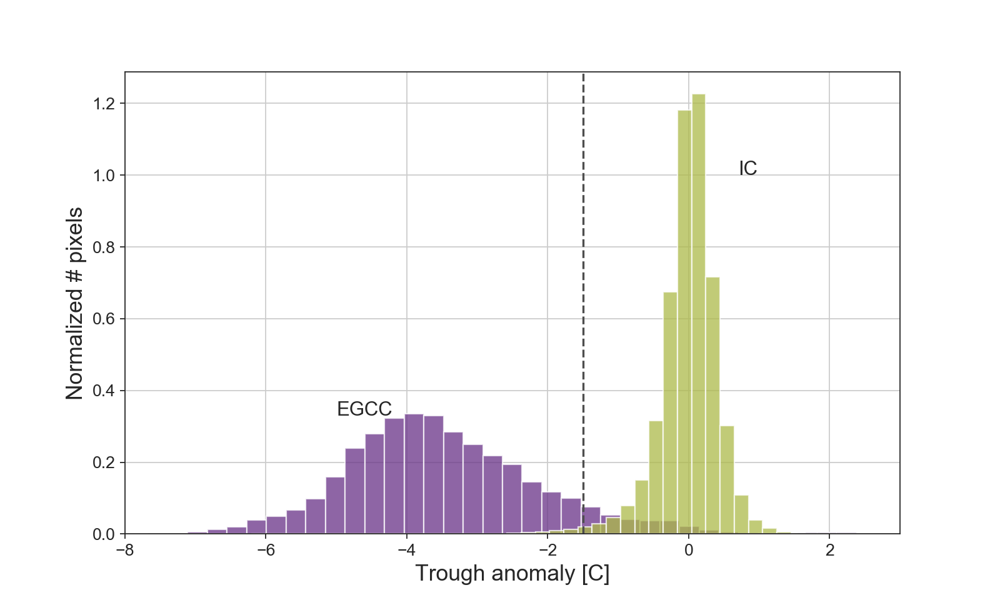

In [463]:
sns.set_style('ticks')
rcParams['figure.figsize'] = 8, 4
rcParams['figure.frameon'] = True

fig, (ax2) = plt.subplots(1, 1, sharey=False,figsize=(10, 6)) 
mu, sigma = 100, 15

# nSh, binsSh, patchesSh = ax2.hist(Shsstconcat, 50, normed=1, facecolor='C3', alpha=0.75)
n, bins, patches = ax2.hist(Egcsstconcat, 50, normed=1, facecolor='C4', alpha=0.75)
n2, bins2, patches2 = ax2.hist(ICsstconcat, 50, normed=1, facecolor='C1', alpha=0.75)
ax2.tick_params(labelsize=12)
ax2.set_xlabel('Trough anomaly [C]',fontsize=16)
ax2.set_ylabel('Normalized # pixels',fontsize=16)
ax2.text(0.7, 1.0, "IC", fontsize=14)
# ax2.text(-2.0, 0.33, "Shelf", fontsize=14)
ax2.text(-5.0, 0.33, "EGCC", fontsize=14)
ax2.set_xlim([-8,3])
ax2.grid(True)

ax2.axvline(x=-1.5, color='0.3',linestyle='dashed',linewidth=1.5)
plt.savefig('/Users/tsnow03/GoogleDrive/User/Docs/PhD_Project/MODIS_Manuscript/Figures/CurrentAnomalyDistrib.jpg', format='jpg', dpi=800)
plt.show()